In [1]:
# Importamos librerias
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import plotly.express as px
import subprocess
import scipy.stats as stats
import graphviz
from mpl_toolkits.basemap import Basemap
from scipy.stats import chi2_contingency
from dython.nominal import associations
from sklearn.utils import resample
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, make_scorer, precision_score, recall_score
from sklearn.metrics import confusion_matrix, classification_report, f1_score, roc_auc_score, roc_curve, auc
from sklearn.feature_selection import SelectKBest
from sklearn.compose import TransformedTargetRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_predict
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as make_pipeline_imb
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest
from IPython.display import Image, display
from sklearn.tree import export_graphviz
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from boruta import BorutaPy
from matplotlib.cm import Blues
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [2]:
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=Warning)

# Parte 1. Obtención de los datos y preparación
### Carga de datos

Los datos se pueden encontrar no solamente en kaggle sino tambien de Medeley Data. El dataset consiste en una colección de registros de reclamaciones de seguro de automóviles. El origen de los datos original proviene de varias empresas aseguradoras en donde por privacidad no se muestra ningún datos de caracter personal o identificativo. 

El repositorio se encuentra en: https://https://data.mendeley.com/drafts/992mh7dk9y

In [3]:
# Importamos el dataset
data = pd.read_csv("insurance_claims.csv")

In [4]:
# Veamos la estructura del dataset
nRow, nCol = data.shape
print(f'Hay {nRow} filas y {nCol} columnas')

Hay 1000 filas y 40 columnas


In [5]:
# Veamos que contiene:

data.head(10)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,2006-10-12,OH,250/500,1000,1351.10,0,478456,...,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,2000-06-04,IN,250/500,1000,1333.35,0,441716,...,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,1990-02-03,IL,100/300,1000,1137.03,0,603195,...,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,1997-02-05,IL,100/300,500,1442.99,0,601734,...,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,2011-07-25,IL,100/300,500,1315.68,0,600983,...,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In [6]:
#Veamos las caracteristicas de las variables
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

 Las variables son: 
 
 - **months_as_customer:**  Meses como cliente.
 - **age:** Edad del asegurado.
 - **policy_number:** Numero de la póliza.
 - **policy_bind_date:** Fecha en la que la póliza se considera oficialmente en vigor. 
 - **policy_state:** Estado de Estados Unidos en el que la póliza es emitida.
 - **policy_csl:**  límite máximo que la póliza pagará por lesiones corporales por persona y máximo por personas accidentadas.
 - **policy_deductable:**  cantidad de dinero que el asegurado paga antes de que la compañía de seguros empiece a cubrir los costos de una reclamación.
 - **policy_annual_premium:** Costo Anual de la Póliza
 - **umbrella_limit:** límite de cobertura proporcionado por una póliza de seguro paraguas. Es una extesión de la cobertura.    
 - **insured_zip:** Código postal del asegurado.  
 - **insured_sex:** Género del asegurado.  
 - **insured_education_level:** Nivel de educación del asegurado. 
 - **insured_occupation:** Ocupación del asegurado. 
 - **insured_hobbies:** Pasatiempos del asegurado.   
 - **insured_relationship:** Estado civil del asegurado.
 - **capital-gains:** Ganancia de capital para la compañia aseguradora. 
 - **capital-loss:** Perdida de capital para la compañia aseguradora.  
 - **incident_date:** Fecha del incidente.
 - **incident_type:** Tipo de incidente. 
 - **collision_type:** Tipo de colisión. 
 - **incident_severity:**  Severidad del incidente.
 - **authorities_contacted:** Indica si las autoridades fueron contactadas.
 - **incident_state:** Estado de Estados Unidos del incidente. 
 - **incident_city:**  Ciudad de Estados Unidos del incidente.            
 - **incident_location:** Direccion de Estados Unidos del incidente. 
 - **incident_hour_of_the_day:** Hora del incidente. 
 - **number_of_vehicles_involved:** Número de Automóviles involucrados. 
 - **property_damage:** Indica si la propiedad esta dañada. 
 - **bodily_injuries:** Indica si hay daños corporales.
 - **witnesses:** Testigos del incidentes (si los hay - cuantos).  
 - **police_report_available:**  Indica si hay reporte policial. 
 - **total_claim_amount:** Cantidad total de reclamación.
 - **injury_claim:** Reclamación por daños fisicos.
 - **property_claim:** Reclamación por daños a la propiedad.
 - **vehicle_claim:**  Reclamación por daños al Automóvil.
 - **auto_make:**  Marca del Automóvil.
 - **auto_model:** Modelo del Automóvil.
 - **auto_year:** Año del Automóvil. 
 - **fraud_reported:** Indica si hay la reclamación es fraude o no. Variable objetivo.            
 - **_c39:**                  

In [7]:
# contemos las variables categóricas
conteo_categorias = data.select_dtypes(include=['object']).shape[1]

# contemos las variables numéricas
conteo_numericas = data.select_dtypes(exclude=['object']).shape[1]

# Imprimimos
print("El número de variables categóricas es:", conteo_categorias)
print("El número de variables numéricas es:", conteo_numericas)


El número de variables categóricas es: 21
El número de variables numéricas es: 19



## Parte 2. Limpieza de Datos


### Manejo de valores nulos:
Veamos los valores nulos

In [8]:
data.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted            91
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

La variable authorities_contacted contiene 91 nulos pero esto puede ser debido a la carateristica de la variable como tal donde no se contactaron ninguna autoridad. Veamos los valores de la variable:

In [9]:
data['authorities_contacted'].unique()

array(['Police', nan, 'Fire', 'Other', 'Ambulance'], dtype=object)

Transformamos los valores Nan a "None" en dicha variable para indicar que no se ha contactado a ninguna autoridad.

In [10]:
#IMPUTACION
# Vamos a reemplazar las variables que contengan "nan" a "None"
categoria = "None"
# Imputamos los valores vacíos con el valor "None"
data['authorities_contacted'].fillna(categoria, inplace=True) #reemplazamos con el valor None

In [11]:
data['authorities_contacted'].unique()

array(['Police', 'None', 'Fire', 'Other', 'Ambulance'], dtype=object)

### Corrección de datos

Cuando vemos la composicion de las variables, observamos que hay valores con caracteres especiales "?".

In [12]:
# Primero, vamos a reemplazar las variables que contengan "?" con valores NaN
data.replace('?', pd.NA, inplace=True) 
data.isna().sum() #sumamos cuantos hay en total en nuestro dataset

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [13]:
# Veamos los valores unicos de las variables con Nan

collision = data['collision_type'].unique()
pro_damage = data['property_damage'].unique()
police_report = data['police_report_available'].unique()

print("valores de collision:", collision)
print("valores de property damage:", pro_damage)
print("valores de police report:", police_report)

valores de collision: ['Side Collision' <NA> 'Rear Collision' 'Front Collision']
valores de property damage: ['YES' <NA> 'NO']
valores de police report: ['YES' <NA> 'NO']


In [14]:
# Contemos los valores NA que contengan fraude
df_fraude = data[data['fraud_reported'] == 'Y']
na_count = df_fraude.isnull().sum()
print(na_count)

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                  16
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                103
bodily_injuries     

Tambien por las caracteriticas de las variables vamos a reemplazar los valores nulos con NO INFO dado la composición y el estudio del comportamiento de las variables ya que el numero de valores que pertenecen al fraude es considerable por lo que no se pueden eliminar ya que se consideraria sesgo. 

In [15]:
# Imputación 
# Vamos a reemplzar los valores nulos de estas variables con " NO INFO"
# para no generar ningun sesgo en nuestro dataset ya que como hay muchos valores en el fraude
# para la investigacion, es ideal que se reporte que no se informo

valor = 'NO INFO'
for column in ['property_damage', 'police_report_available', 'collision_type']:
    data[column].fillna(valor, inplace=True)
    


In [16]:
#Veamos de nuevo si hay numeros nulos en cada una de las variables
data.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

Observamos que las variables _c39 contiene 1000 nulos. Vamos a eliminar esta variable ya que no la vamos a usar.

In [17]:
#Eliminemos las columnas que no son necesarias
data = data.drop('_c39', axis = 1)

In [18]:
# Veamos los nulos en nuestro dataset:
# Calculamos la suma total de nulos
total_nulos = data.isnull().sum().sum()
print("Suma total de valores nulos en el conjunto de datos 'data':", total_nulos)

Suma total de valores nulos en el conjunto de datos 'data': 0


Ya en nuestro dataset no tenemos ningún nulo.

In [19]:
# Transformemos las variables categoricas a mayusculas
# Identificamos las columnas categóricas
columnas_categoricas = data.select_dtypes(include=['object']).columns

# Convierte los valores de las columnas categóricas a mayúsculas
for columna in columnas_categoricas:
    data[columna]  = data[columna].str.upper()

In [20]:
# Convertimos las variables a categoricas

for columna in data.select_dtypes(include=['object']).columns:
    data[columna] = data[columna].astype('category')
    
# Imprimimos los tipos de datos después de la conversión
print("\nTipos de datos después de la conversión:")
print(data.dtypes)


Tipos de datos después de la conversión:
months_as_customer                int64
age                               int64
policy_number                     int64
policy_bind_date               category
policy_state                   category
policy_csl                     category
policy_deductable                 int64
policy_annual_premium           float64
umbrella_limit                    int64
insured_zip                       int64
insured_sex                    category
insured_education_level        category
insured_occupation             category
insured_hobbies                category
insured_relationship           category
capital-gains                     int64
capital-loss                      int64
incident_date                  category
incident_type                  category
collision_type                 category
incident_severity              category
authorities_contacted          category
incident_state                 category
incident_city                  categor

In [21]:
# Convertimos las variables que son numericas que se consideran category
data['insured_zip'] = data['insured_zip'].astype("category")

In [22]:
data.head(10)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,SAAB,92X,2004,Y
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,NO INFO,5070,780,780,3510,MERCEDES,E400,2007,Y
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,DODGE,RAM,2007,N
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,CHEVROLET,TAHOE,2014,Y
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,ACCURA,RSX,2009,N
5,256,39,104594,2006-10-12,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,SAAB,95,2003,Y
6,137,34,413978,2000-06-04,IN,250/500,1000,1333.35,0,441716,...,0,NO INFO,78650,21450,7150,50050,NISSAN,PATHFINDER,2012,N
7,165,37,429027,1990-02-03,IL,100/300,1000,1137.03,0,603195,...,2,YES,51590,9380,9380,32830,AUDI,A5,2015,N
8,27,33,485665,1997-02-05,IL,100/300,500,1442.99,0,601734,...,1,YES,27700,2770,2770,22160,TOYOTA,CAMRY,2012,N
9,212,42,636550,2011-07-25,IL,100/300,500,1315.68,0,600983,...,1,NO INFO,42300,4700,4700,32900,SAAB,92X,1996,N


In [23]:
conteo_categorias = data.select_dtypes(include=['category']).shape[1]
conteo_numericas = data.select_dtypes(exclude=['category']).shape[1]

# Imprimimos el número de variables originales categóricas y numéricas
print("El número de variables categóricas es:", conteo_categorias)
print("El número de variables numéricas es:", conteo_numericas)

El número de variables categóricas es: 22
El número de variables numéricas es: 17


# Parte 3. Análisis de variables

## Análisis Univariable

Vamos a realizar un análisis de cada una de las variables para ver como se comportan de forma individual.

### Variables númericas
Veamos como se comportan las variables.

In [24]:
# Observemos las estadisticas basicas
pd.set_option('display.float_format', '{:.2f}'.format)
columnas_numericas = data.select_dtypes(include=['number'])
columnas_numericas.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00
mean,203.95,38.95,546238.65,1136.00,1256.41,1101000.00,25126.10,-26793.70,11.64,1.84,0.99,1.49,52761.94,7433.42,7399.57,37928.95,2005.10
std,115.11,9.14,257063.01,611.86,244.17,2297406.60,27872.19,28104.10,6.95,1.02,0.82,1.11,26401.53,4880.95,4824.73,18886.25,6.02
min,0.00,19.00,100804.00,500.00,433.33,-1000000.00,0.00,-111100.00,0.00,1.00,0.00,0.00,100.00,0.00,0.00,70.00,1995.00
25%,115.75,32.00,335980.25,500.00,1089.61,0.00,0.00,-51500.00,6.00,1.00,0.00,1.00,41812.50,4295.00,4445.00,30292.50,2000.00
50%,199.50,38.00,533135.00,1000.00,1257.20,0.00,0.00,-23250.00,12.00,1.00,1.00,1.00,58055.00,6775.00,6750.00,42100.00,2005.00
75%,276.25,44.00,759099.75,2000.00,1415.70,0.00,51025.00,0.00,17.00,3.00,2.00,2.00,70592.50,11305.00,10885.00,50822.50,2010.00
max,479.00,64.00,999435.00,2000.00,2047.59,10000000.00,100500.00,0.00,23.00,4.00,2.00,3.00,114920.00,21450.00,23670.00,79560.00,2015.00


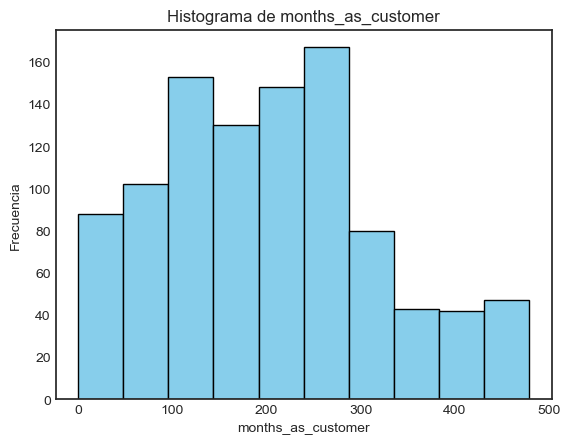

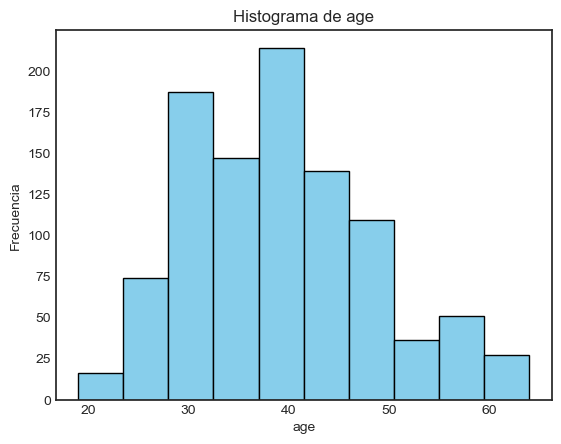

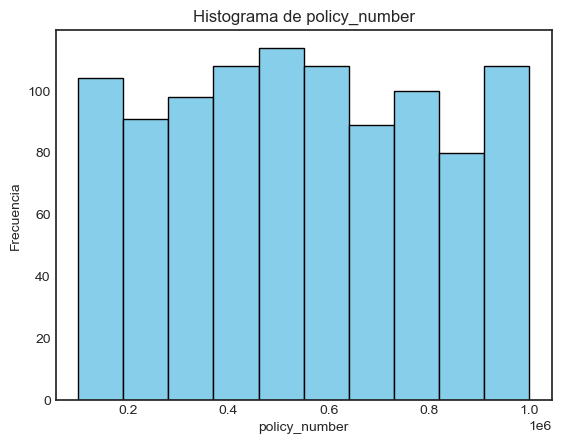

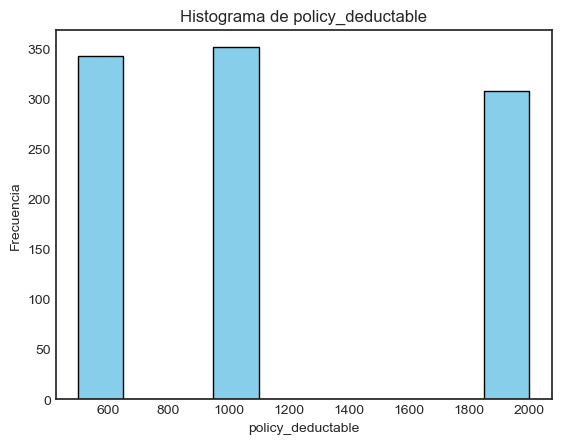

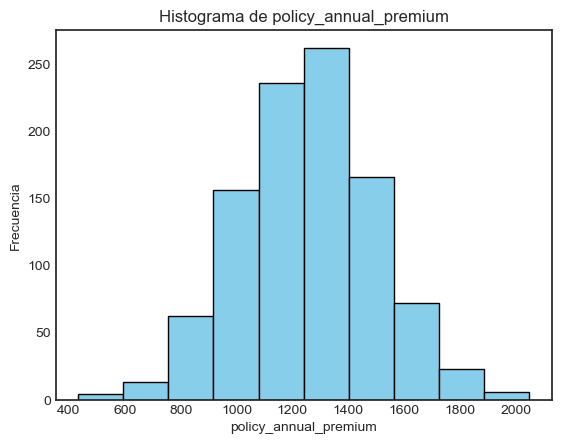

...

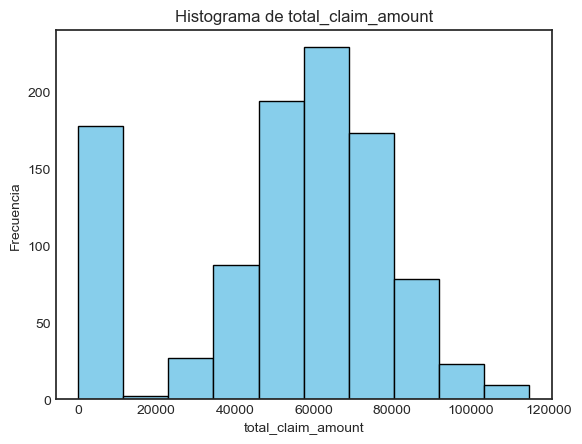

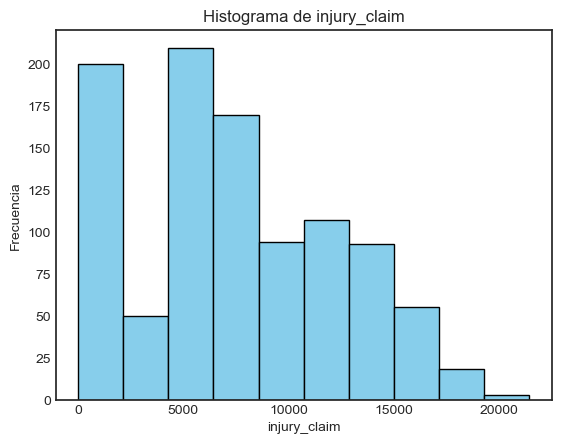

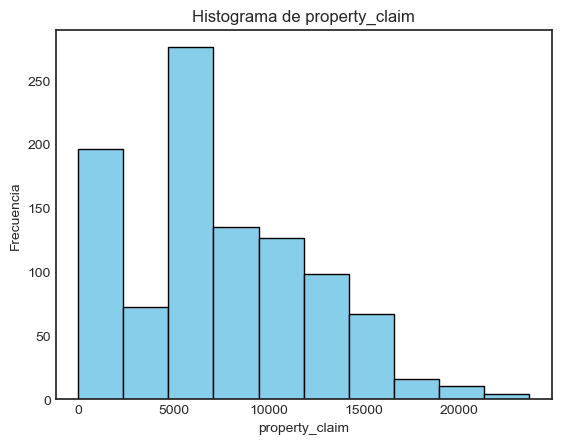

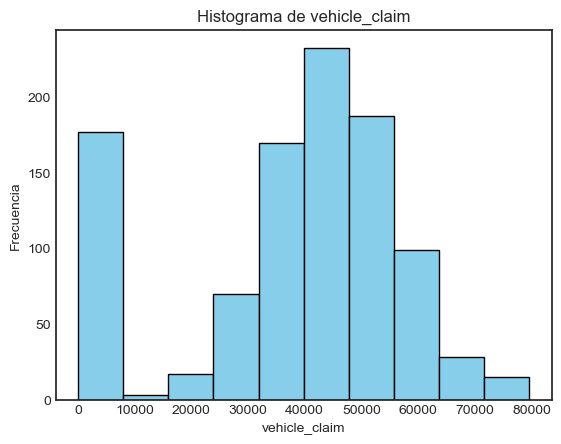

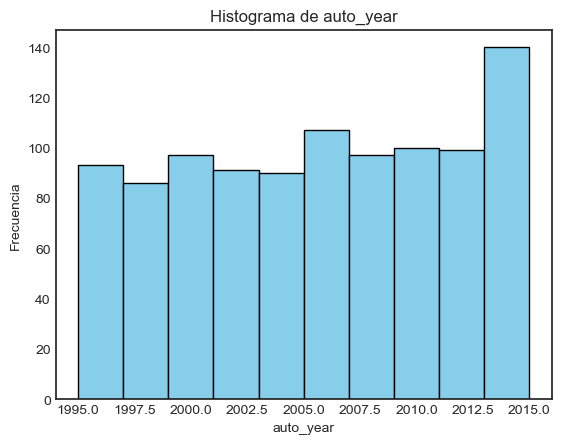

In [25]:
# Grafiquemos
plt.style.use('seaborn-white')

for columna in columnas_numericas.columns:
    plt.figure()  
    n, bins, patches = plt.hist(columnas_numericas[columna], edgecolor='black', color='skyblue')
    plt.grid(False) 
    plt.title(f'Histograma de {columna}')
    plt.xlabel(columna)
    plt.ylabel('Frecuencia')
    plt.show()


In [26]:
# Creamos una tabla de frecuencia para cada columna
for columna in columnas_numericas.columns:
    print(f"Tabla de Frecuencia para '{columna}':")
    tabla_frecuencia = columnas_numericas[columna].value_counts().sort_index()
    print(tabla_frecuencia)
    print("\n") 


Tabla de Frecuencia para 'months_as_customer':
months_as_customer
0      1
1      3
2      2
3      2
4      3
      ..
473    1
475    2
476    1
478    2
479    2
Name: count, Length: 391, dtype: int64


Tabla de Frecuencia para 'age':
age
19     1
20     1
21     6
22     1
23     7
24    10
25    14
26    26
27    24
28    30
29    35
30    42
31    42
32    38
33    39
34    44
35    32
36    32
37    41
38    42
39    48
40    38
41    45
42    32
43    49
44    32
45    26
46    33
47    24
48    25
49    14
50    13
51     9
52     4
53    13
54    10
55    14
56     8
57    16
58     8
59     5
60     9
61    10
62     4
63     2
64     2
Name: count, dtype: int64


Tabla de Frecuencia para 'policy_number':
policy_number
100804    1
101421    1
104594    1
106186    1
106873    1
         ..
996253    1
996850    1
998192    1
998865    1
999435    1
Name: count, Length: 1000, dtype: int64


Tabla de Frecuencia para 'policy_deductable':
policy_deductable
500     342
1000    35

**Observaciones:**

- En la variable "AGE" vemos que las edades comprenden entre 19 años y 64 años lo que es un rango normal.
- En la variable 'MONTHS_AS_CUSTOMER' el valor más pequeño es 0, lo que puede estar relacionado con que el cliente tiene solo días de ser cliente y aún no ha cumplido el mes de serlo. Tiene un rango de 0 meses a 479 meses, donde la mitad de los clientes tienen más de 200 meses.
- En la variable 'POLICY_DEDUCTABLE' Tiene 3 valores (500, 1000 y 2000). El 34% de los clientes ha pagado 500 dólares. 
- En la variable 'POLICY_ANNUAL_PREMIUM'el rango va desde 433.33 hasta 2047.59. El promedio del costo es de 1256.41 dólares. 
- En la variable 'UMBRELLA_LIMIT' hay un valor negativo de -1000000 lo cual tenemos que averiguar ya que no es normal. El 80% de los asegurados tiene un valor de 0 en dicha cobertura adicional.
- En la variable 'CAPITAL-GAINS' el rango es normal ya que son valores positivos comenzando desde cero. Rango de 0 a 100500. La ganancia del 51% de las pólizas reclamadas es de 0.
- En la variable 'CAPITAL-LOSS'el rango es normal ya que indica perdidas por lo que los valores son negativos y comienza desde el cero. Rango de 0 a – 111100. El 47% de las perdidas de la aseguradora es de 0.
- En la variable 'INCIDENT_HOUR_OF_THE_DAY' el rango es normal ya que la hora va desde 0 hasta 23. La cantidad más alta de siniestros con un 27% ocurrieron en las horas de la tarde (de 12 a 17). La cantidad más baja fue 24% en las horas de la mañana (6 a 11).
- En la variable 'NUMBER_OF_VEHICLES_INVOLVED' Va desde 1 a 4 vehículos donde el 58% estuvo reportado 1 vehículo.
- En la variable 'BODILY_INJURIES' Rango de 0 a 2. El 66% de los reclamantes registró al menos 1 daño corporal. 
- En la variable 'WITNESSES' Rango de 0 a 3. El 75% de los siniestros tienen al menos 1 testigo.
- En la variable 'TOTAL_CLAIM_AMOUNT' Rango de 100 dólares a 114,920 dólares. Compuesto por INJURY_CLAIM, PROPERTY_CLAIM Y VEHICLE_CLAIM.
- En la variable 'INJURY_CLAIM' La cantidad mínima reclamada es de 0 dólares y la cantidad máxima reclamada es 21,450 dólares.
- En la variable 'PROPERTY_CLAIM' La cantidad mínima reclamada es de 0 dólares y la cantidad máxima reclamada es 23,670 dólares.
- En la variable 'VEHICLE_CLAIM' La cantidad mínima reclamada es de 70 dólares y la cantidad máxima reclamada es 79,560 dólares.
- En la variable 'AUTO_YEAR' Va desde el año 1995 hasta 2015. El 53% de los vehículos son fabricados en los años desde 2000 a 2010.

## Detección y tratamiento de outliers:

Con lo anterior observado comprobemos usando la detencción de outliers:

In [27]:
# Diccionario para almacenar los outliers de cada columna
outliers = {}

# Calculamos el IQR (Rango Intercuartil) y encontramos los outliers
for columna in columnas_numericas.columns:
    Q1 = data[columna].quantile(0.25)
    Q3 = data[columna].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR

    # Filtramos los valores fuera de los límites inferior y superior
    filtro = (data[columna] < limite_inferior) | (data[columna] > limite_superior)
    outliers[columna] = data[columna][filtro]

# Veamos
for columna, valores in outliers.items():
    print(f"Outliers en '{columna}':")
    print(valores)
    print(" ")

Outliers en 'months_as_customer':
Series([], Name: months_as_customer, dtype: int64)
 
Outliers en 'age':
67     64
538    63
588    64
947    63
Name: age, dtype: int64
 
Outliers en 'policy_number':
Series([], Name: policy_number, dtype: int64)
 
Outliers en 'policy_deductable':
Series([], Name: policy_deductable, dtype: int64)
 
Outliers en 'policy_annual_premium':
43     538.17
133   1922.84
229   2047.59
248    433.33
544   1927.87
681    566.11
747   1969.63
763    484.67
796   1935.85
Name: policy_annual_premium, dtype: float64
 
Outliers en 'umbrella_limit':
1      5000000
2      5000000
3      6000000
4      6000000
10     4000000
        ...   
977    4000000
987    4000000
990    3000000
997    3000000
998    5000000
Name: umbrella_limit, Length: 202, dtype: int64
 
Outliers en 'capital-gains':
Series([], Name: capital-gains, dtype: int64)
 
Outliers en 'capital-loss':
Series([], Name: capital-loss, dtype: int64)
 
Outliers en 'incident_hour_of_the_day':
Series([], Name: inc

Veamos graficamente:

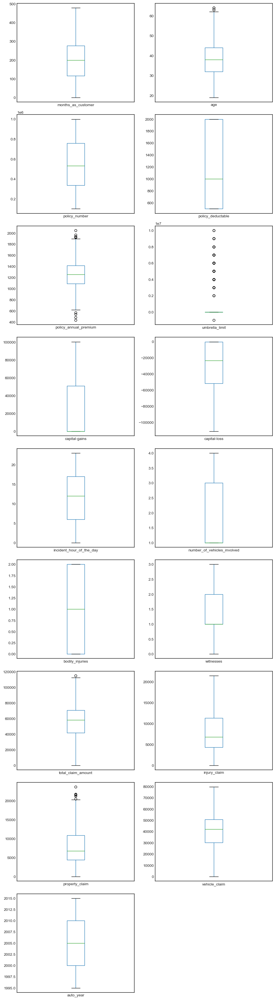

In [28]:
# Calculamos el número de filas necesario para dos columnas
n_filas = -(-len(columnas_numericas.columns) // 2)  # Redondeo hacia arriba

# Creamos una figura y un conjunto de subgráficos
fig, axes = plt.subplots(nrows=n_filas, ncols=2, figsize=(10, 4 * n_filas))
axes = axes.flatten()  # Aplanar la matriz de ejes para facilitar el acceso

# Creamos un boxplot para cada columna numérica
for i, col in enumerate(columnas_numericas.columns):
    data.boxplot(column=col, ax=axes[i], grid=False)

# Ocultamos los ejes adicionales si el número de columnas no es par
if len(columnas_numericas.columns) % 2 != 0:
    axes[-1].axis('off')

# Graficamos
plt.tight_layout()
plt.show()

Observando las gráficas y los valores hallados anteriormente, encontramos que existen valores que son outliers pero dado las caracteristicas de las variables representan una situación normal, sin embargo, en el caso de la variable 'UMBRELLA_LIMIT' comprobamos la existencia de valores negativos. Veamos:

In [29]:
pd.set_option('display.float_format', '{:.2f}'.format)
data['umbrella_limit'].value_counts()


umbrella_limit
 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: count, dtype: int64

Como vemos el valor atipico negativo -1000000, del cual dicho valor solo lo tiene una persona, vamos a filtrar para ver la información de dicho asegurado.

In [30]:
#Filtramos
valor_deseado = -1000000 
fila_filtrada = data[data['umbrella_limit'] == valor_deseado]

fila_filtrada.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
290,284,42,526039,1995-05-04,OH,100/300,500,1338.54,-1000000,438178,...,1,NO INFO,94160,8560,17120,68480,CHEVROLET,MALIBU,1996,N


Vamos a realizar una imputación para tratar este valor con la moda. Al ser un solo valor al que vamos a tratar no perjudica nuestro dataset.

In [31]:
# Calculamos la moda de la columna
moda = data['umbrella_limit'].mode()[0]

# Imputamos con la moda
data.loc[data['umbrella_limit'] == -1000000, 'umbrella_limit'] = moda

Veamos:

In [32]:
# Seleccionamos la observación con índice 290 de la cual hemos hecho el cambio
observacion = pd.DataFrame(data.loc[290]).T
observacion.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
290,284,42,526039,1995-05-04,OH,100/300,500,1338.54,0,438178,...,1,NO INFO,94160,8560,17120,68480,CHEVROLET,MALIBU,1996,N


Ahora el valor de 'UMBRELLA_LIMIT' es de 0, la cual es la moda de la variable. 

## Variables Categóricas

Veamos como se comportan las variables Categóricas de forma individual.

### Variable Target: 'FRAUD_REPORTED'

Nuestra variable objetivo es la variable 'FRAUD_REPORTED' que indica si existe fraude o no. Vamos a ver su composición:

In [33]:
# Calculamos el conteo de valores para la columna 'fraud_reported'
conteo = data['fraud_reported'].value_counts().reset_index()
conteo.columns = ['fraud_reported', 'count']

# Definimos una paleta de colores en tonos de azul
colores_azules = ['#1f77b4', '#aec7e8', '#4c78a8', '#2b7bba', '#73a2c6', '#9edae5']

# Graficamos
fig = px.pie(conteo, values='count', names='fraud_reported', title='Distribución de Reportes de Fraude',
             hover_data=['count'], labels={'count':'Total'}, color_discrete_sequence=colores_azules)
fig.update_traces(textposition='inside', textinfo='percent+label')



Encontramos que nuestra variable esta desbalanceada. Con un 73.3% donde no hay fraude y un 24.7% donde hay fraude.

Vamos a transformar nuestra variable objetivo con valores numericos para su posterior tratamiento:

In [34]:
data['fraud_reported'] = data['fraud_reported'].map({'Y': 1, 'N': 0})
data['fraud_reported'] = data['fraud_reported'].astype('category') 

In [35]:
conteo = data['fraud_reported'].value_counts()
conteo

fraud_reported
0    753
1    247
Name: count, dtype: int64

Tambien vamos a transformar las variables que consideramos categoricas a pesar de ser numericas 

### Otras variables categóricas

Sigamos revisando las demás variables.

In [36]:
# Seleccionamos las columnas categóricas y las agrupamos
col_categoricas = data.select_dtypes(include=['category'])

# Creamoa una tabla de frecuencia para cada columna categórica
for columna in col_categoricas.columns:
    print(f"Tabla de Frecuencia para '{columna}':")
    
    # Calcular la tabla de frecuencia
    tabla_frecuencia = col_categoricas[columna].value_counts().sort_index()
    
    print(tabla_frecuencia)
    print("\n") 


Tabla de Frecuencia para 'policy_bind_date':
policy_bind_date
1990-01-08    1
1990-01-27    1
1990-02-01    1
1990-02-03    1
1990-02-08    1
             ..
2014-12-13    1
2014-12-28    1
2015-01-03    1
2015-01-17    1
2015-02-22    1
Name: count, Length: 951, dtype: int64


Tabla de Frecuencia para 'policy_state':
policy_state
IL    338
IN    310
OH    352
Name: count, dtype: int64


Tabla de Frecuencia para 'policy_csl':
policy_csl
100/300     349
250/500     351
500/1000    300
Name: count, dtype: int64


Tabla de Frecuencia para 'insured_zip':
insured_zip
430104    1
430141    1
430232    1
430380    1
430567    1
         ..
620737    1
620757    1
620819    1
620869    1
620962    1
Name: count, Length: 995, dtype: int64


Tabla de Frecuencia para 'insured_sex':
insured_sex
FEMALE    537
MALE      463
Name: count, dtype: int64


Tabla de Frecuencia para 'insured_education_level':
insured_education_level
ASSOCIATE      145
COLLEGE        122
HIGH SCHOOL    160
JD             16

Grafiquemos:

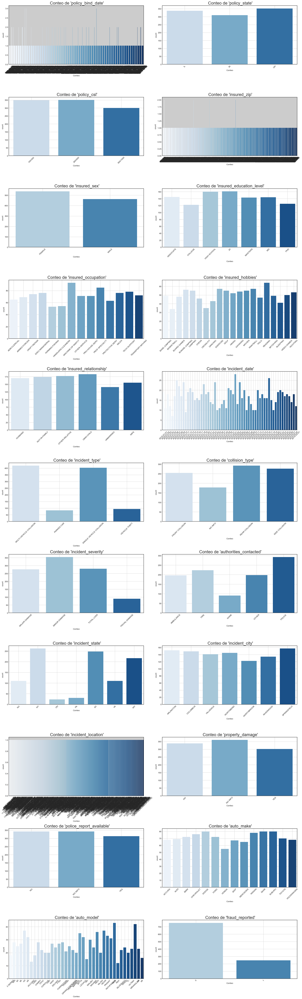

In [37]:
# Calculamos el número de filas necesarias para los subgráficos
num_columnas = len(col_categoricas.columns)
num_filas = (num_columnas + 1) // 2

# Graficamos
plt.style.use('seaborn-white')
plt.figure(figsize=(20, 6 * num_filas))

for i, columna in enumerate(col_categoricas.columns, 1):
    plt.subplot(num_filas, 2, i)
    sns.countplot(x=columna, data=data, palette='Blues')
    plt.title(f" Conteo de '{columna}'", fontsize=20)
    plt.xticks(rotation=45)
    plt.xlabel('Conteo')
    plt.grid(True)
    plt.tight_layout()

plt.show()


** Observaciones:**
- En la variable 'POLICY_STATE': Tiene tres valores (IL, IN y OH). El estado con más reclamaciones es ‘OH’ con el 35% de las reclamaciones. 
- En la variable 'INSURED_SEX' Las mujeres representan el 54% de los seguradores que reclaman los siniestros y los hombres representan el restante de la población.
- En la variable 'INSURED_EDUCATION_LEVEL' JD representa el nivel de educación con más reclamaciones con el 16.1% y las que menos fueron los que tienen educación COLLEGE con 122 personas.
- En la variable 'INSURED_OCCUPATION', la ocupación que más ha realizado reclamos es MACHINE-OP-INSPCT con 93 personas (9.3%) y la que menos es PROTECTIVE-SERV con 63 personas. 
- En la variable 'INSURED_HOBBIES' La afición del asegurado que cuenta con más reclamaciones es ‘READING’ con el 6.4%. La que menos se realiza es BASKETBALL con el 3% de los asegurados.
- En la variable 'INSURED_RELATIONSHIP', La categoría más alta es OWN-CHILD con 18% de los reclamos y la que tiene menos porcentaje con 14% es UNMARRIED. 
- En la variable 'INCIDENT_TYPE', El incidente con más porcentaje de reclamaciones es ‘MULTI-VEHICLE COLLISION’ con el 42% y la que menos es ‘PARKED CAR’ con un 8% de los incidentes. Esto indica que donde hay más reclamaciones es cuando los vehículos están en movimiento.
- En la variable 'COLLISION_TYPE', ‘REAR COLLISION’ representa el mayor tipo con el 29% de las reclamaciones. 
- En la variable 'INCIDENT_SEVERITY', ‘MINOR DAMAGE’ representa la mayor severidad con 35% de las reclamaciones. La menor es ‘TRIVIAL DAMAGE’ con 9%. Esto nos indica que la mayoría de los incidentes se reporta una clase de daño.Nos indica que la mayoría de incidentes se reporta una clase de daño.
- En la variable 'AUTHORITIES_CONTACTED', La policía representa la autoridad con mayor contacto con un 29% de las reclamaciones.
- En la variable 'INCIDENT_STATE', El estado con mayores siniestros es ‘NY’ con 26%. El estado con menos siniestros fue OH con el 2% de las reclamaciones. Se observó una disparidad amplia entre la que tiene más incidentes y la que tiene menos de estas.
- En la variable 'INCIDENT_CITY', la ciudad con más reclamaciones fue SPRINGFIELD con 16% de las reclamaciones y la que menos fue NORTHBROOK con 12% de las reclamaciones.
- En la variable 'PROPERTY_DAMAGE', las reclamaciones más frecuentes con 360 no hay ninguna información mientras que la que menos representa es la de No con 338 reclamaciones.
- En la variable 'POLICE_REPORT_AVAILABLE' El 34% de las reclamaciones no informó la existencia de un reporte policial. También esa misma cantidad reportó que no hubo reporte policial. 
- En la variable 'INCIDENT_DATE'La fecha más antigua es 2015-01-01 y la más reciente es 2015-03-01. Lo que corresponde al rango entre enero del 2015 y el 1 de marzo del 2015.



# Analisis Multivariable

Veamos como se comportan las variables con respecto a otras. Primero vamos a realizar las variables vs la varaible target. 

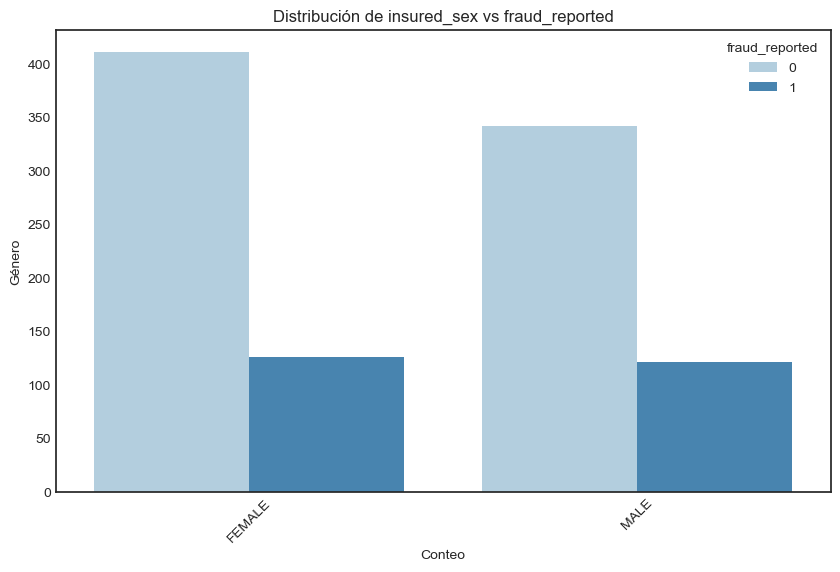

In [38]:
# Graficamos 
plt.figure(figsize=(10, 6))
sns.countplot(x=data['insured_sex'], hue='fraud_reported', data=data, palette='Blues')
plt.title(f'Distribución de insured_sex vs fraud_reported')
plt.xlabel('Conteo')
plt.ylabel('Género')
plt.xticks(rotation=45)
plt.show()



In [39]:
distribution_sex_fraud = data.groupby(['insured_sex', 'fraud_reported']).size().unstack(fill_value=0)
print(distribution_sex_fraud)

fraud_reported    0    1
insured_sex             
FEMALE          411  126
MALE            342  121


Las mujeres registran 54% de las reclamaciones (411) más que los hombres con un 46& (342) en el caso donde no hay reclamaciones fraudulentas. Cuando lo hay, la diferencia entre hombres y mujeres es muy pequeña (5 mujeres más), es decir, una diferencia de 1%.

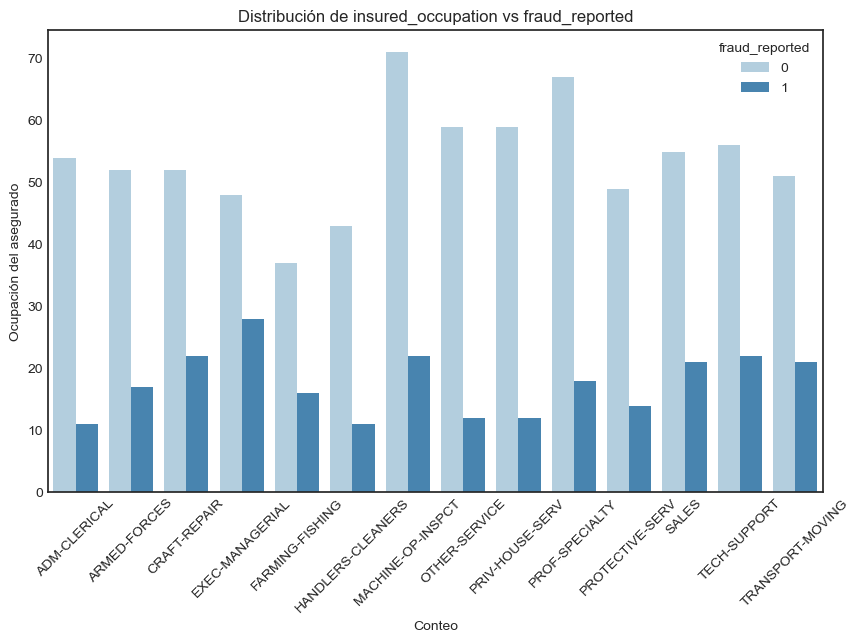

In [40]:
# Graficamos 
plt.figure(figsize=(10, 6))
sns.countplot(x=data['insured_occupation'], hue='fraud_reported', data=data, palette='Blues')
plt.title(f'Distribución de insured_occupation vs fraud_reported')
plt.xticks(rotation=45)
plt.xlabel('Conteo')
plt.ylabel('Ocupación del asegurado')
plt.show()



In [41]:
distribution_occupation_fraud = data.groupby(['insured_occupation', 'fraud_reported']).size().unstack(fill_value=0)
print(distribution_occupation_fraud)

fraud_reported       0   1
insured_occupation        
ADM-CLERICAL        54  11
ARMED-FORCES        52  17
CRAFT-REPAIR        52  22
EXEC-MANAGERIAL     48  28
FARMING-FISHING     37  16
HANDLERS-CLEANERS   43  11
MACHINE-OP-INSPCT   71  22
OTHER-SERVICE       59  12
PRIV-HOUSE-SERV     59  12
PROF-SPECIALTY      67  18
PROTECTIVE-SERV     49  14
SALES               55  21
TECH-SUPPORT        56  22
TRANSPORT-MOVING    51  21


En el caso donde hay fraude, la ocupación que registra más reclamaciones es la de EXEC-MANAGERIAL con el 11% de las reclamaciones. Donde no hay fraude, la profesión con más reclamaciones es la de MACHINE-OP-INSPCT con 9% de las reclamaciones.

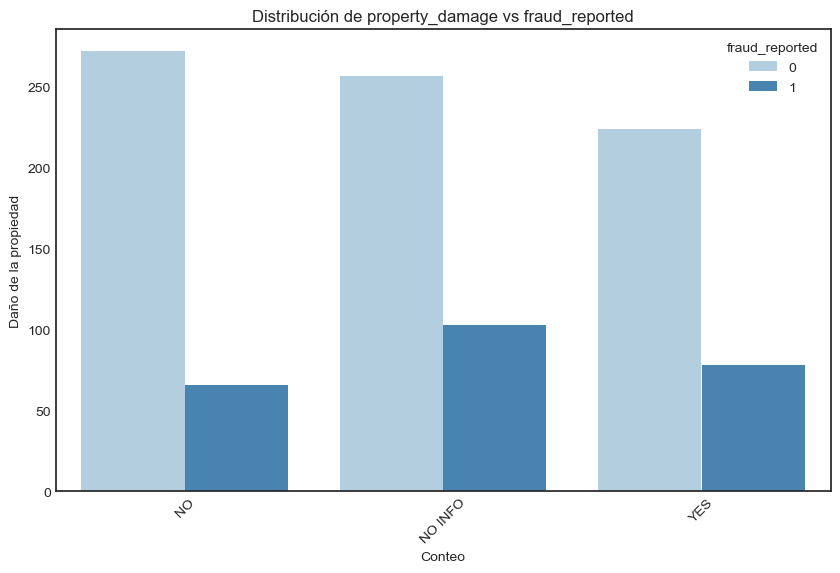

In [42]:
# Graficamos 
plt.figure(figsize=(10, 6))
sns.countplot(x=data['property_damage'], hue='fraud_reported', data=data, palette='Blues')
plt.title(f'Distribución de property_damage vs fraud_reported')
plt.xticks(rotation=45)
plt.xlabel('Conteo')
plt.ylabel('Daño de la propiedad')
plt.show()


In [43]:
distribution_property_fraud = data.groupby(['property_damage', 'fraud_reported']).size().unstack(fill_value=0)
print(distribution_property_fraud)

fraud_reported     0    1
property_damage          
NO               272   66
NO INFO          257  103
YES              224   78


En el caso donde hay fraude, el daño a la propiedad que registra más reclamaciones es la de No info con 103 reclamaciones. Esto puede indicar un patrón en la detencción del fraude ya que no se reporta ninguna acción.  Donde no hay fraude, el daño a la propiedad con más reclamaciones es la de no hay daño con 272 reclamaciones.

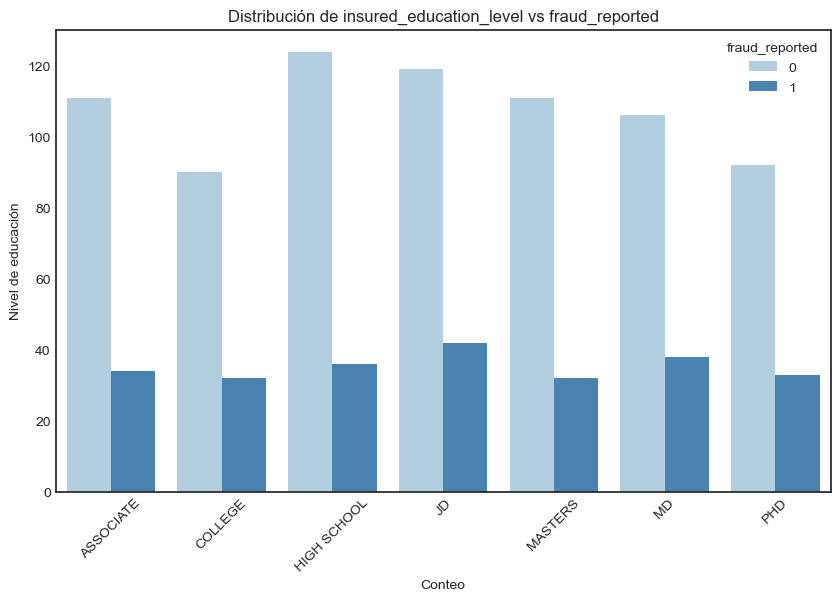

In [44]:
# Graficamos 
plt.figure(figsize=(10, 6))
sns.countplot(x=data['insured_education_level'], hue='fraud_reported', data=data, palette='Blues')
plt.title(f'Distribución de insured_education_level vs fraud_reported')
plt.xticks(rotation=45)
plt.xlabel('Conteo')
plt.ylabel('Nivel de educación')
plt.show()


In [45]:
distribution_education_fraud = data.groupby(['insured_education_level', 'fraud_reported']).size().unstack(fill_value=0)
print(distribution_education_fraud)

fraud_reported             0   1
insured_education_level         
ASSOCIATE                111  34
COLLEGE                   90  32
HIGH SCHOOL              124  36
JD                       119  42
MASTERS                  111  32
MD                       106  38
PHD                       92  33


En el caso donde hay fraude, el grado de educación que registra más con más reclamaciones es la de JD con un 17% de las reclamaciones. No existe diferencias tan altas entre los diferentes grados de escolarización. 
Donde no hay fraude, el grado de educación con más reclamaciones es la de HIGH SCHOOL con 16% de las reclamaciones.

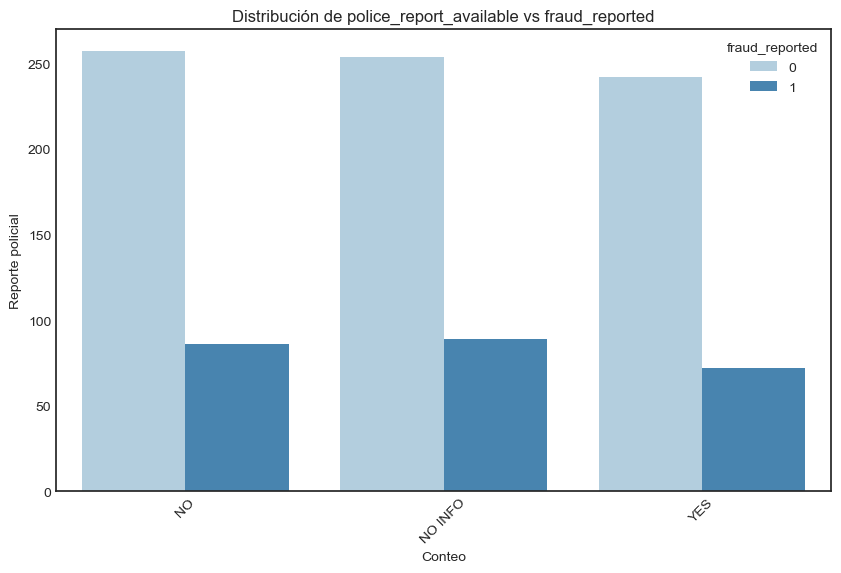

In [46]:
# Graficamos 
plt.figure(figsize=(10, 6))
sns.countplot(x=data['police_report_available'], hue='fraud_reported', data=data, palette='Blues')
plt.title(f'Distribución de police_report_available vs fraud_reported')
plt.xlabel('Conteo')
plt.ylabel('Reporte policial')
plt.xticks(rotation=45)
plt.show()



In [47]:
distribution_police_fraud = data.groupby(['police_report_available', 'fraud_reported']).size().unstack(fill_value=0)
print(distribution_police_fraud)

fraud_reported             0   1
police_report_available         
NO                       257  86
NO INFO                  254  89
YES                      242  72


En el caso donde hay fraude, si hay reporte policial existente con más reclamaciones es la de No info con un 36% de las reclamaciones. No existe diferencias tan altas entre si hay reporte o no pero es de notar que donde no hay ninguna información o donde no hay reporte policial son las que tienen más reclamaciones. Donde no hay fraude, con más reclamaciones es donde no hay reporte policial con el 34% de las reclamaciones.

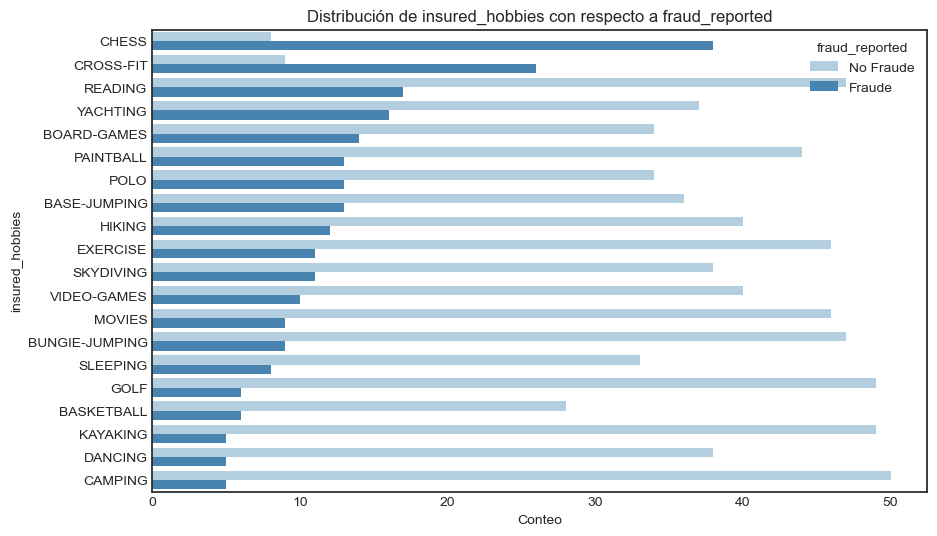

In [48]:
# Veamos los hobbies cuando hay fraude o no

# Obtenemos las categorías ordenadas por cantidad de fraude (fraud_reported=1)
order = data[data['fraud_reported'] == 1]['insured_hobbies'].value_counts().index

# Graficamos
plt.figure(figsize=(10, 6))
sns.countplot(y='insured_hobbies', data=data, order=order, hue='fraud_reported', palette='Blues')
plt.title('Distribución de insured_hobbies con respecto a fraud_reported')
plt.xlabel('Conteo')
plt.ylabel('insured_hobbies')
plt.legend(title='fraud_reported', loc='upper right', labels=['No Fraude', 'Fraude'])
plt.show()



In [49]:
# Calculamos la distribución de INSURED_HOBBIES con respecto a FRAUD_REPORTED
distribution_hobbies_fraud = data.groupby(['insured_hobbies', 'fraud_reported']).size().unstack(fill_value=0)

# Ordenamos las categorías de INSURED_HOBBIES por la cantidad de fraude (fraud_reported=1) de mayor a menor
distribution_hobbies_fraud = distribution_hobbies_fraud.sort_values(by=1, ascending=False)

print(distribution_hobbies_fraud)

fraud_reported    0   1
insured_hobbies        
CHESS             8  38
CROSS-FIT         9  26
READING          47  17
YACHTING         37  16
BOARD-GAMES      34  14
PAINTBALL        44  13
POLO             34  13
BASE-JUMPING     36  13
HIKING           40  12
EXERCISE         46  11
SKYDIVING        38  11
VIDEO-GAMES      40  10
MOVIES           46   9
BUNGIE-JUMPING   47   9
SLEEPING         33   8
GOLF             49   6
BASKETBALL       28   6
KAYAKING         49   5
DANCING          38   5
CAMPING          50   5


-	La afición del asegurado que cuenta con más reclamaciones fraudulentas es CHESS con 15% de ellas y la que menos presenta es CAMPING con 2%.

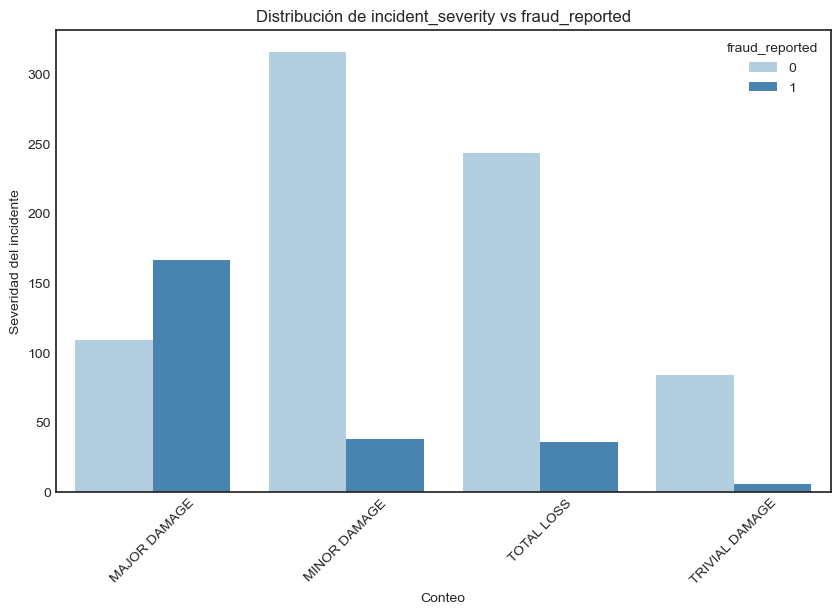

In [50]:
# Graficamos 
plt.figure(figsize=(10, 6))
sns.countplot(x=data['incident_severity'], hue='fraud_reported', data=data, palette='Blues')
plt.title(f'Distribución de incident_severity vs fraud_reported')
plt.xticks(rotation=45)
plt.xlabel('Conteo')
plt.ylabel('Severidad del incidente')
plt.show()

In [51]:
distribution_severity_fraud = data.groupby(['incident_severity', 'fraud_reported']).size().unstack(fill_value=0)
print(distribution_severity_fraud)

fraud_reported       0    1
incident_severity          
MAJOR DAMAGE       109  167
MINOR DAMAGE       316   38
TOTAL LOSS         244   36
TRIVIAL DAMAGE      84    6


En el caso donde hay fraude, la severidad del incidente con más reclamaciones es la de MAJOR DAMAGE con 68% de las reclamaciones. Existe diferencias altas entre la que cuenta más reclamaciones y la que le siguen, esto puede ser debido a que se intenta reclamar el daño más alto posible. Esto se ve cuando el daño menos reclamado es la de TRIVIAL DAMAGE con el 2% de las reclamaciones. Donde no hay fraude, con más reclamaciones es donde hay MINOR DAMAGE con el 42% de las reclamaciones. Esta variable puede ayudarnos a explicar el fraude.

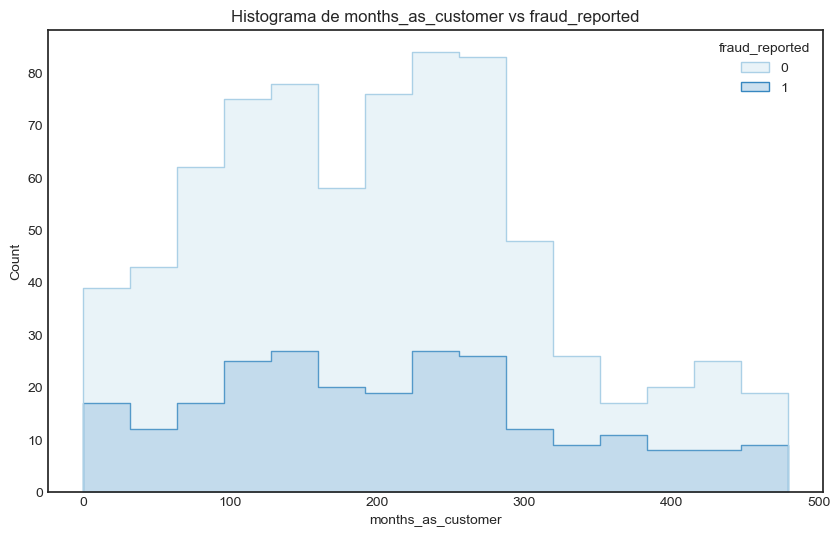

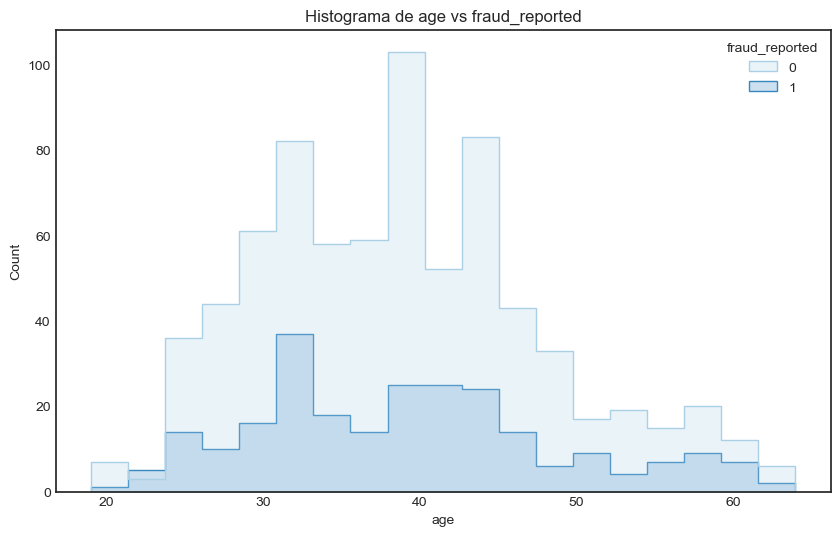

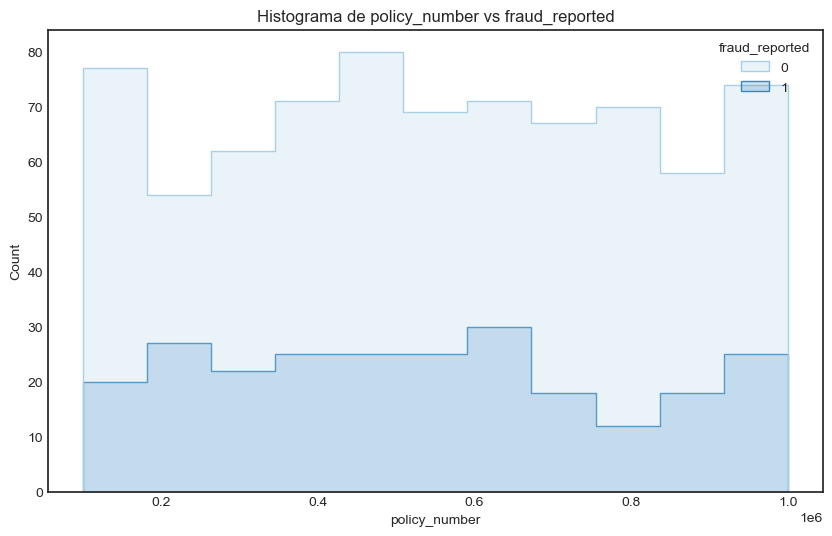

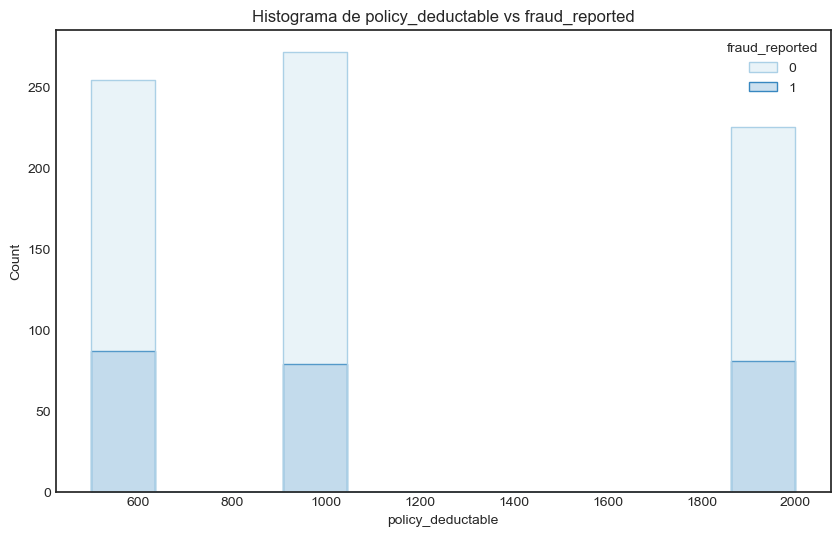

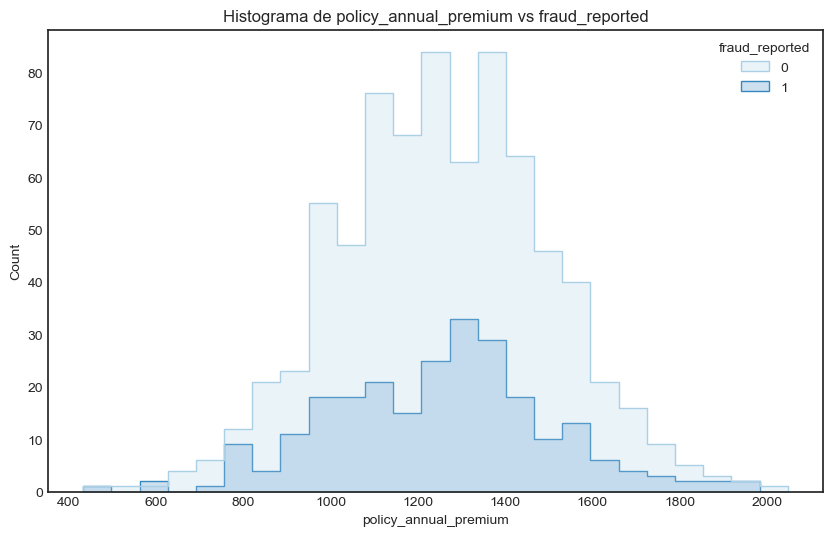

...

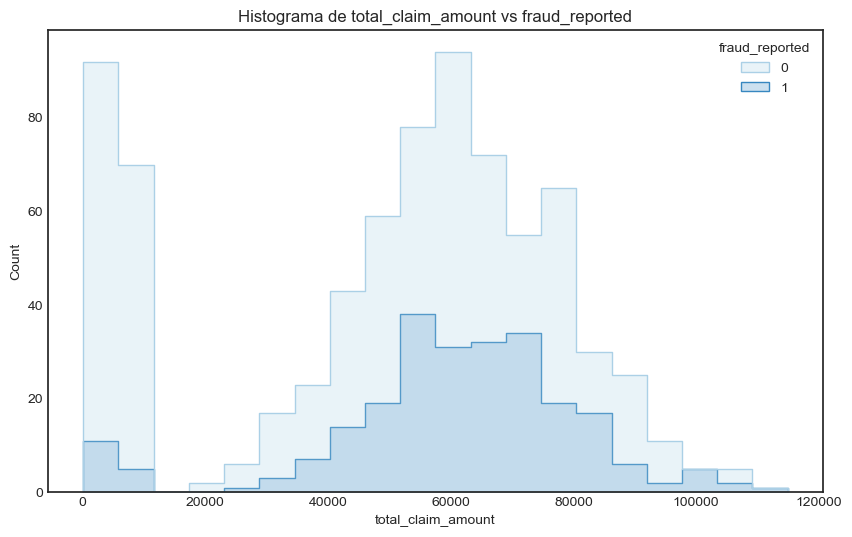

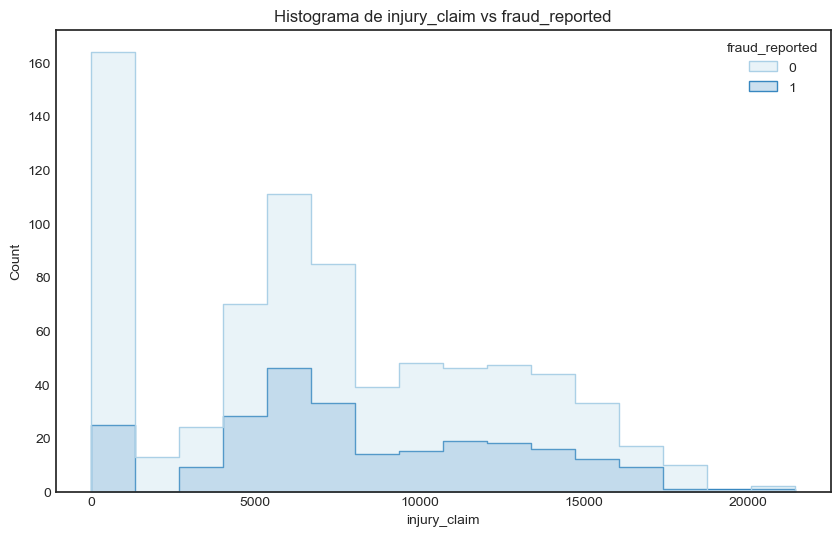

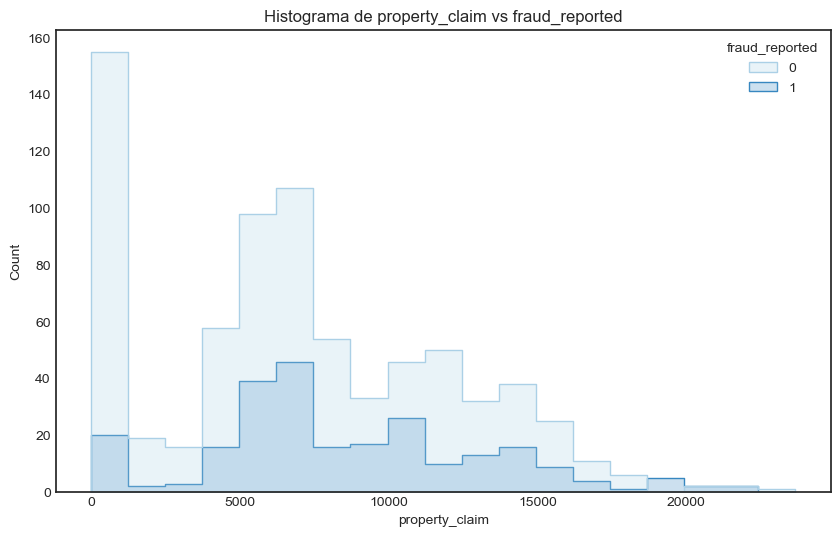

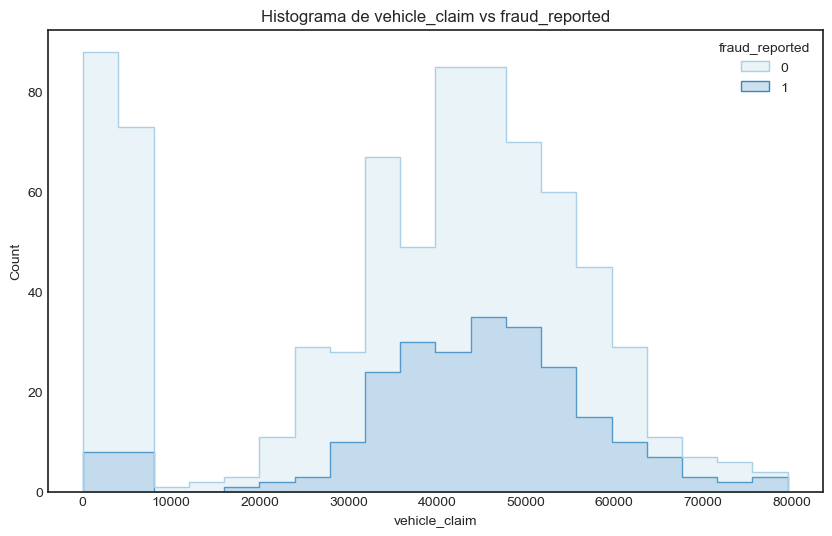

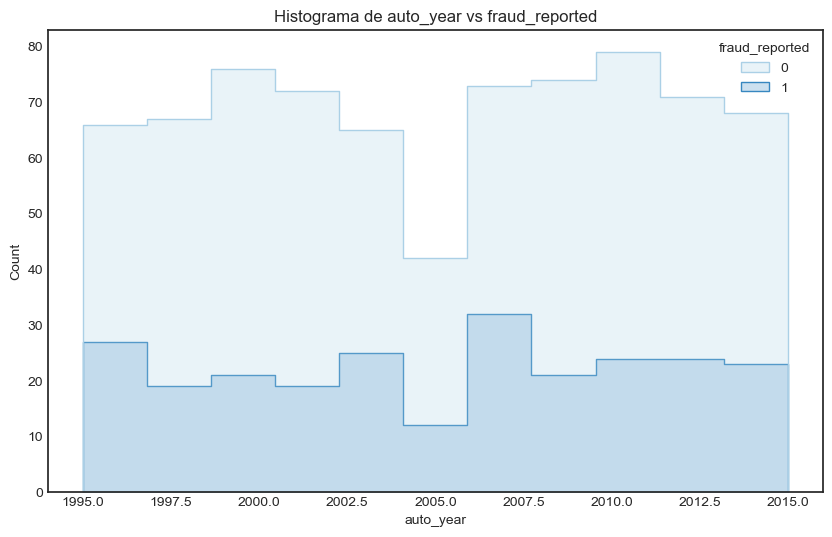

In [52]:
# Filtramos las columnas numéricas
columnas_numericas = data.select_dtypes(include=['float64', 'int64']).columns

# Creamos y cerramos un histograma para cada variable numérica dentro del bucle
for columna in columnas_numericas:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=data, x=columna, hue='fraud_reported', element='step', palette='Blues')
    plt.title(f'Histograma de {columna} vs fraud_reported')
    plt.show()
    plt.close()


In [53]:
# Veamos los valores top 5 de las variables númericas

columnas_numericas = data.select_dtypes(include=['float64', 'int64'])
columnas_numericas['fraud_reported'] = data['fraud_reported']

# Iteramos a través de los valores únicos de 'fraud_reported'
for fraude in columnas_numericas['fraud_reported'].unique():
    print(f"Top 5 valores más frecuentes para cada '{fraude}' en las columnas numéricas:")
    
    # Filtramos el DataFrame por el valor de 'fraud_reported' actual
    subset = columnas_numericas[columnas_numericas['fraud_reported'] == fraude]
    
    # Iteramos a través de las columnas numéricas y calculamos el top 5 para cada una
    for columna in columnas_numericas.columns[:-1]:  # Excluimos la última columna 'FRAUD_REPORTED'
        print(f"Para '{columna}':")
        
        # Calculamos
        top_5_frecuentes = subset[columna].value_counts().nlargest(5)
        print(top_5_frecuentes)
        print("\n")

Top 5 valores más frecuentes para cada '1' en las columnas numéricas:
Para 'months_as_customer':
months_as_customer
156    4
222    3
230    3
61     3
371    3
Name: count, dtype: int64


Para 'age':
age
41    16
31    14
34    13
33    12
32    11
Name: count, dtype: int64


Para 'policy_number':
policy_number
521585    1
110084    1
714346    1
779156    1
730819    1
Name: count, dtype: int64


Para 'policy_deductable':
policy_deductable
500     87
2000    81
1000    79
Name: count, dtype: int64


Para 'policy_annual_premium':
policy_annual_premium
1281.25    2
1406.91    1
1064.49    1
1119.29    1
1230.76    1
Name: count, dtype: int64


Para 'umbrella_limit':
umbrella_limit
0          187
5000000     15
6000000     13
4000000     13
7000000      9
Name: count, dtype: int64


Para 'capital-gains':
capital-gains
0        129
53300      2
61100      2
38600      2
51700      2
Name: count, dtype: int64


Para 'capital-loss':
capital-loss
 0        112
-56200      2
-57100      2
-4

**Observaciones:**

- En la variable "AGE" vemos que la edad más alta es la 41 años con 16 personas reclamando donde hay fraude. El rango más alto es el de 31 a 34 años. Siguiendo el rango de 39 años a 45 años.
- En la variable 'MONTHS_AS_CUSTOMER' el valor más alto en fraude es de 156 meses como cliente con 4 personas. No existe un patrón indicativo como tal de diferencia entre las observaciones. Sin embargo el rango más alto es entre 100 y 300 meses.
- En la variable 'POLICY_DEDUCTABLE' los clientes que reportan más fraude son los que tiene valor de 500 con 87 reclamaciones. No hay diferencia alta entre los valores.
- En la variable 'POLICY_ANNUAL_PREMIUM'el rango va desde 1200 a 1400 es donde se preenta más fraude.
- En la variable 'UMBRELLA_LIMIT' donde hay más fraude es cuando no hay cobertura adicional con 187 reclamaciones.
- En la variable 'CAPITAL-GAINS' donde hay más fraude es donde hay 0 ganancias de capital.
- En la variable 'CAPITAL-LOSS' donde hay más fraude es donde hay 0 perdidas de capital.
- En la variable 'INCIDENT_HOUR_OF_THE_DAY' donde hay más fraude es en la madrugada de 0 a 6 de la mañana, de 14 a 19 y de 21 a 23. Esto puede indicar que suele ser donde no hay tanta afluencia de vehiculos.
- En la variable 'NUMBER_OF_VEHICLES_INVOLVED' donde hay más fraude es con un solo vehiculo involucrado con 133 reclamaciones y le sigue 3 vehiculos. Esto puede indicar que los accidentes más frecuentes solo son con el vehiculo del asegurado.
- En la variable 'BODILY_INJURIES' el fraude se encuentra cuando hay 2 personas heridas (con 90 reclamaciones) y le sigue cuando no hay heridos con 80. La diferencia no es tan amplia entre las observaciones. 
- En la variable 'WITNESSES' hay más reclamaciones cuando hay 2 testigos aunque la diferencia no es tan amplia.
- En la variable 'TOTAL_CLAIM_AMOUNT' el rango donde hay más fraude es de 55.000 y 75.000 de la reclamación total.
- En la variable 'INJURY_CLAIM' el rango donde hay más fraude es de 4.500 y 8.500 de la reclamación de heridas.
- En la variable 'PROPERTY_CLAIM' el rango donde hay más fraude es de 5.000 y 11.000 de la reclamación de propiedades.
- En la variable 'VEHICLE_CLAIM' el rango donde hay más fraude es de 3.000 y 6.500 de la reclamación de vehiculos. 

In [54]:
# Filtramos el DataFrame para incluir solo los registros donde 'fraud_reported' es '1'
fraud = data[data['fraud_reported'] == 1] #hacemos subset de solo fraude
tabla_education_sex = pd.crosstab(index=fraud['insured_sex'], columns=fraud['insured_education_level'])
print(tabla_education_sex)

insured_education_level  ASSOCIATE  COLLEGE  HIGH SCHOOL  JD  MASTERS  MD  PHD
insured_sex                                                                   
FEMALE                          24       17           14  23       17  14   17
MALE                            10       15           22  19       15  24   16


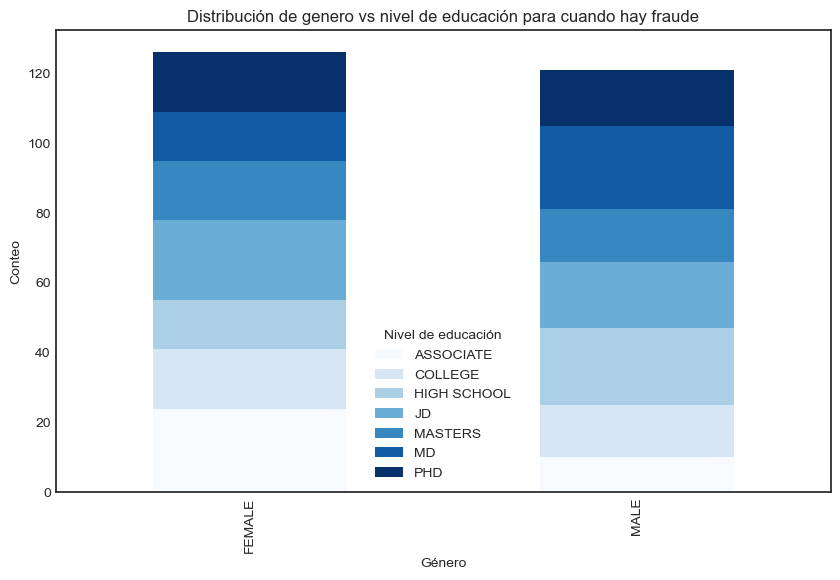

In [55]:
# Graficamos la tabla de cruce como un gráfico de barras
tabla_education_sex.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Blues')
plt.xlabel('Género')
plt.ylabel('Conteo')
plt.title('Distribución de genero vs nivel de educación para cuando hay fraude')
plt.legend(title='Nivel de educación')
plt.show()


En el caso de las mujeres, el nivel de educación que comete más fraude es ASSOCIATE con un 19% seguido de JD con un 18%. En el caso de los hombres es MD con un 20% y le sigue HIGH SCHOOL con un 18%.

In [56]:
# Cantidad de reclamaciones donde hay fraude
education_claim_vs_fraud= fraud.groupby('insured_education_level')['total_claim_amount'].sum()
education_claim_vs_fraud

insured_education_level
ASSOCIATE      2109540
COLLEGE        1913830
HIGH SCHOOL    2014230
JD             2592590
MASTERS        1949000
MD             2334380
PHD            1981050
Name: total_claim_amount, dtype: int64

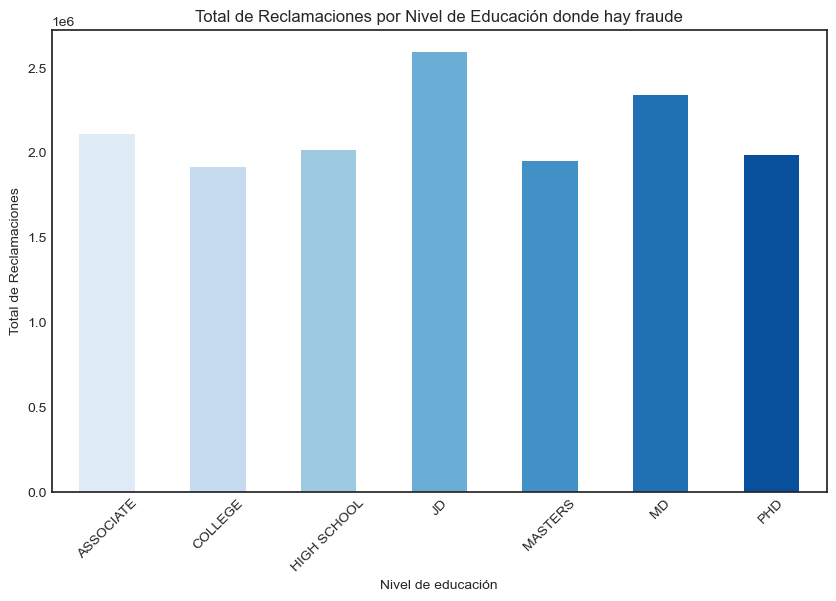

In [57]:
# Calculamos la suma total de reclamaciones por nivel de educación
education_claim_vs_fraud = fraud.groupby('insured_education_level')['total_claim_amount'].sum()
# Usamos la paleta 'Blues' de seaborn para obtener colores diferentes
colors = sns.color_palette('Blues', len(education_claim_vs_fraud))

# Graficamos la cantidad de reclamaciones donde hay fraude en función del nivel de educación
education_claim_vs_fraud.plot(kind='bar', figsize=(10, 6), color=colors)
plt.xlabel('Nivel de educación')
plt.ylabel('Total de Reclamaciones')
plt.title('Total de Reclamaciones por Nivel de Educación donde hay fraude')
plt.xticks(rotation=45)
plt.show()

Donde hay más cantidad total por reclamación es el de nivel de educación JD con una suma total de 2.592.590 y le sigue 
el nivel de educación MD con 2.334.380 de suma total.

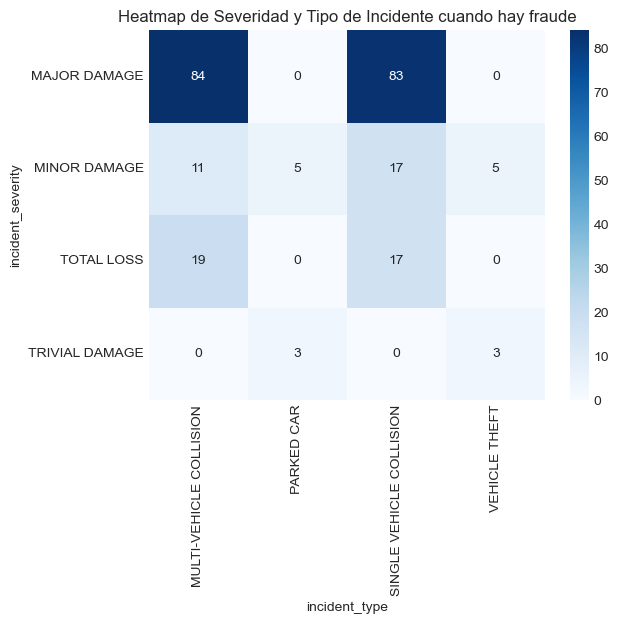

In [58]:
# Veamos la severidad y el tipo de incidente donde hay fraude
tabla_contingencia = pd.crosstab(index=fraud['incident_severity'], columns=fraud['incident_type'])
sns.heatmap(tabla_contingencia, annot=True, cmap='Blues', fmt='g')
plt.title('Heatmap de Severidad y Tipo de Incidente cuando hay fraude')
plt.show()

Como hemos encontrado anteriormente en nuestros hallazgos, comprobamos que en los casos de fraude, donde hay colisiones de Automóviles y hay mayor daño es donde se registran más las reclamaciones. Esto puede indicar que se busca tener el mayor daño para reclamar lo más alto en la póliza. 

In [59]:
#Veamos en cuanto al genero y la severidad
incident_vs_sex = fraud.groupby(['insured_sex', 'incident_severity']).size().reset_index(name='Count')
incident_vs_sex_pivot = incident_vs_sex.pivot(index='insured_sex', columns='incident_severity', values='Count')
incident_vs_sex_pivot

incident_severity,MAJOR DAMAGE,MINOR DAMAGE,TOTAL LOSS,TRIVIAL DAMAGE
insured_sex,,,,
FEMALE,84,17,20,5
MALE,83,21,16,1


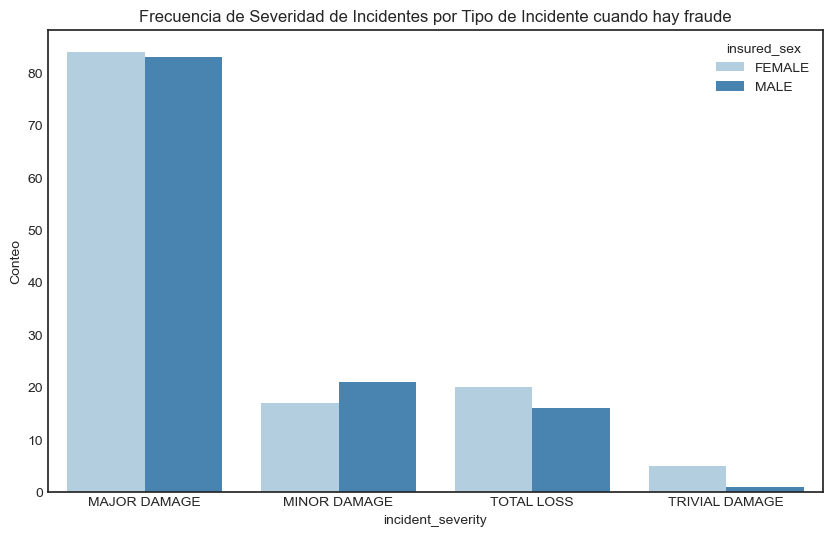

In [60]:
plt.figure(figsize=(10, 6))
sns.countplot(x='incident_severity', hue='insured_sex', data=fraud, palette='Blues')
plt.title('Frecuencia de Severidad de Incidentes por Tipo de Incidente cuando hay fraude')
plt.ylabel('Conteo')
plt.show()

En cuanto al registro de mayor daño para la reclamación, no hay mucha diferencia (solo de 1) entre las mujeres y hombres que presentan el tipo de severidad del accidente. En los otros tipo se ve una brecha un poco más grande.

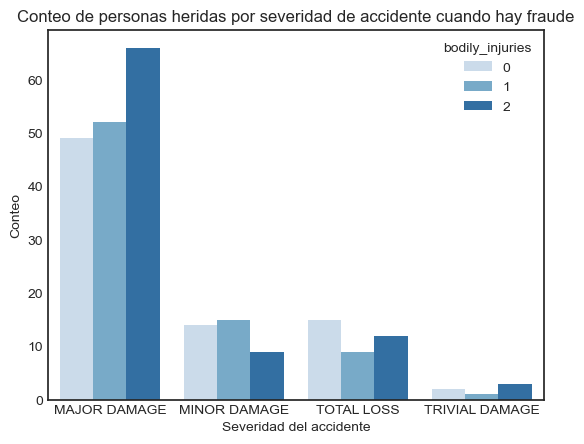

In [61]:
sns.countplot(x='incident_severity', hue='bodily_injuries', data=fraud, palette='Blues')
plt.title('Conteo de personas heridas por severidad de accidente cuando hay fraude')
plt.ylabel('Conteo')
plt.xlabel('Severidad del accidente')
plt.show()

In [62]:
#Veamos en cuanto a las heridas y la severidad
incident_vs_injuries = fraud.groupby(['incident_severity','bodily_injuries']).size().reset_index(name='Count')
incident_vs_injuries = incident_vs_injuries.pivot(index='incident_severity', columns='bodily_injuries', values='Count')
incident_vs_injuries

bodily_injuries,0,1,2
incident_severity,,,
MAJOR DAMAGE,49,52,66
MINOR DAMAGE,14,15,9
TOTAL LOSS,15,9,12
TRIVIAL DAMAGE,2,1,3


En el caso de mayor daño tenemos que las personas heridas reportadas más altas son de 2 con 66 reclamaciones y le sigue de 1 personas con 52 reclamaciones.

In [63]:
#Vamos a generar un mapa con las ciudades con más incidentes con fraude

# Contamos las frecuencias de los incidentes y reseteamos el índice para tener un DataFrame limpio
conteo_incidentes = fraud['incident_state'].value_counts().reset_index()
conteo_incidentes.columns = ['Estado', 'Conteo']

# Creamos el mapa
fig = px.choropleth(
    conteo_incidentes,
    locations='Estado',  
    locationmode='USA-states', 
    color='Conteo',  
    color_continuous_scale=px.colors.sequential.Blues,  
    range_color=(0, 300),  
    scope='usa',  
    labels={'Conteo': 'Número de Incidentes'}, 
    title='Número de Incidentes por Estado con más fraude'  
)

# Creamos la leyenda para que refleje el rango de incidentes
fig.update_layout(coloraxis_colorbar=dict(
    title='Número de Incidentes',
    tickvals=[0, 50, 100, 150, 200, 250, 300],
    ticktext=['0', '50-100', '100-150', '150-200', '200-250', '250-300', '300+']
))

# Graficamos
fig.show()


Como podemos observar el estado con mayor incidentes es New York con 58 incidentes mientras que el que registra menos es PENNSYLVANIA con 8 incidentes. En cuanto en cantidad total de reclamaciones:

In [64]:
claims_state = fraud.groupby('incident_state')[['total_claim_amount']].sum().sort_values('total_claim_amount', ascending = False)
claims_state

,total_claim_amount
incident_state,
SC,4616420
NY,3705060
WV,2362940
NC,1897250
VA,1379190
OH,581190
PA,352570


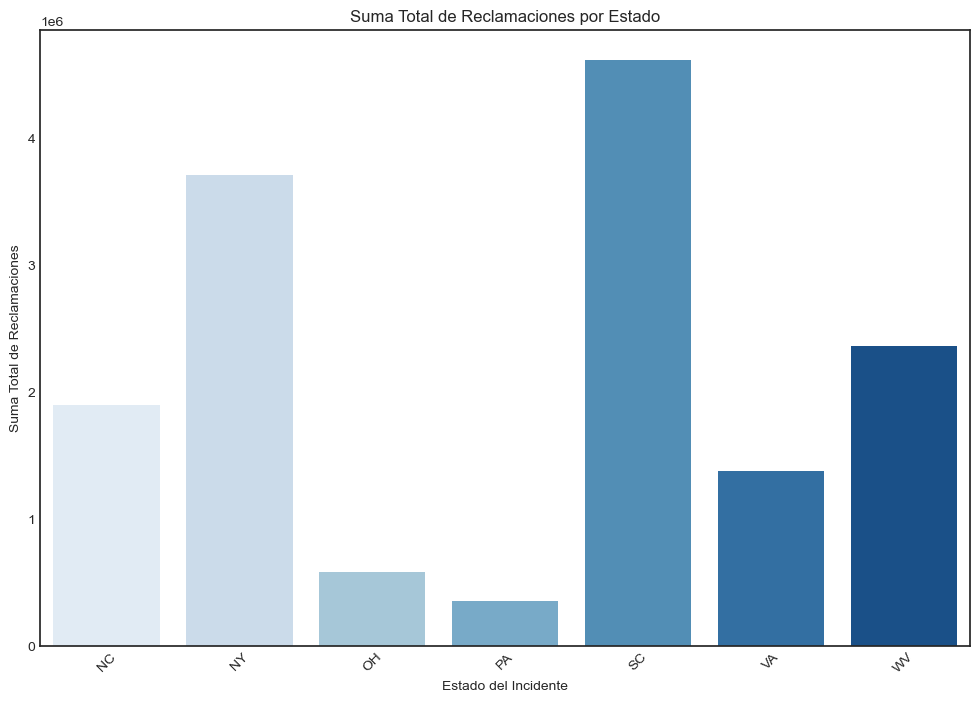

In [65]:
# Creamos un barplot 
plt.figure(figsize=(12, 8))
sns.barplot(
    x=claims_state.index, 
    y='total_claim_amount', 
    data=claims_state, 
    palette='Blues'
)

plt.xlabel('Estado del Incidente')
plt.ylabel('Suma Total de Reclamaciones')
plt.title('Suma Total de Reclamaciones por Estado')
plt.xticks(rotation=45)

# Graficamos
plt.show()


SC representa el estado con más suma totales de cantidad de dinero por reclamaciones con fraude con 4.616.420 lo que tambien puede ser debido a que es el estado con más incidentes reportados (73) y le sigue NY con 3.705.060.


Veamos la cantidad de dinero en reclamos de la poliza en los casos de fraude:

In [66]:
claims = fraud[['total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']]
claims_sum = claims.sum()
claims_sum

total_claim_amount    14894620
injury_claim           2027460
property_claim         2114350
vehicle_claim         10752810
dtype: int64

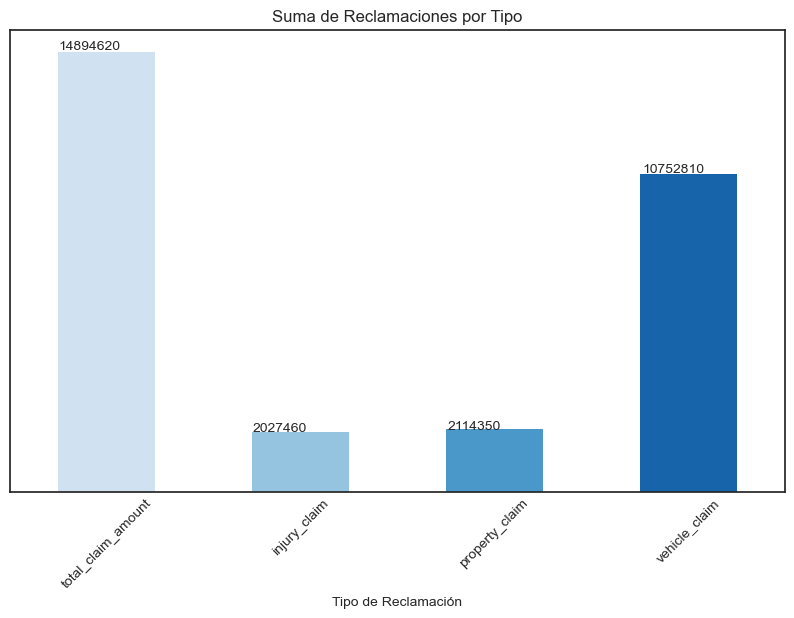

In [67]:
# Generamos colores de la paleta 'Blues'
num_barras = len(claims_sum)
colores = sns.color_palette('Blues', n_colors=num_barras)

# Crear la gráfica de barras
plt.figure(figsize=(10, 6))
ax = claims_sum.plot(kind='bar', color=colores)
ax.set_yticklabels([]) #eliminamos las etiquetas de y
ax.set_ylabel('')

# Añadimos los valores encima de las barras
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

#Graficamos
plt.title('Suma de Reclamaciones por Tipo')
plt.xlabel('Tipo de Reclamación')
plt.xticks(rotation=45)
plt.show()


El 72.20% de las cantidades totales de dinero por reclamación fraudulenta pertenece a VEHICLE_CLAIM. Le sigue con un 14.19% PROPERTY_CLAIM. El restante es para INJURY_CLAIM con un 13.61 %. Esto puede influir en determinar el fraude dado de es más probable de que cuando haya estos casos, se registre un potencial fraude.

### Relación entre Edad y Mes como cliente

Veamos como se comportan estas variables tanto como cuando hay fraude como cuando no lo hay:

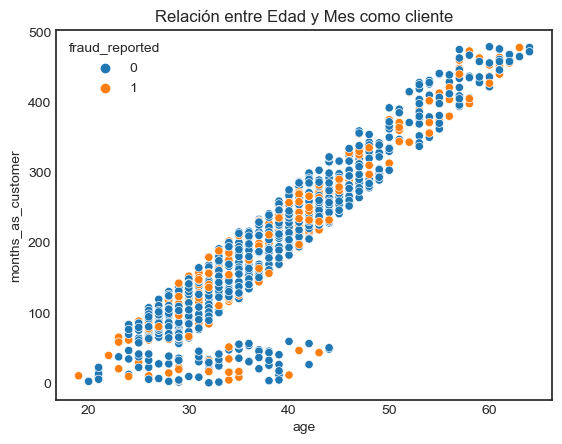

In [68]:
sns.scatterplot(x='age', y='months_as_customer', hue='fraud_reported', data=data)
plt.title('Relación entre Edad y Mes como cliente')
plt.show()



Observamos que en su mayoría, a medida de que aumenta la edad, aumenta los meses como clientes en la compañia aseguradora.

In [69]:
# Veamos una tabla con el top 10 donde se ha reportado fraude.
# Filtramos el DataFrame para incluir solo los registros donde 'FRAUD_REPORTED' es 'Y'
data_fraud = data[data['fraud_reported'] == 1]

# Creamos una tabla pivote con los datos filtrados que necesitamos
pivot_table = pd.pivot_table(
    data_fraud,
    values='total_claim_amount',
    index=['insured_occupation', 'insured_education_level', 'age', 'months_as_customer'],
    aggfunc='mean'
).sort_values('total_claim_amount', ascending=False)

# Obtenemos el top 10
top_10 = pivot_table.head(10)

# Aplicamos color
cm = sns.light_palette("blue", as_cmap=True)
styled_top_10 = top_10.style.background_gradient(cmap=cm)
styled_top_10 #imprimimos


,,,,total_claim_amount
insured_occupation,insured_education_level,age,months_as_customer,
CRAFT-REPAIR,JD,41,193,112320.000000
PROF-SPECIALTY,MASTERS,30,112,107900.000000
SALES,MD,46,317,104610.000000
EXEC-MANAGERIAL,ASSOCIATE,58,398,99320.000000
OTHER-SERVICE,JD,44,269,98670.000000
TECH-SUPPORT,ASSOCIATE,23,61,98340.000000
TRANSPORT-MOVING,JD,41,234,98280.000000
PRIV-HOUSE-SERV,MD,55,413,98160.000000
TRANSPORT-MOVING,ASSOCIATE,34,116,97080.000000


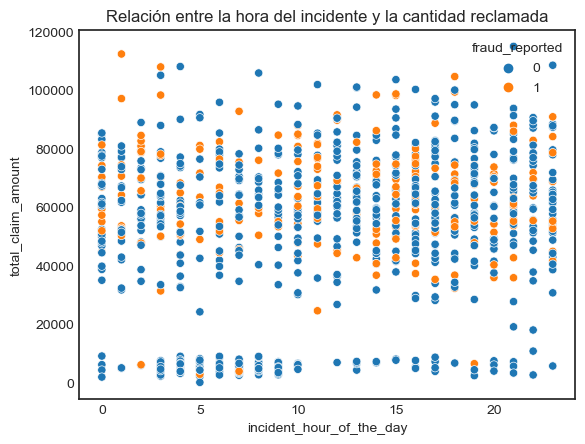

In [70]:
# Veamos la relación de incident_hour_of_the_day y total_claim_amount
sns.scatterplot(x='incident_hour_of_the_day', y='total_claim_amount', hue='fraud_reported', data=data)
plt.title('Relación entre la hora del incidente y la cantidad reclamada')
plt.show()



No hay un patrón claro entre las reclamaciones hechas y la hora del incidente.

## Conversión de variables y Discretización 
Se realiza el cambio de variables de númericas a categoricas y se hace proceso de discretización.

In [71]:
# Se convierte variables numericas a categoricas 
data['incident_hour_of_the_day']=data['incident_hour_of_the_day'].astype('category')

In [72]:
# Creamos una función para categorizar la hora en tandas
def categorize_hour(hour):
    if 0 <= hour <= 5:
        return 'DAWN'
    elif 6 <= hour <= 11:
        return 'MORNING'
    elif 12 <= hour <= 17:
        return 'AFTERNOON'
    else:
        return 'NIGHT'

# Aplicamos la funcion
data['incident_hour_of_the_day'] = data['incident_hour_of_the_day'].apply(categorize_hour)
data['incident_hour_of_the_day'].unique()

array(['DAWN', 'MORNING', 'NIGHT', 'AFTERNOON'], dtype=object)

In [73]:
# Veamos los valores unicos
data['incident_hour_of_the_day']=data['incident_hour_of_the_day'].astype('category')
tabla_frecuencia_hour = data['incident_hour_of_the_day'].value_counts()
print(tabla_frecuencia_hour)



incident_hour_of_the_day
AFTERNOON    271
NIGHT        246
DAWN         244
MORNING      239
Name: count, dtype: int64


In [74]:
# Veamos los valores unicos cuando hay fraude
fraud_hour = data.groupby(['incident_hour_of_the_day', 'fraud_reported']).size().reset_index(name='Count')
fraud_hour

,incident_hour_of_the_day,fraud_reported,Count
0,AFTERNOON,0,203
1,AFTERNOON,1,68
2,DAWN,0,185
3,DAWN,1,59
4,MORNING,0,180
5,MORNING,1,59
6,NIGHT,0,185
7,NIGHT,1,61


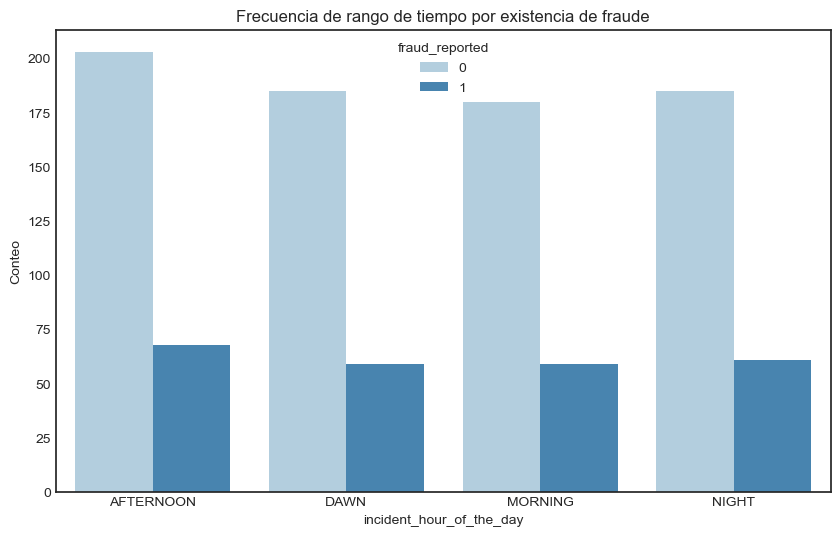

In [75]:
plt.figure(figsize=(10, 6))
sns.countplot(x='incident_hour_of_the_day', hue='fraud_reported', data=data, palette='Blues')
plt.title('Frecuencia de rango de tiempo por existencia de fraude')
plt.ylabel('Conteo')
plt.show()

Ahora exportamos el archivo de dataset limpio y preprocesado

In [76]:
# Exportamos dataset limpio 
data.to_csv("dataset_original_preprocesado.csv", index=False)

# Primera parte de selección de caracteristicas.
## Tecnicas de Filtrado

### Correlaciones entre variables. Correlación de Pearson

Realizamos un proceso de correlaciones para ver que tan correlacionadas están las variables entre ellas.

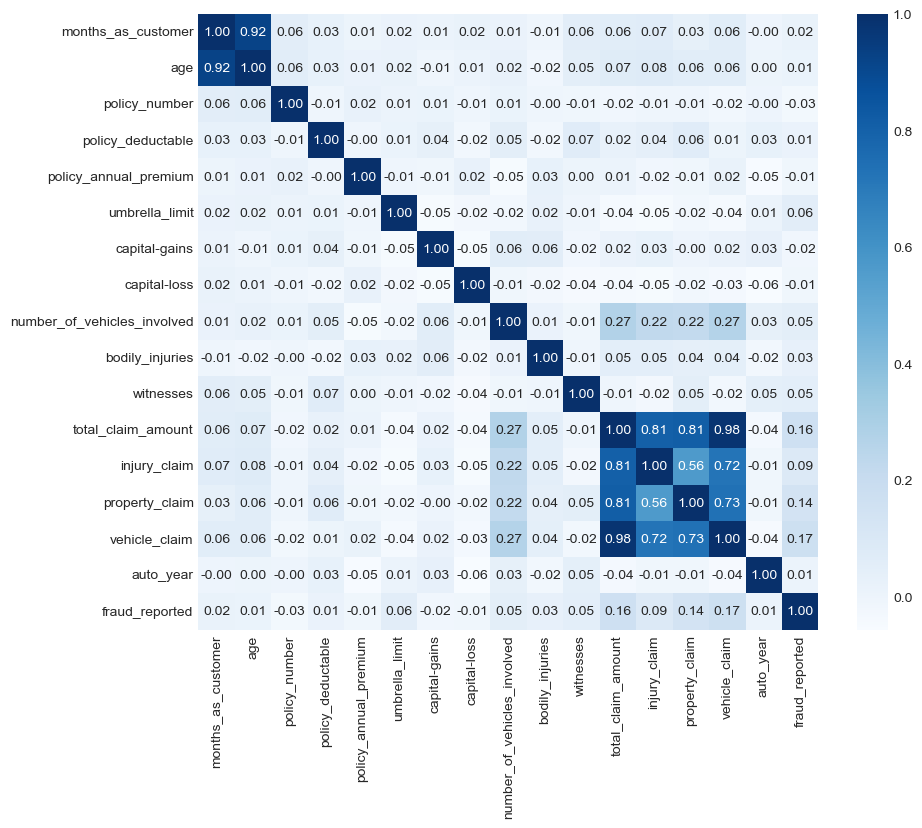

In [77]:
# Veamos de nuevo la correlacion:
columnas_numericas2 = data.select_dtypes(include=['float64', 'int64'])
columnas_numericas2['fraud_reported'] = data['fraud_reported']  # Añadimos la variable objetivo al DataFrame

# Calculamos la matriz de correlación
matriz_correlacion = columnas_numericas2.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(matriz_correlacion, annot=True, fmt=".2f", cmap='Blues')
plt.show()



- 'months_as_customer' y 'age' estan altamente correlacionadas, por lo que si aumenta una, aumenta la otra y viceversa.

- Tambien hay correlaciones negativas con respecto a la variable objetivo por parte de La variable 'policy_number' que indica el numero de poliza especifico del cliente, 'policy_annual_premium' que indica que el monto de la prima anual de la póliza no es un indicador significativo de fraude, 'capital-gains' y 'capital-loss' donde las ganancias o pérdidas de capital de los asegurados no estan relacionados significativamente con el fraude.

- Tambien podemos observar que las variables 'total_claim_amount', 'injury_claim', 'property_claim' Y 'vehicle_claim' estan altamente correlacionadas entre si. Lo podemos ver en el caso de 'total_claim_amount' tiene una correlación muy alta con 'vehicle_claim' (0.98), indicando una relación casi directa. Esto es porque la suma de las ultimas tres variables da como resultado la primera. Aqui afecta la multicolinealidad en nuestros datos. 

- Las variables de CLAIM tambien estan correlacionadas con la variable 'number_of_vehicles_involved' indicando una relación positiva, donde si hay aumento de vehiculos involucrados en el accidente, aumentara la cuantia de la reclamación.

Veamos mas a fondo estas últimas variables:

### Análisis de multicolinealidad

Vamos a analizar las variables que presentan multicolinealidad realizando de nuevo un matriz de correlación solo para ellas y calculando el VIF (Factor de Inflación de la Varianza). 

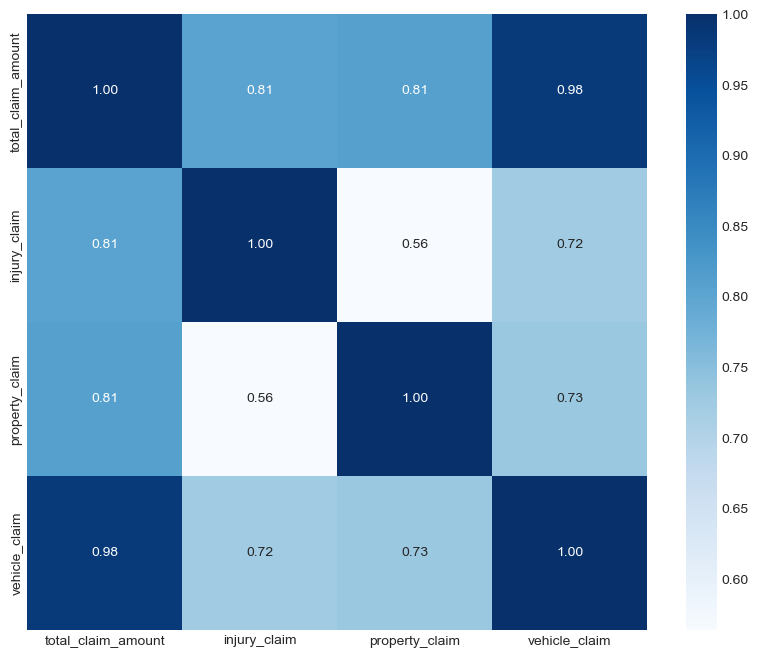

,variables_multi,VIF
0,total_claim_amount,inf
1,injury_claim,inf
2,property_claim,inf
3,vehicle_claim,inf


In [78]:

# Seleccionamos las variables para el análisis de multicolinealidad
variables_multi = [ 'total_claim_amount', 'injury_claim', 'property_claim','vehicle_claim']
data_multicolinealidad = data[variables_multi]

# Calculamos la matriz de correlación
correlation_matrix = data_multicolinealidad.corr()

# Calculamos el VIF
vif = pd.DataFrame()
vif["variables_multi "] = data_multicolinealidad.columns
vif["VIF"] = [variance_inflation_factor(data_multicolinealidad.values, i) for i in range(data_multicolinealidad.shape[1])]

# Veamos
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='Blues')
plt.show() #graficamos

vif

Veamos sin 'total_claim_amount'

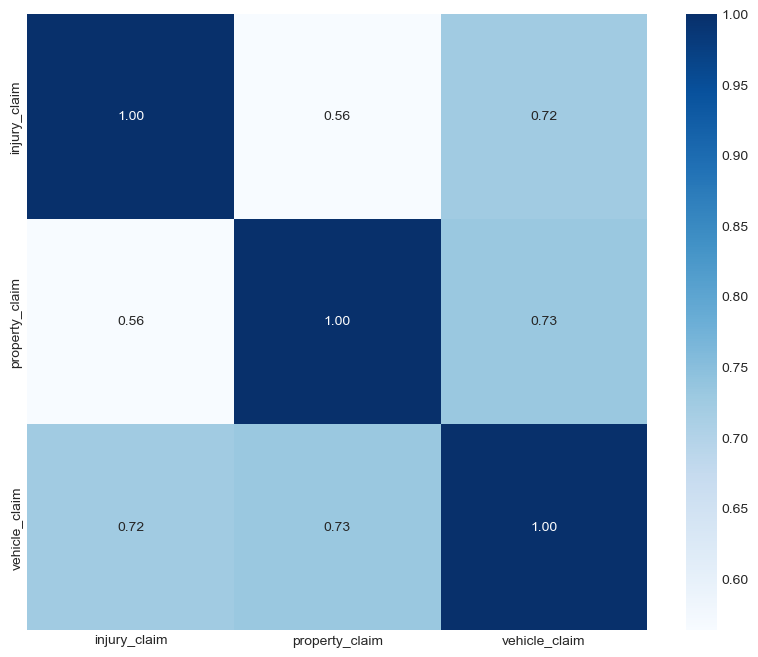

,variables_multi,VIF
0,injury_claim,6.98
1,property_claim,7.26
2,vehicle_claim,12.31


In [79]:
# Seleccionamos las variables para el análisis de multicolinealidad
variables_multi = ['injury_claim', 'property_claim','vehicle_claim']
data_multicolinealidad = data[variables_multi]

# Calculamos la matriz de correlación
correlation_matrix = data_multicolinealidad.corr()

# Calculamos el VIF
vif = pd.DataFrame()
vif["variables_multi "] = data_multicolinealidad.columns
vif["VIF"] = [variance_inflation_factor(data_multicolinealidad.values, i) for i in range(data_multicolinealidad.shape[1])]

# Veamos
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='Blues')
plt.show() #graficamos

vif

Como vimos anteriormente las variables están altamente correlacionadas entre sí. En cuanto a los valores VIF son infinitos por lo que indica una multicolinealidad perfecta. En nuestro caso vamos a eliminar total_claim_amount y mantenemos'injury_claim', 'property_claim' Y 'vehicle_claim' para observar como interactua con la variable objetivo..

In [80]:
variables_eliminadas = ['total_claim_amount']
data.drop(variables_eliminadas, inplace = True, axis = 1)

Veamos entre 'months_as_customer' y 'age'

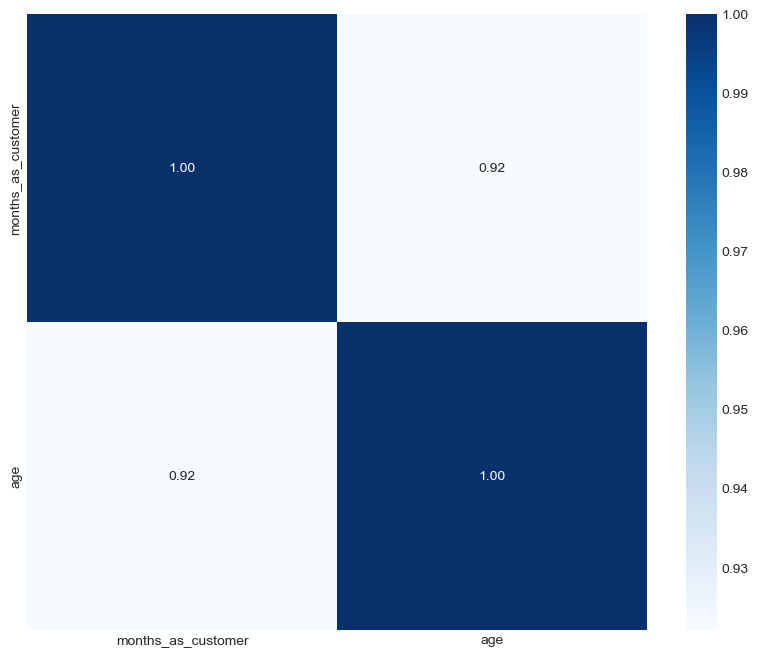

,variables_multi,VIF
0,months_as_customer,10.55
1,age,10.55


In [81]:
# Seleccionamos las variables para el análisis de multicolinealidad
variables_multi = ['months_as_customer', 'age']
data_multicolinealidad = data[variables_multi]

# Calculamos la matriz de correlación
correlation_matrix = data_multicolinealidad.corr()

# Calculamos el VIF
vif = pd.DataFrame()
vif["variables_multi "] = data_multicolinealidad.columns
vif["VIF"] = [variance_inflation_factor(data_multicolinealidad.values, i) for i in range(data_multicolinealidad.shape[1])]

# Veamos
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='Blues')
plt.show() #graficamos

vif

Tenemos un valor alto de VIF de 10.55 lo que indica que hay una alta correlación lineal entre estas dos variables. Eliminaremos la variable AGE para poder tener en cuenta cuanto tiempo ha sido cliente y ver su influencia en los casos de fraude, ya que se suele ver que hay más casos desde que toma la póliza hasta cierto determinado tiempo.

In [82]:
variables_eliminadas2 = ['age']
data.drop(variables_eliminadas2, inplace = True, axis = 1)

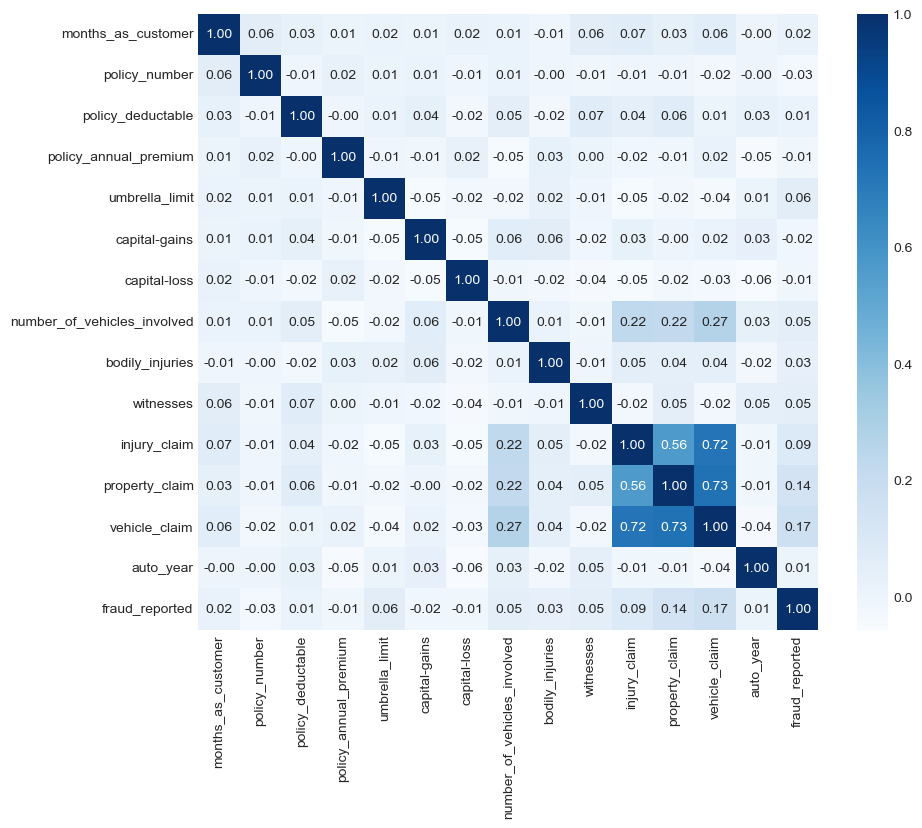

In [83]:
# Veamos de nuevo la correlacion:
columnas_numericas2 = data.select_dtypes(include=['float64', 'int64'])
columnas_numericas2['fraud_reported'] = data['fraud_reported']  # Añadimos la variable objetivo al DataFrame

# Calculamos la matriz de correlación
matriz_correlacion = columnas_numericas2.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(matriz_correlacion, annot=True, fmt=".2f", cmap='Blues')
plt.show()


- Ahora vemos que la variable más alta de correación es 'vehicle_claim'. Es decir, que a medida que aumenta dicha variable, aumenta el fraude. Tambien las otras variables que hacian parte de 'total_claim_amount' son las variables con mayor correlación: 'property_claim' e 'injury_claim'. Esto nos indica que a donde hay mayor cantidad de reclamación, hay mayor porcentaje de existir fraude. 
- Observamos tambien de nuevo las variables con correlación negativa como lo habiamos menciondao anteriormente. Serian las variables: policy_number, policy_annual_premium, capital-gains y capital-loss.


## Prueba Shapiro-Wilk para corroborar distribucion normal

Veamos si las variables numericas siguen la distribucion normal para aplicar ANOVA.

Prueba de Shapiro-Wilk para months_as_customer: Estadístico = 0.9751187562942505, p-valor = 4.615699315813071e-12


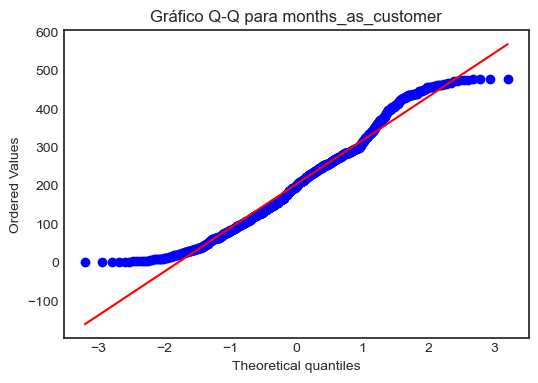

Prueba de Shapiro-Wilk para policy_number: Estadístico = 0.9592104554176331, p-valor = 4.414525021643784e-16


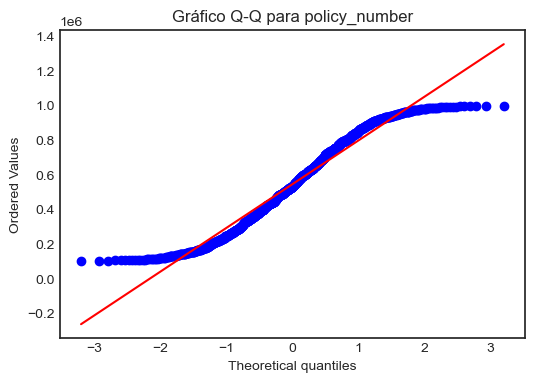

Prueba de Shapiro-Wilk para policy_deductable: Estadístico = 0.7649680376052856, p-valor = 1.696269486209477e-35


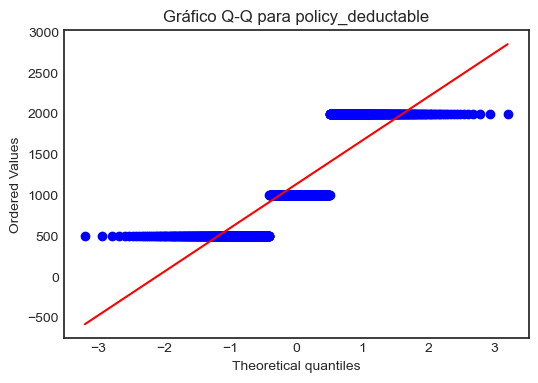

Prueba de Shapiro-Wilk para policy_annual_premium: Estadístico = 0.9993047118186951, p-valor = 0.9794015288352966


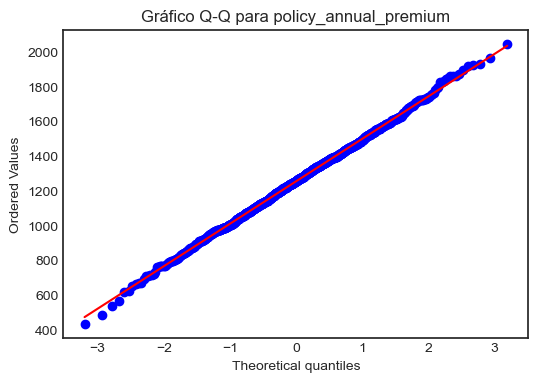

Prueba de Shapiro-Wilk para umbrella_limit: Estadístico = 0.5300324559211731, p-valor = 1.401298464324817e-45


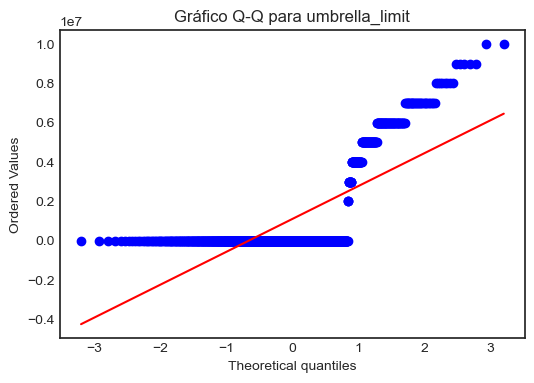

Prueba de Shapiro-Wilk para capital-gains: Estadístico = 0.7983510494232178, p-valor = 1.782941709527259e-33


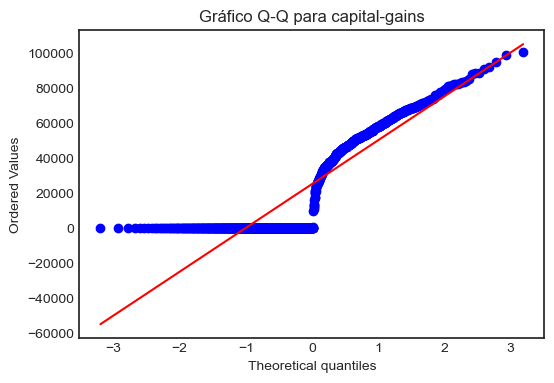

Prueba de Shapiro-Wilk para capital-loss: Estadístico = 0.8179511427879333, p-valor = 3.6812339450167396e-32


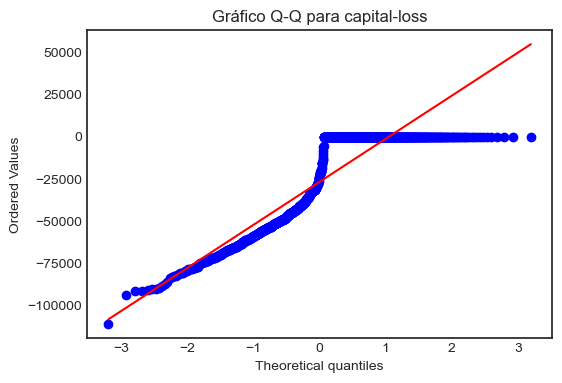

Prueba de Shapiro-Wilk para number_of_vehicles_involved: Estadístico = 0.6868249773979187, p-valor = 1.8804654677083666e-39


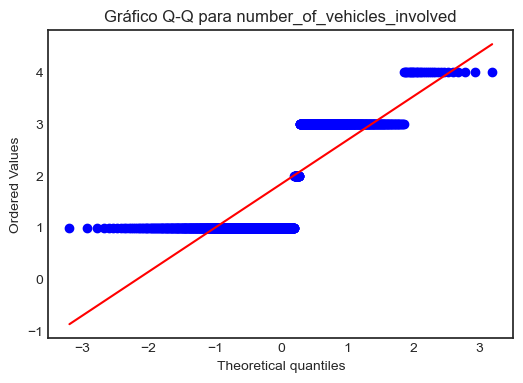

Prueba de Shapiro-Wilk para bodily_injuries: Estadístico = 0.7917908430099487, p-valor = 6.819946849579765e-34


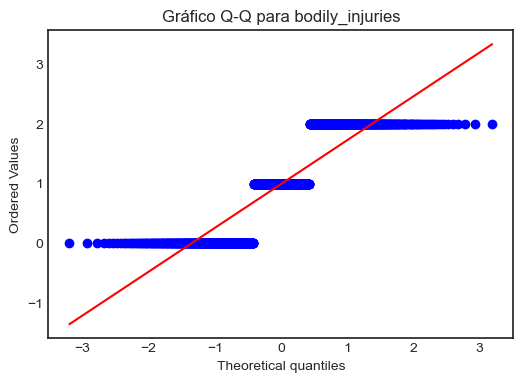

Prueba de Shapiro-Wilk para witnesses: Estadístico = 0.8580192923545837, p-valor = 4.4377759261056785e-29


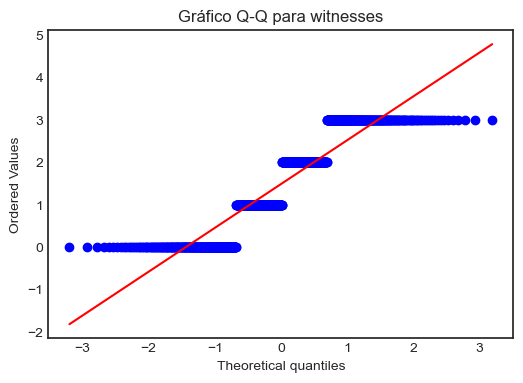

Prueba de Shapiro-Wilk para injury_claim: Estadístico = 0.9591678977012634, p-valor = 4.322489068573092e-16


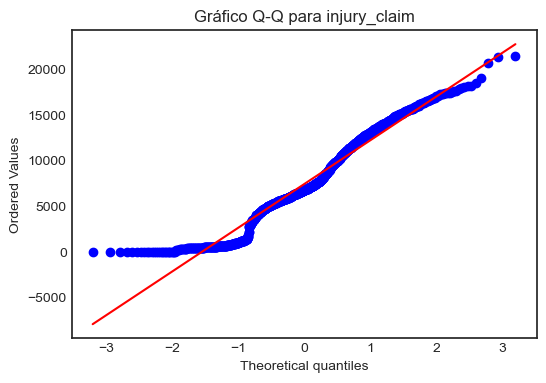

Prueba de Shapiro-Wilk para property_claim: Estadístico = 0.9623657464981079, p-valor = 2.2039488120531147e-15


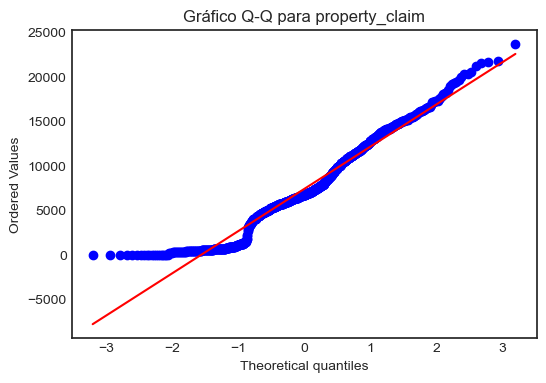

Prueba de Shapiro-Wilk para vehicle_claim: Estadístico = 0.914142370223999, p-valor = 2.4121317021026777e-23


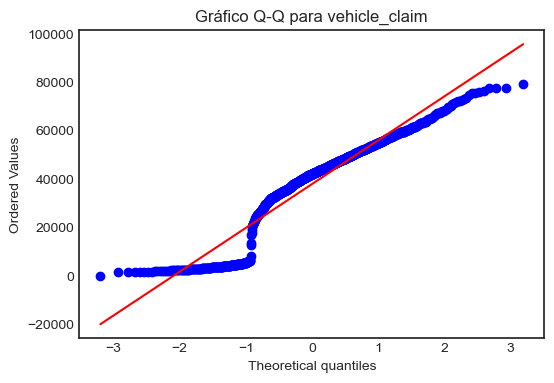

Prueba de Shapiro-Wilk para auto_year: Estadístico = 0.9523128271102905, p-valor = 1.7426339696107742e-17


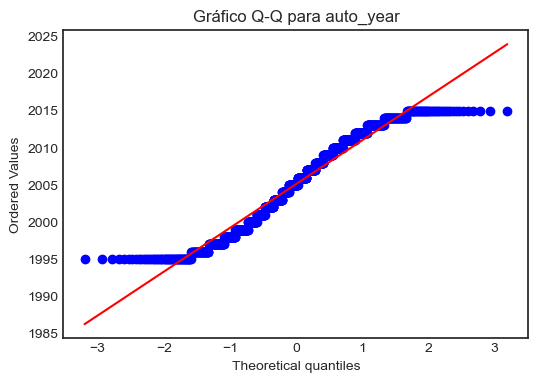

In [84]:
# Convertimos de nuevo a numericas:
columnas_numericas3 = data.select_dtypes(include=['float64', 'int64'])

# Realizamos pruebas de normalidad y creamos gráficos Q-Q para cada variable para ver si cumplen con la distribucion normal
for col in columnas_numericas3:
    # Prueba de Shapiro-Wilk
    stat, p_valor = stats.shapiro(data[col])
    print(f'Prueba de Shapiro-Wilk para {col}: Estadístico = {stat}, p-valor = {p_valor}')
    
    # Gráfico Q-Q
    plt.figure(figsize=(6, 4))
    stats.probplot(data[col], dist="norm", plot=plt)
    plt.title(f'Gráfico Q-Q para {col}')
    plt.show()

Como vemos anteriormente no todas las variables numéricas sigue una distribución normal a excepcion de la variable POLICY_ANUAL_PREMIUM, ya que todos los p-valores son extremadamente bajos, por lo que no se usara ANOVA, ya que esta asume la normalidad de los datos.

## Valores unicos
Veamos los valores unicos de las variables para observar su composición

In [85]:
data.nunique()

months_as_customer              391
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   10
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day          4
number_of_vehicles_involved       4
property_damage                   3
bodily_injuries             

Vamos a eliminar las variables que tienen mayores valores unicos y que no aportan al modelo. Se eliminan tambien las que anteriormente bajo un analisis univariable y multivariante no ofrece una alta dependencia con la variable. Se eliminan:

- 'insured_zip': Tiene 995 valores unicos por los que conocer el codigo postal no aporta al modelo.
- 'policy_bind_date' y 'incident_date': Las fechas no aportan informacion o importancia
- 'incident_location ': Tiene 1000 valores unicos por lo que no aporta conocer el lugar de donde ocurrio el accidente.
- 'policy_number': Conocer la identificacion del seguro no aporta al modelo.


In [86]:
variables_eliminadas4 = ['policy_bind_date','incident_date' , 'insured_zip', 'incident_location', 
                         'policy_number']

data.drop(variables_eliminadas4, inplace = True, axis = 1)

## Test de independencia de Chi cuadrado - V de Cramer
Veamos ahora la fuerza de la asociación entre las variables categoricas y la variable objetivo.
- Aqui tenemos como hipótesis nula: "no hay asociación entre el fraude y la variable categorica estudiada"
- hipótesis alternativa: "hay asociación entre el fraude y la variable categorica estudiada"

- Observemos ahora las que tienen  p-valor alto y/o una V de Cramer baja que pueden indicar que la asociación de estas variables con el fraude es débil o no significativa.

In [87]:
#Traemos de nuevo las variables categoricas
columna_objetivo = 'fraud_reported'
columnas_categoricas_total = data.select_dtypes(include=['category']).columns
columnas_categoricas= columnas_categoricas_total.drop(columna_objetivo)  # Eliminamos la columna objetivo de los datos

v_cramer_results = {} #creamos un diccionario vacio

# Calculamos la V de Cramer para cada variable categórica
# Función para calcular la correlación de Cramer
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))


for cat_var in columnas_categoricas:
    contingency_table = pd.crosstab(data[columna_objetivo], data[cat_var])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    v_cramer = cramers_v(data[columna_objetivo], data[cat_var])
    # Almacenamos los resultados en el diccionario
    v_cramer_results[cat_var] = {'Chi2': chi2, 'p-value': p, 'V de Cramer': v_cramer}


# Veamos
v_cramer_df = pd.DataFrame(v_cramer_results).T
v_cramer_df.sort_values(by='p-value', ascending=True, inplace=True)
v_cramer_df



,Chi2,p-value,V de Cramer
incident_severity,264.24,0.00,0.51
insured_hobbies,162.32,0.00,0.38
collision_type,31.37,0.00,0.17
incident_type,29.13,0.00,0.16
authorities_contacted,26.32,0.00,0.15
incident_state,16.13,0.01,0.10
property_damage,8.03,0.02,0.08
auto_model,46.66,0.16,0.09
insured_occupation,17.66,0.17,0.07
policy_csl,2.14,0.34,0.01


Podemos observar que 'INCIDENT_SEVERITY' con 'Chi2': 264.23734978060514, 'INSURED_HOBBIES'con 'Chi2': 162.31539899334604, son las dos variables con mayor chi2, indicando que son las variables que más influyen en la variable objetivo con p-valores muy bajos (significativamente menores que 0.05), y valores de V de Cramer relativamente altos. Tambien se encuentran en menor medida de chi2: 'COLLISION_TYPE' con'Chi2': 31.3657814591559, 'INCIDENT_TYPE' con 'Chi2': 29.131539725752873 y 'AUTHORITIES_CONTACTED' con 'Chi2': 26.319757386555693, 'INCIDENT_STATE'con 'Chi2': 16.129183580687762. PROPERTY_DAMAGE	con 'Chi2':8.03.	Estas deben de ser conservadas en el modelo.

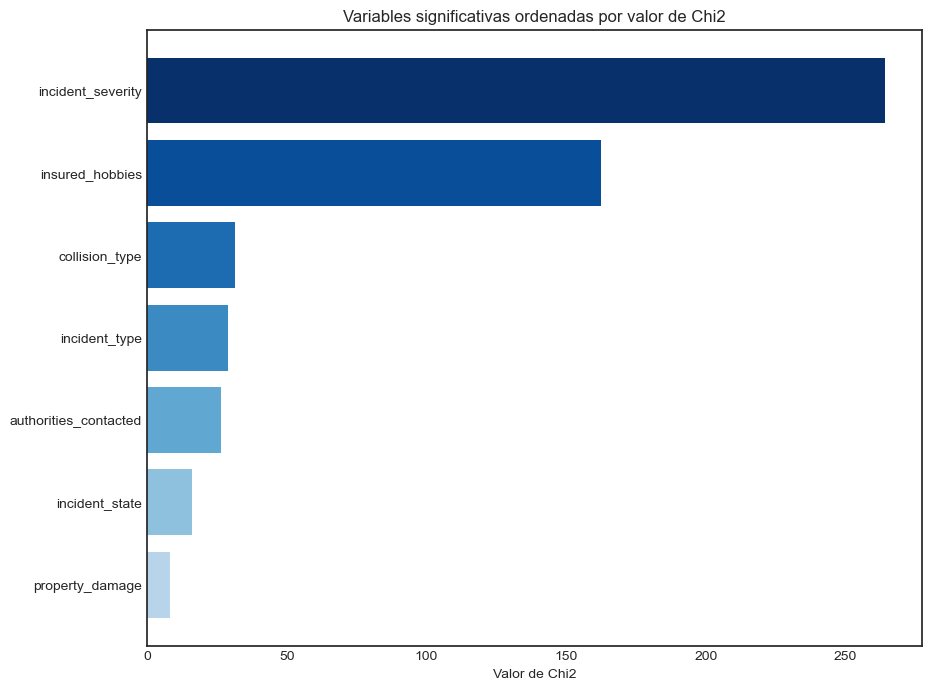

In [88]:
# Extraemos las variables categóricas ordenadas por Chi2 de mayor a menor

# Filtramos con aquellos resultados con valor p menor que 0.05
significant_results = v_cramer_df[v_cramer_df['p-value'] < 0.05]
significant_results_sorted = significant_results.sort_values(by='Chi2', ascending=True) #ordenamos
# Calculamos los colores para cada barra
colores = plt.cm.Blues(np.linspace(0.3, 1, len(significant_results_sorted )))

# graficamos
plt.figure(figsize=(10, 8))
plt.barh(significant_results_sorted.index, significant_results_sorted['Chi2'], color=colores)
plt.xlabel('Valor de Chi2')
plt.title('Variables significativas ordenadas por valor de Chi2')
plt.show()



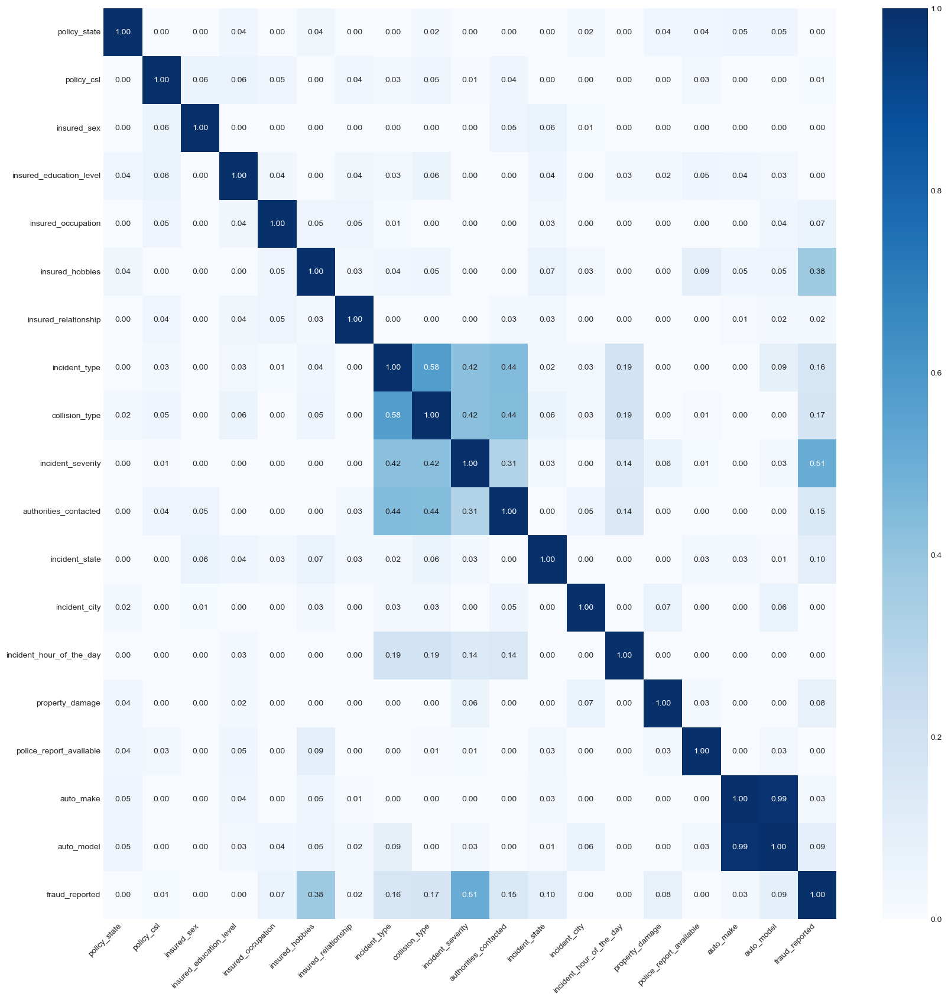

In [89]:
plt.style.use('seaborn-white')

# Veamos con la libreria Dython de Python.
results  = associations(data[columnas_categoricas_total], nominal_columns='all', plot=False)
assoc_matrix = results['corr'] # guardamos la matriz de asociacion

# Generamos una matrix
plt.figure(figsize=(20, 20))  # Ajusta al tamaño deseado
sns.heatmap(assoc_matrix, annot=True, fmt=".2f", cmap="Blues", cbar=True,
            xticklabels=assoc_matrix.columns, yticklabels=assoc_matrix.columns)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
sns.set(font_scale=1.2)
plt.show()

Eliminaremos las variables que no son significativas en el modelo, es decir, con p<0.05 donde se rechaza la hipotesis nula. Tambien es indicativo mantener las que tienen alta correlacion de Cramer ya que indica una alta asociación con la variable objetivo. 

In [90]:
# Creamos una lista de nombres de variables no significativas
variables_no_significativas = v_cramer_df[v_cramer_df['p-value'] > 0.05]
variables_no_significativas  = variables_no_significativas.index.tolist()
print("Las variables a eliminar son:", variables_no_significativas)


Las variables a eliminar son: ['auto_model', 'insured_occupation', 'policy_csl', 'insured_sex', 'insured_relationship', 'auto_make', 'policy_state', 'police_report_available', 'incident_city', 'insured_education_level', 'incident_hour_of_the_day']


In [91]:
# Eliminamos la que no queremos en nuestro dataset final
data.drop(columns=variables_no_significativas, inplace=True)

TOTAL VARIABLES ELIMINADAS DEL DATASET ORIGINAL:

'age'
'total_claim_amount'
'policy_bind_date'
'incident_date'
'insured_zip'
'incident_location'
'auto_model'
'insured_occupation'
'policy_csl'
'insured_sex'
'insured_relationship'
'auto_make'
'policy_state'
'police_report_available'
'insured_education_level'
'policy_number'
'incident_city'
'incident_hour_of_the_day'
‘_c39’.

In [92]:
# Veamos la estructura del dataset
nRow, nCol = data.shape
print(f'Hay {nRow} filas y {nCol} columnas')

Hay 1000 filas y 21 columnas


In [93]:
conteo_categorias = data.select_dtypes(include=['category']).shape[1]
conteo_numericas = data.select_dtypes(exclude=['category']).shape[1]

# Imprimimos el número de variables originales categóricas y numéricas
print("El número de variables categóricas es:", conteo_categorias)
print("El número de variables numéricas es:", conteo_numericas)

El número de variables categóricas es: 8
El número de variables numéricas es: 13


# Parte 4. Preparación para el Modelado de Datos
Preparemos el conjunto de datos para el modelado.

In [94]:
data2 = data.copy() #duplicamos el dataset
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   months_as_customer           1000 non-null   int64   
 1   policy_deductable            1000 non-null   int64   
 2   policy_annual_premium        1000 non-null   float64 
 3   umbrella_limit               1000 non-null   int64   
 4   insured_hobbies              1000 non-null   category
 5   capital-gains                1000 non-null   int64   
 6   capital-loss                 1000 non-null   int64   
 7   incident_type                1000 non-null   category
 8   collision_type               1000 non-null   category
 9   incident_severity            1000 non-null   category
 10  authorities_contacted        1000 non-null   category
 11  incident_state               1000 non-null   category
 12  number_of_vehicles_involved  1000 non-null   int64   
 13  prop

In [95]:
# Exportamos dataset limpio con metodos de filtro aplicados. 
data2.to_csv("dataset_preprocesado.csv", index=False)

### Separación de train y test

Vamos a separar nuestro dataset para su entrenamiento y su testeo. Lo haremos con un 80% para train y 20% para test.

In [96]:
#separamos los datos en categoricos y numericos
columnas_categoricas_final = data2.select_dtypes(include=['category']).columns
columnas_categoricas_final  = [col for col in columnas_categoricas_final  if col != 'fraud_reported'] #quitamos la variable objetivo
columnas_numericas_final = data2.select_dtypes(include=['float64', 'int64']).columns
columnas_categoricas_final

['insured_hobbies',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'property_damage']

In [97]:
columnas_numericas_final

Index(['months_as_customer', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'capital-gains', 'capital-loss',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year'],
      dtype='object')

In [98]:
# Seleccionamos nuestra variable objetivo
columna_objetivo = 'fraud_reported'

# Separamos entre las variables restantes como X y nuestra variable objetivo como y
X = data2.drop(columna_objetivo, axis=1)  # Eliminamos la columna objetivo de los datos
y = data2[columna_objetivo]  # tenemos la variable objetivo

# Dividimos los datos en conjuntos de entrenamiento y prueba con 80% para train y 20% para test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [99]:
# Veamos
print("Shape of X_train :", X_train.shape)
print("Shape of X_test :", X_test.shape)
print("Shape of y_train :", y_train.shape)
print("Shape of y_test :", y_test.shape)

Shape of X_train : (800, 20)
Shape of X_test : (200, 20)
Shape of y_train : (800,)
Shape of y_test : (200,)


In [100]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 800 entries, 29 to 102
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   months_as_customer           800 non-null    int64   
 1   policy_deductable            800 non-null    int64   
 2   policy_annual_premium        800 non-null    float64 
 3   umbrella_limit               800 non-null    int64   
 4   insured_hobbies              800 non-null    category
 5   capital-gains                800 non-null    int64   
 6   capital-loss                 800 non-null    int64   
 7   incident_type                800 non-null    category
 8   collision_type               800 non-null    category
 9   incident_severity            800 non-null    category
 10  authorities_contacted        800 non-null    category
 11  incident_state               800 non-null    category
 12  number_of_vehicles_involved  800 non-null    int64   
 13  property_

In [101]:
y_train.info()

<class 'pandas.core.series.Series'>
Index: 800 entries, 29 to 102
Series name: fraud_reported
Non-Null Count  Dtype   
--------------  -----   
800 non-null    category
dtypes: category(1)
memory usage: 7.2 KB


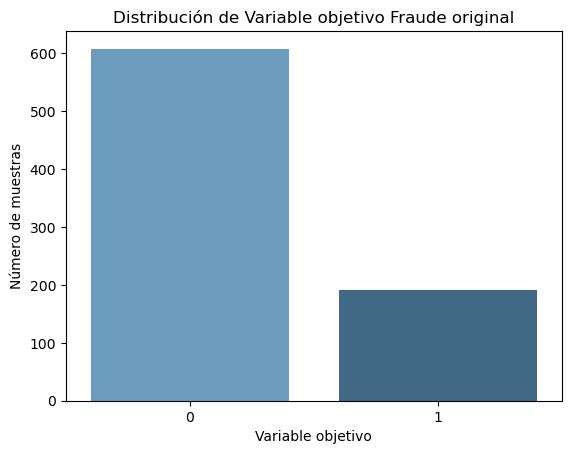

In [102]:
plt.style.use('default')
# Conteo de cada clase
class_counts_original = y_train.value_counts()

# Graficamos
sns.barplot(x=class_counts_original.index, y=class_counts_original.values, palette='Blues_d')
plt.xlabel('Variable objetivo')
plt.ylabel('Número de muestras')
plt.title('Distribución de Variable objetivo Fraude original')
plt.xticks(class_counts_original.index) 
plt.show()

In [103]:
class_counts_original

fraud_reported
0    608
1    192
Name: count, dtype: int64

## Tratamiento de Datos: Normalización y OneHotEncoder.



Vamos a usar OneHotEncoder para tratar a las variables categóricas nominales sin un orden inherente y normalizamos las variables númericas con StandardScaler() donde transformamos los datos para que tengan una media de 0 y una desviación estándar de 1.

In [104]:
# Transformamos las columnas numéricas con Escalado estándar 
scaler = StandardScaler()
X_train_num = scaler.fit_transform(X_train[columnas_numericas_final])
X_test_num = scaler.transform(X_test[columnas_numericas_final])

# Convertimos los arrays numéricos en DataFrames
X_train_num = pd.DataFrame(X_train_num, columns=columnas_numericas_final, index=X_train.index)
X_test_num = pd.DataFrame(X_test_num, columns=columnas_numericas_final, index=X_test.index)

X_train_num.info()

<class 'pandas.core.frame.DataFrame'>
Index: 800 entries, 29 to 102
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           800 non-null    float64
 1   policy_deductable            800 non-null    float64
 2   policy_annual_premium        800 non-null    float64
 3   umbrella_limit               800 non-null    float64
 4   capital-gains                800 non-null    float64
 5   capital-loss                 800 non-null    float64
 6   number_of_vehicles_involved  800 non-null    float64
 7   bodily_injuries              800 non-null    float64
 8   witnesses                    800 non-null    float64
 9   injury_claim                 800 non-null    float64
 10  property_claim               800 non-null    float64
 11  vehicle_claim                800 non-null    float64
 12  auto_year                    800 non-null    float64
dtypes: float64(13)
memory us

In [105]:
# Aplicamos OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', drop='first')
X_train_enc = encoder.fit_transform(X_train[columnas_categoricas_final])
X_test_enc = encoder.transform(X_test[columnas_categoricas_final])

# Convertimos los arrays numéricos en DataFrames
X_train_encoded = pd.DataFrame(X_train_enc.toarray(), columns=encoder.get_feature_names_out(columnas_categoricas_final), index=X_train.index)
X_test_encoded = pd.DataFrame(X_test_enc.toarray(), columns=encoder.get_feature_names_out(columnas_categoricas_final), index=X_test.index)

X_train_encoded.info()


<class 'pandas.core.frame.DataFrame'>
Index: 800 entries, 29 to 102
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   insured_hobbies_BASKETBALL              800 non-null    float64
 1   insured_hobbies_BOARD-GAMES             800 non-null    float64
 2   insured_hobbies_BUNGIE-JUMPING          800 non-null    float64
 3   insured_hobbies_CAMPING                 800 non-null    float64
 4   insured_hobbies_CHESS                   800 non-null    float64
 5   insured_hobbies_CROSS-FIT               800 non-null    float64
 6   insured_hobbies_DANCING                 800 non-null    float64
 7   insured_hobbies_EXERCISE                800 non-null    float64
 8   insured_hobbies_GOLF                    800 non-null    float64
 9   insured_hobbies_HIKING                  800 non-null    float64
 10  insured_hobbies_KAYAKING                800 non-null    float64
 1

In [106]:
# Unimos

# Concatenamos las columnas codificadas con las columnas numéricas normalizadas
X_train = pd.concat([X_train_encoded, X_train_num], axis=1)
X_test= pd.concat([X_test_encoded, X_test_num], axis=1)

X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 800 entries, 29 to 102
Data columns (total 53 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   insured_hobbies_BASKETBALL              800 non-null    float64
 1   insured_hobbies_BOARD-GAMES             800 non-null    float64
 2   insured_hobbies_BUNGIE-JUMPING          800 non-null    float64
 3   insured_hobbies_CAMPING                 800 non-null    float64
 4   insured_hobbies_CHESS                   800 non-null    float64
 5   insured_hobbies_CROSS-FIT               800 non-null    float64
 6   insured_hobbies_DANCING                 800 non-null    float64
 7   insured_hobbies_EXERCISE                800 non-null    float64
 8   insured_hobbies_GOLF                    800 non-null    float64
 9   insured_hobbies_HIKING                  800 non-null    float64
 10  insured_hobbies_KAYAKING                800 non-null    float64
 1

## Tratamiento de datos imbalanceados


Vamos a realizar diferentes procesos para tratar datos imbalanceados.

In [107]:
# Nuestro train y test consta de:
X_train_original, y_train_original = X_train, y_train
print("Shape of X_train:", X_train_original.shape)
print("Shape of y_train:", y_train_original.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (800, 53)
Shape of y_train: (800,)
Shape of X_test: (200, 53)
Shape of y_test: (200,)


In [108]:
# Veamos nuestros datos originales de la variable target
print(y_train_original.value_counts())

fraud_reported
0    608
1    192
Name: count, dtype: int64


### Synthetic Minority Over-sampling Technique (SMOTE)
Vamos a realizar el proceso SMOTE donde duplicaremos la clase minoritaria que en nuestro caso es donde hay fraude. 


In [109]:
# Vamos a aplicar  SMOTE
smote = SMOTE(random_state=42)

# Aplicamos al conjunto de entrenamiento
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [110]:
print("Shape of X_train_smote :", X_train_smote.shape)
print("Shape of y_train_smote :", y_train_smote.shape)
print("Shape of X_test_transformed :", X_test.shape)
print("Shape of y_test :", y_test.shape)

Shape of X_train_smote : (1216, 53)
Shape of y_train_smote : (1216,)
Shape of X_test_transformed : (200, 53)
Shape of y_test : (200,)


Como resultado tenemos que despues de aplicar SMOTE al conjunto de entrenamiento, se ha creado ejemplos sintéticos para aumentar el tamaño de la clase minoritaria, es decir, de los casos fraudulentos con un número de 1066 observaciones.

In [111]:
print(y_train_smote.value_counts())

fraud_reported
0    608
1    608
Name: count, dtype: int64


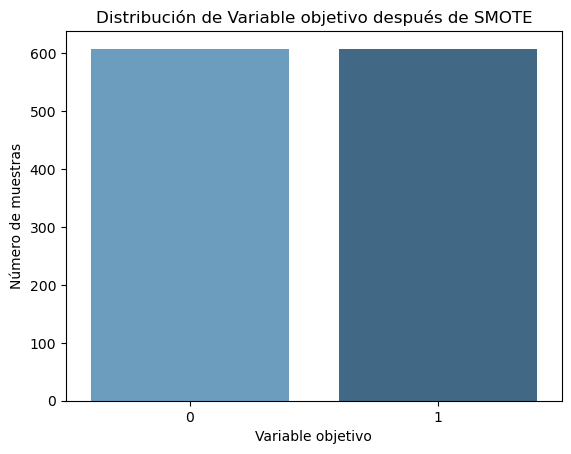

In [112]:
# Conteo de cada clase
class_counts_smote = y_train_smote.value_counts()

# Graficamos
sns.barplot(x=class_counts_smote.index, y=class_counts_smote.values, palette='Blues_d')
plt.xlabel('Variable objetivo')
plt.ylabel('Número de muestras')
plt.title('Distribución de Variable objetivo después de SMOTE')
plt.xticks(class_counts_smote.index) 
plt.show()

### Random under-sampling
Aplicaremos tambien el submuestreo aleatorio, la cual es una técnica que permite reducir el tamaño de la clase mayoritaria. 

In [113]:
# Creamos una instancia de RandomUnderSampler
undersample = RandomUnderSampler(random_state=42)

# Aplicamos el submuestreo
X_train_undersampled, y_train_undersampled = undersample.fit_resample(X_train, y_train)

# Veamos
print("Shape of X_train_undersampled:", X_train_undersampled.shape)
print("Shape of y_train_undersampled:", y_train_undersampled.shape)
print("Shape of X_test_transformed:", X_test.shape)
print("Shape of y_test :", y_test.shape)

Shape of X_train_undersampled: (384, 53)
Shape of y_train_undersampled: (384,)
Shape of X_test_transformed: (200, 53)
Shape of y_test : (200,)


Después de aplicar el submuestreo, tenemos 334 observaciones en la clase mayoritaria para igualar el número de observaciones en la clase minoritaria.

In [114]:
print(y_train_undersampled.value_counts())

fraud_reported
0    192
1    192
Name: count, dtype: int64


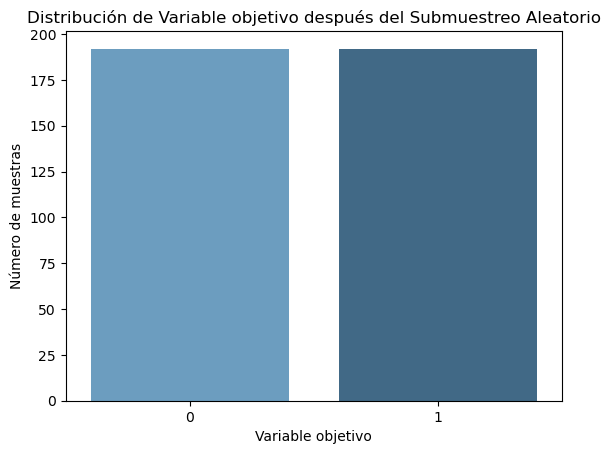

In [115]:
# Conteo de cada clase
class_counts_undersampled = y_train_undersampled.value_counts()

# Graficamos
sns.barplot(x=class_counts_undersampled.index, y=class_counts_undersampled.values, palette='Blues_d')
plt.xlabel('Variable objetivo')
plt.ylabel('Número de muestras')
plt.title('Distribución de Variable objetivo después del Submuestreo Aleatorio')
plt.xticks(class_counts_undersampled.index) 
plt.show()


### Random over-sampling
Aplicaremos el sobremuestreo aleatorio, la cual es una técnica que permite aumentar el tamaño de la clase minoritaria duplicando aleatoriamente algunas de sus muestras hasta que el número de muestras en ambas clases sea igual. 

In [116]:
# Creamos una instancia de RandomOverSampler
oversampled = RandomOverSampler(random_state=42)

# Aplicamos el sobremuestreo
X_train_oversampled, y_train_oversampled = oversampled .fit_resample(X_train, y_train)

# Veamos
print("Shape of X_train_oversampled:", X_train_oversampled.shape)
print("Shape of y_train_oversampled:", y_train_oversampled.shape)
print("Shape of X_test_transformed:", X_test.shape)
print("Shape of y_test :", y_test.shape)



Shape of X_train_oversampled: (1216, 53)
Shape of y_train_oversampled: (1216,)
Shape of X_test_transformed: (200, 53)
Shape of y_test : (200,)


In [117]:
print("Después del sobremuestreo aleatorio:")
print(y_train_oversampled.value_counts())

Después del sobremuestreo aleatorio:
fraud_reported
0    608
1    608
Name: count, dtype: int64


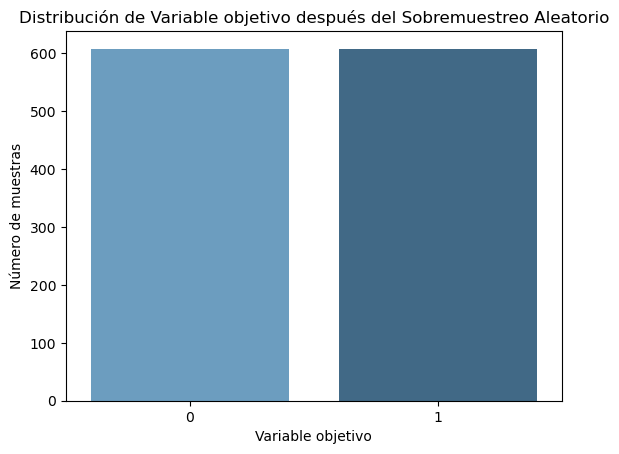

In [118]:
# Conteo de cada clase
class_counts_over = y_train_oversampled.value_counts()

# Graficamos
sns.barplot(x=class_counts_over.index, y=class_counts_over.values, palette='Blues_d')
plt.xlabel('Variable objetivo')
plt.ylabel('Número de muestras')
plt.title('Distribución de Variable objetivo después del Sobremuestreo Aleatorio')
plt.xticks(class_counts_over.index) 
plt.show()


## Over-sampling y despues under-sampling
Vamos a realizar una combinación de tecnicas tanto de over-sampling como de under-sampling, usando SMOTE y Tomek links:

In [119]:
# Creamos una instancia de SMOTETomek
smote_tomek = SMOTETomek(random_state=42)

# Aplicamos SMOTETomek al conjunto de entrenamiento
X_train_smote_tomek, y_train_smote_tomek = smote_tomek.fit_resample(X_train, y_train)

# Veamos
print("Shape of X_train_smote_tomek:", X_train_smote_tomek.shape)
print("Shape of y_train_smote_tomek:", y_train_smote_tomek.shape)
print("Shape of X_test_transformed:", X_test.shape)
print("Shape of y_test :", y_test.shape)


Shape of X_train_smote_tomek: (1204, 53)
Shape of y_train_smote_tomek: (1204,)
Shape of X_test_transformed: (200, 53)
Shape of y_test : (200,)


In [120]:
print("Después de aplicar SMOTE y Tomek Links:")
print(y_train_smote_tomek.value_counts())

Después de aplicar SMOTE y Tomek Links:
fraud_reported
0    602
1    602
Name: count, dtype: int64


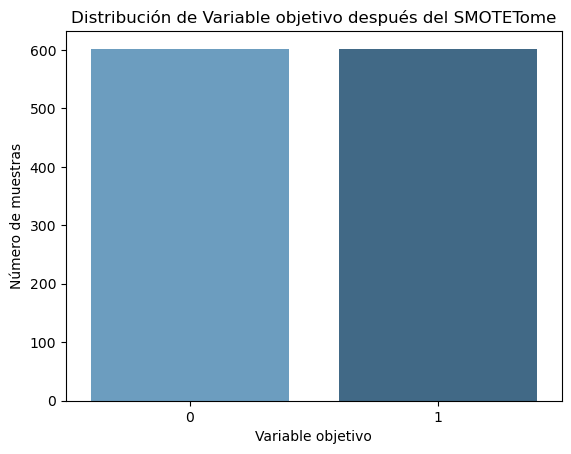

In [121]:
# Conteo de cada clase
class_counts_smote_tomek = y_train_smote_tomek.value_counts()

# Graficamos
sns.barplot(x=class_counts_smote_tomek.index, y=class_counts_smote_tomek.values, palette='Blues_d')
plt.xlabel('Variable objetivo')
plt.ylabel('Número de muestras')
plt.title('Distribución de Variable objetivo después del SMOTETome')
plt.xticks(class_counts_smote_tomek.index) 
plt.show()


# Parte 5. Modelos de Machine Learning

En este apartado vamos a aplicar los diferentes modelos de Machine Learning los datos de entrenamiento que hemos balanceado con diferentes tecnicas.

In [122]:
# Lista de conjuntos de datos balanceados
datasets = [
    (X_train, y_train, X_test, y_test, "Dataset desbalanceado"),
    (X_train_smote, y_train_smote, X_test, y_test, "SMOTE"),
    (X_train_smote_tomek, y_train_smote_tomek, X_test, y_test, "SMOTE Tomek"),
    (X_train_oversampled, y_train_oversampled, X_test, y_test, "Random Over Sampler"),
    (X_train_undersampled, y_train_undersampled,X_test, y_test, "Random Under Sampler")
]

# Regresión Logistica

Veamos el modelo de regresión logistica con todas las variables preprocesadas.

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC
0,Dataset desbalanceado,0.79,0.65,0.51,0.57,0.83
1,SMOTE,0.83,0.66,0.84,0.74,0.84
2,SMOTE Tomek,0.84,0.66,0.85,0.75,0.84
3,Random Over Sampler,0.83,0.64,0.85,0.73,0.83
4,Random Under Sampler,0.80,0.59,0.85,0.70,0.82


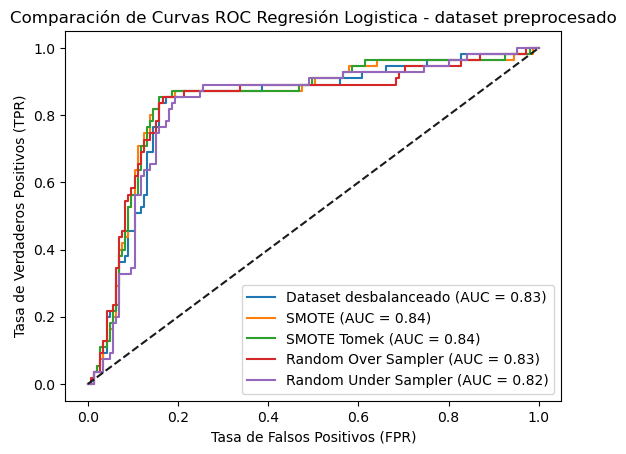

In [123]:
# Creamos el diccionario vacío para almacenar los resultados
results_log_cv = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': []
}

# Creamos un diccionario para las matrices de confusion
Matriz_confusion= {'Dataset':[],
                   'Confusion Matrix':[]}

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    model = LogisticRegression(max_iter=1000)
    model = model.fit(X_train, y_train)

    # Evaluamos el modelo en el conjunto de prueba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Curva ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    # Graficamos la curva ROC
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

  
    # Almacenamos los resultados de las métricas
    results_log_cv['Dataset'].append(dataset_name)
    results_log_cv['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_log_cv['Precision'].append(precision_score(y_test, y_pred))
    results_log_cv['Recall'].append(recall_score(y_test, y_pred))
    results_log_cv['F1-Score'].append(f1_score(y_test, y_pred))
    results_log_cv['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    Matriz_confusion['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion['Dataset'].append(dataset_name)
    
# Imprimimos los resultados de las métricas
results_log_completo = pd.DataFrame(results_log_cv)
display(results_log_completo)

# Graficamos las curvas ROC-AUC
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Regresión Logistica - dataset preprocesado')
plt.legend(loc="lower right")
plt.show()

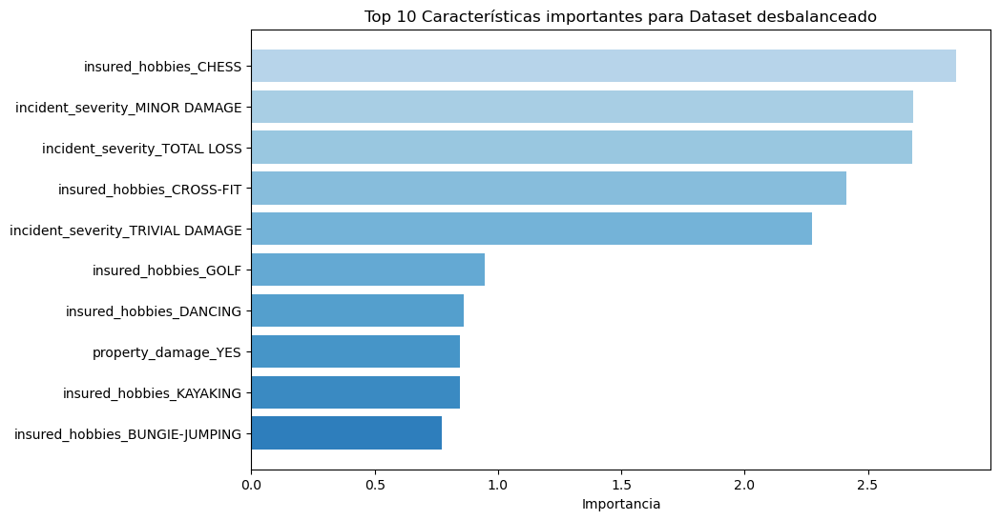

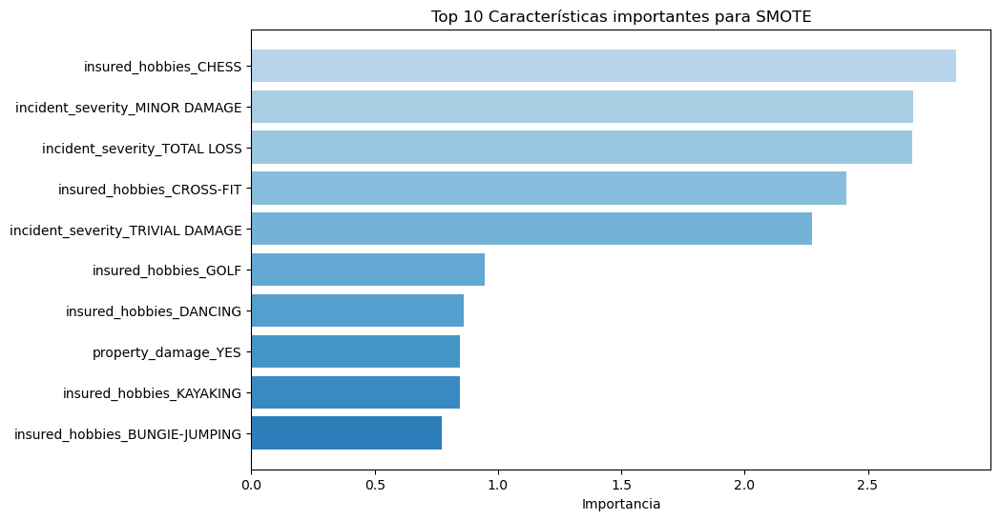

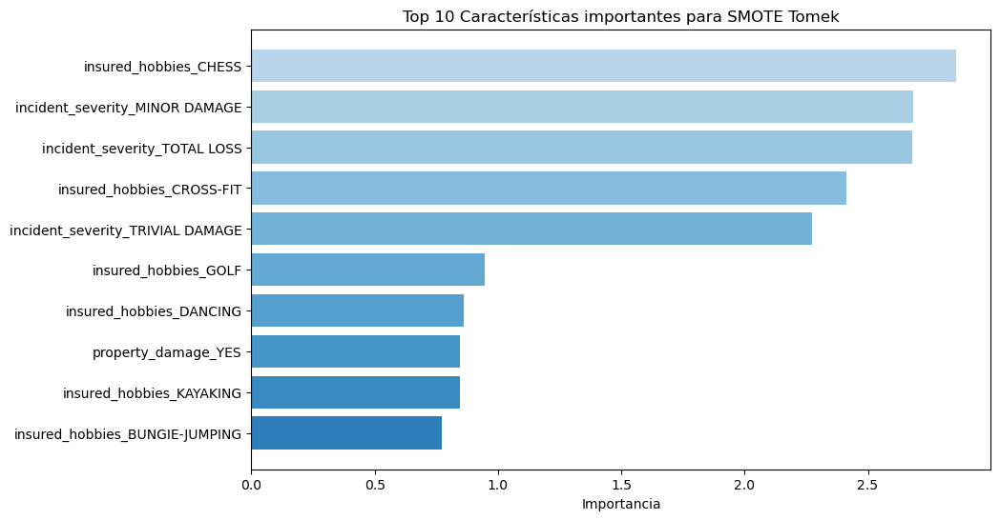

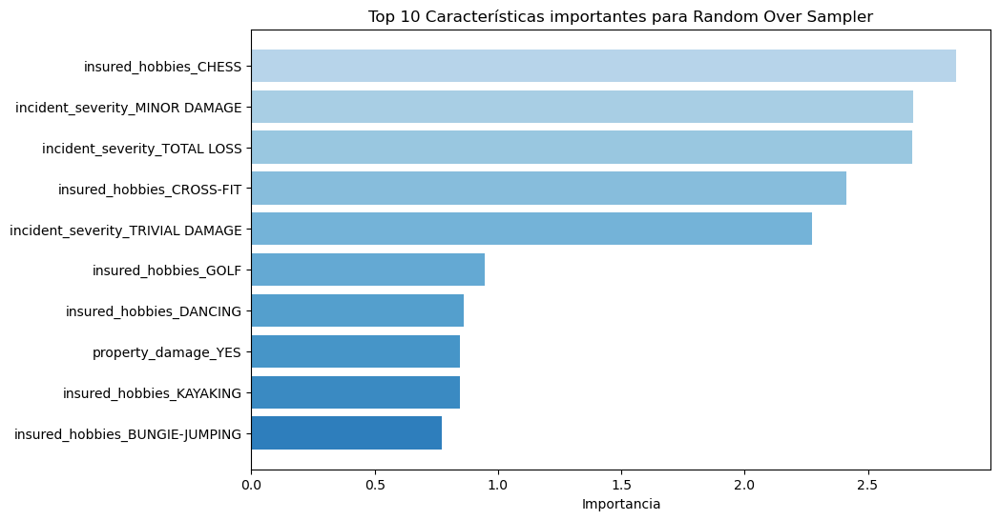

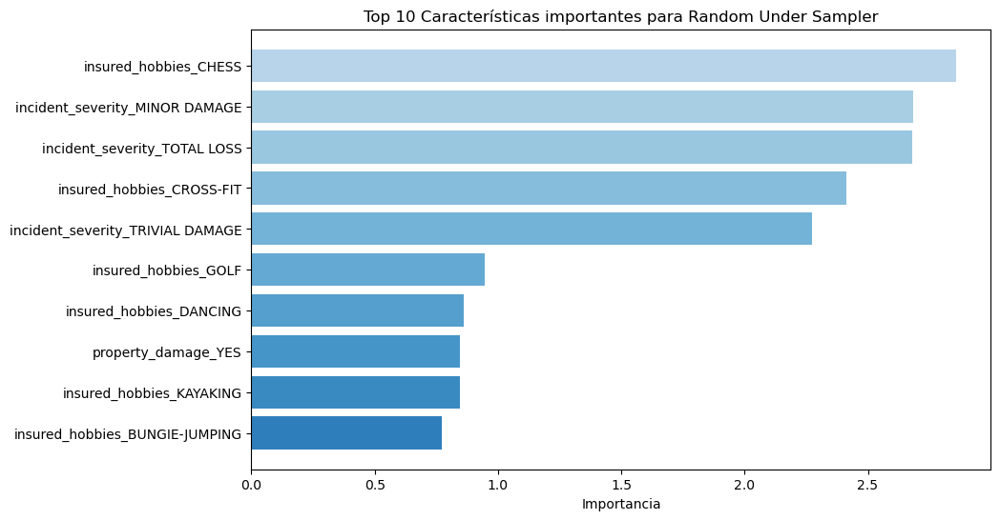

In [124]:
# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
        
    # Obtenemos los coeficientes del modelo y usamos su valor absoluto.
    # Los coeficientes indican la importancia y la dirección de la relación entre cada característica y la variable objetivo.
    importances = np.abs(model.coef_[0])

    # Ordenamos los coeficientes (importancias) de mayor a menor.
    indices = np.argsort(importances)[::-1]

    # Ajustamos top_n al número de características en el modelo actual si es menor que 10 en caso de que exista
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Definimos una paleta de colores azules para la gráfica
    colors = Blues(np.linspace(0.3, 0.7, top_n))

    # Graficamos
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), X_train.columns[top_indices])  
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis() 
    plt.show()

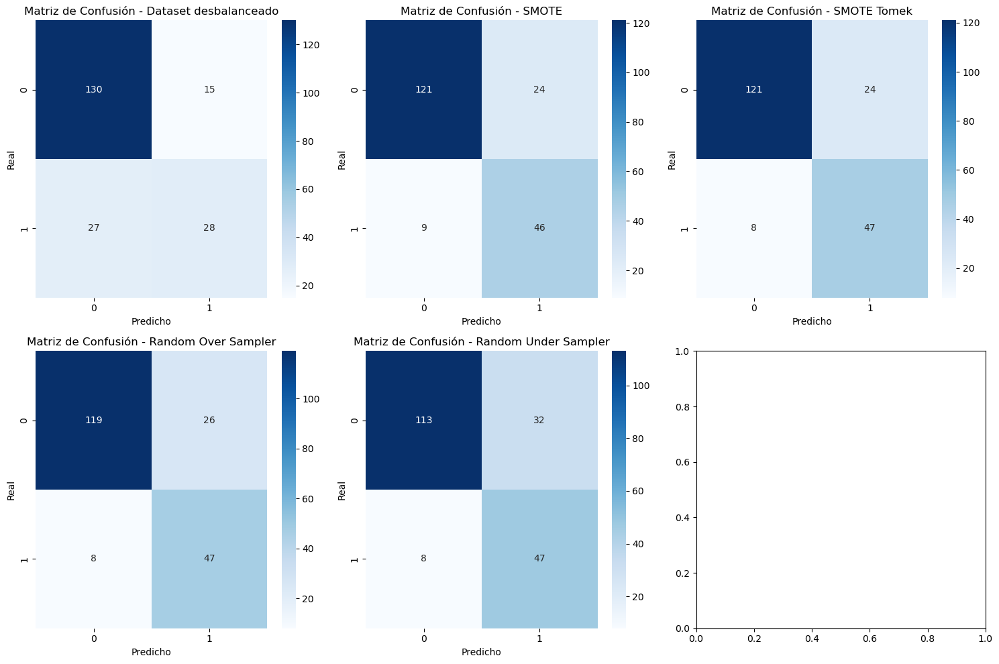

In [125]:
# Matriz de confusión de la regresion logaritmica

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

### Análisis de Importancia de Características en Regresión Logística

Vamos a analizar la Importancia de Características en Regresión Logística sobre nuestro modelo de regresión y ver que variables impactan más en el fraude. 

Ahora vamos a validar el modelo y ver su rendimiento en el conjunto de datos de prueba. 

In [126]:
# Regresión Logistica

# Creamos el diccionario vacio de las metricas para almacenar los resultados
results_log = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': [],
    'Mejores hiperparametros': []
}

# Definimos la busqueda de  hiperparámetros para regresion logistica
param_distributions = {
    'reg_log__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'reg_log__penalty': ['l1', 'l2'],
    'reg_log__solver': ['lbfgs', 'iblinear', 'newton-cg','sag', 'saga']
}

# Para las matrices
Matriz_confusion_log = {'Dataset':[],
                   'Confusion Matrix':[]}

# Creamos la regresion logistica
LG = LogisticRegression(max_iter=1000, random_state=42)

# Creamos el selector RFECV
selector = RFECV(estimator=LG, step=1, cv=StratifiedKFold(5), scoring='accuracy')

# Creamos un Pipeline con RFECV y LG
pipeline = Pipeline([
    ('feature_selection', selector),
    ('reg_log', LG)
])

# Creamos listas vacias para almacenar los selectores RFECV y los mejores modelos
selected_features = []
best_models = []

# Creamos RandomsearchCV con el pipeline
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_distributions, n_iter=10, cv=StratifiedKFold(5), scoring='accuracy', n_jobs=-1, random_state=42)
# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    # Entrenamos el modelo con random_search
    random_search.fit(X_train, y_train) #entrenamos

    # Guardamos los mejores hiperparámetros y los modelos con los mejores hiperparametros
    best_params = random_search.best_params_
    best_model = random_search.best_estimator_
    best_models.append(best_model) # Guardamos los modelos
    
    # Imprimimos los mejores hiperparámetros y las características seleccionadas
    selector = best_model.named_steps['feature_selection']
    print(f"Mejores hiperparámetros para {dataset_name}: {best_params}") 
    print(" ")
    print(f"Num de características seleccionadas para {dataset_name}: {selector.n_features_}")
    print(" ")
    selected_features_list = X_train.columns[selector.support_].tolist()
    print("Características seleccionadas: ", selected_features_list)
    print("\n" + "=" * 50) 
    # Almacenamos las caracteristicas optimas
    selected_features.append(selected_features_list)

    # Aplicamos a el conjunto de prueba de cada conjunto de datos
    y_pred = best_model.predict(X_test) # predecimos 
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]
    
    # Almacenamos los resultados de las metricas
    results_log['Dataset'].append(dataset_name)
    results_log['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_log['Precision'].append(precision_score(y_test, y_pred))
    results_log['Recall'].append(recall_score(y_test, y_pred)) 
    results_log['F1-Score'].append(f1_score(y_test, y_pred))
    results_log['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    results_log['Mejores hiperparametros'].append(best_params)
    Matriz_confusion_log['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_log['Dataset'].append(dataset_name)

    
# Imprimimos los resultados de las metricas y los hiperparametros
results_log = pd.DataFrame(results_log)
display(results_log)

Mejores hiperparámetros para Dataset desbalanceado: {'reg_log__solver': 'saga', 'reg_log__penalty': 'l1', 'reg_log__C': 100}
 
Num de características seleccionadas para Dataset desbalanceado: 7
 
Características seleccionadas:  ['insured_hobbies_CAMPING', 'insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'insured_hobbies_GOLF', 'incident_severity_MINOR DAMAGE', 'incident_severity_TOTAL LOSS', 'incident_severity_TRIVIAL DAMAGE']

Mejores hiperparámetros para SMOTE: {'reg_log__solver': 'saga', 'reg_log__penalty': 'l2', 'reg_log__C': 10}
 
Num de características seleccionadas para SMOTE: 26
 
Características seleccionadas:  ['insured_hobbies_BASKETBALL', 'insured_hobbies_BUNGIE-JUMPING', 'insured_hobbies_CAMPING', 'insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'insured_hobbies_DANCING', 'insured_hobbies_EXERCISE', 'insured_hobbies_GOLF', 'insured_hobbies_HIKING', 'insured_hobbies_KAYAKING', 'insured_hobbies_MOVIES', 'insured_hobbies_PAINTBALL', 'insured_hobbies_SLEEPING', 'insu

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros
0,Dataset desbalanceado,0.84,0.66,0.85,0.75,0.84,"{'reg_log__solver': 'saga', 'reg_log__penalty'..."
1,SMOTE,0.84,0.67,0.84,0.74,0.85,"{'reg_log__solver': 'saga', 'reg_log__penalty'..."
2,SMOTE Tomek,0.83,0.66,0.84,0.74,0.84,"{'reg_log__solver': 'saga', 'reg_log__penalty'..."
3,Random Over Sampler,0.83,0.65,0.87,0.74,0.85,"{'reg_log__solver': 'saga', 'reg_log__penalty'..."
4,Random Under Sampler,0.83,0.65,0.87,0.74,0.85,"{'reg_log__solver': 'saga', 'reg_log__penalty'..."


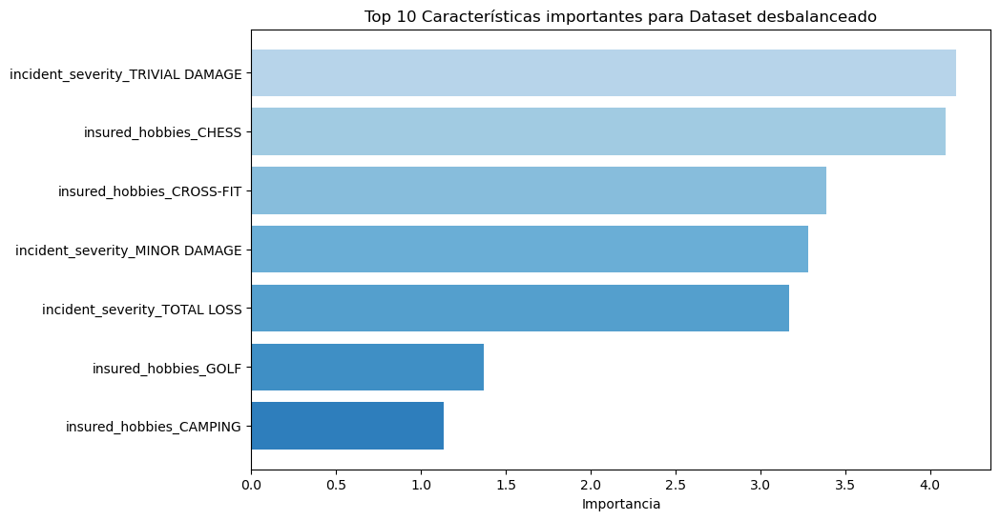

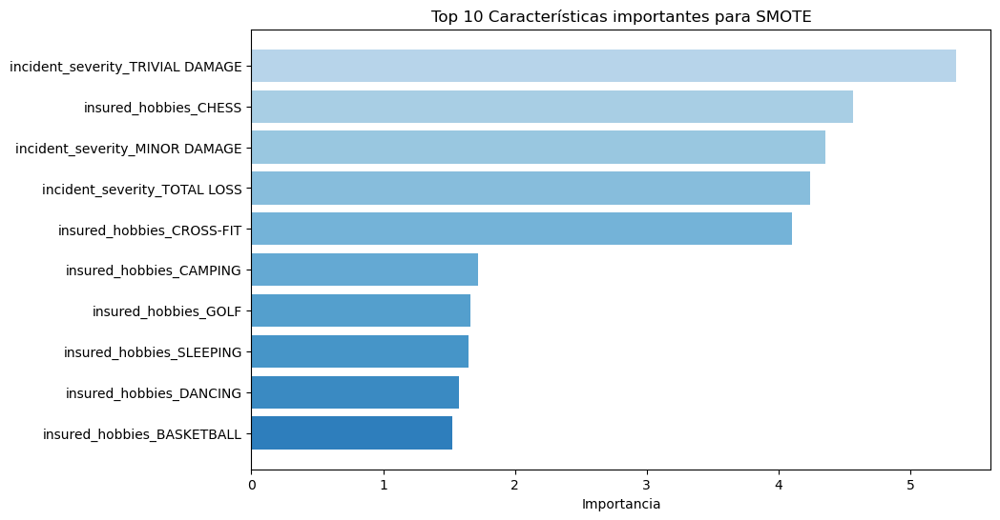

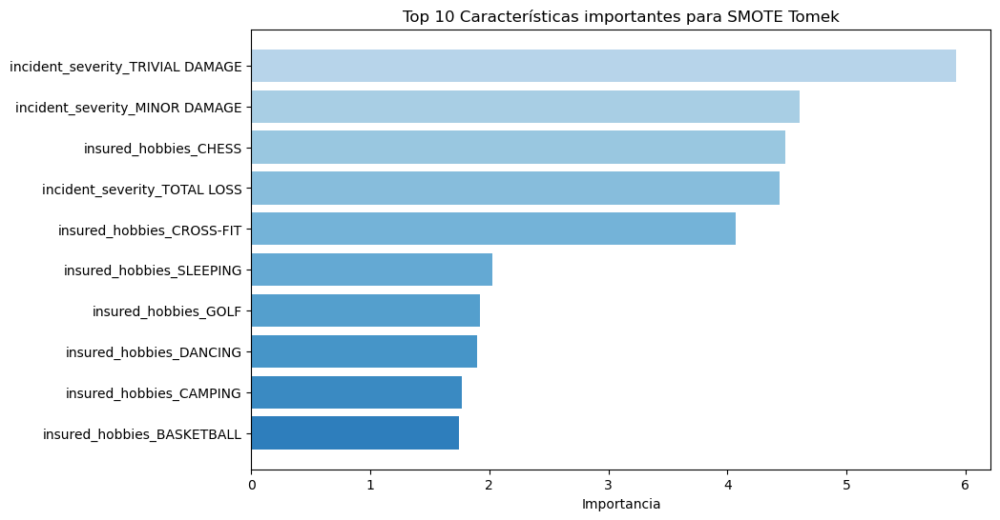

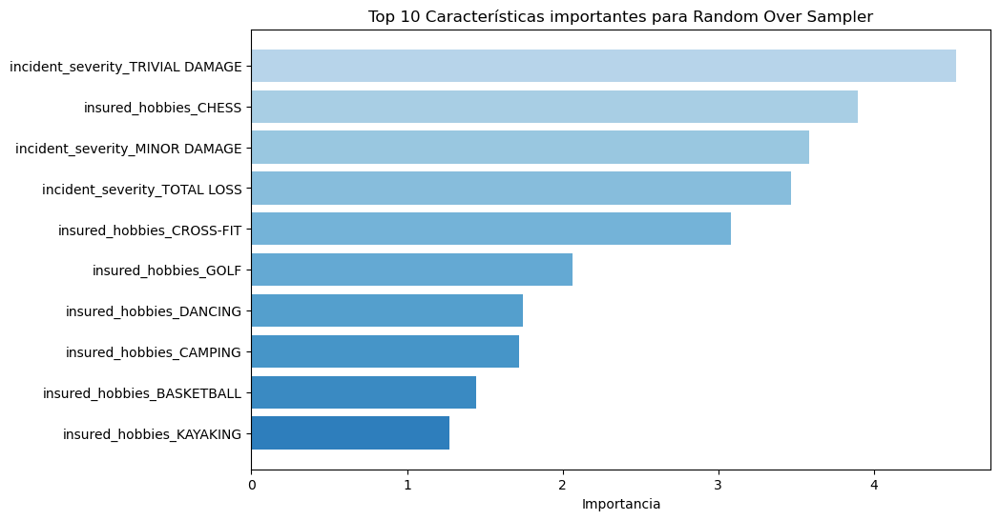

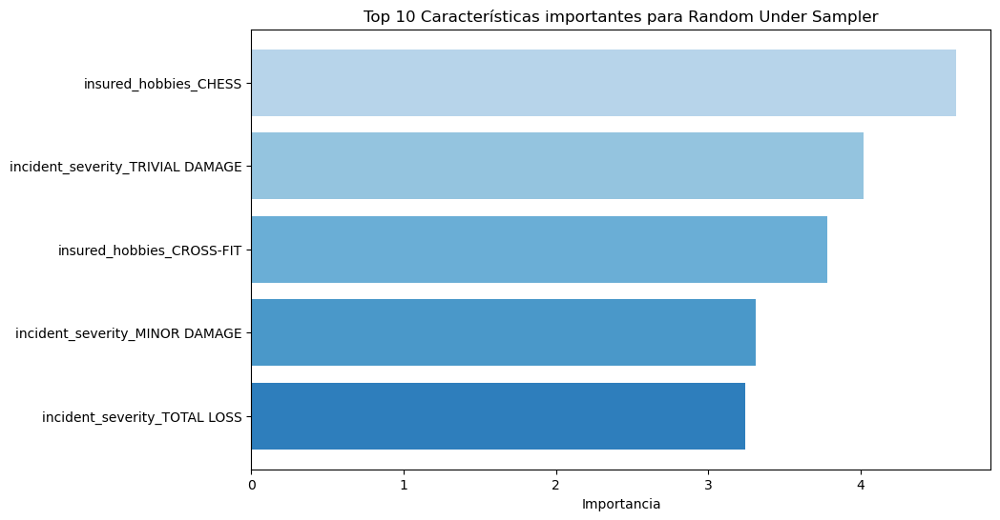

In [127]:
# Grafica de caracteristicas optimas y su importancia en el dataset

# Grafica de características óptimas y su importancia en el dataset
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i]  # El mejor modelo es un Pipeline

    # Obtenemos los coeficientes del modelo y las características seleccionadas
    model = best_pipeline.named_steps['reg_log']
    importances = np.abs(model.coef_[0])
    selector = best_pipeline.named_steps['feature_selection']
    selected_columns = X_train.columns[selector.support_]

    # Ordenamos los coeficientes (importancias) de mayor a menor
    indices = np.argsort(importances)[::-1]
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Definimos una paleta de colores azules para la gráfica
    colors = Blues(np.linspace(0.3, 0.7, top_n))

    # Graficamos
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), selected_columns[top_indices])  
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis()
    plt.show()


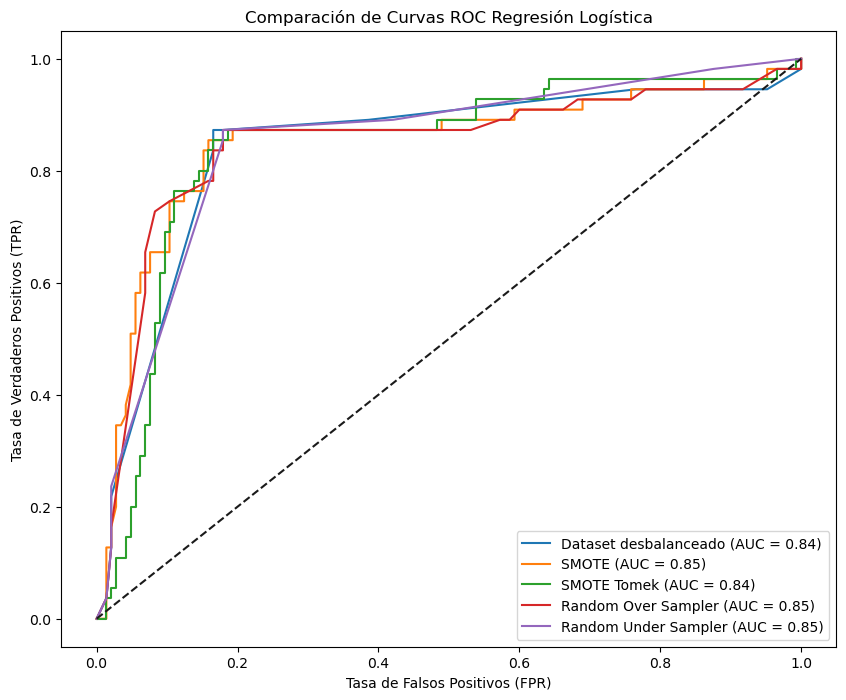

In [128]:
# Grafica de la ROC-AUC del modelo de regresion logistica

plt.figure(figsize=(10, 8))

# Iteramos sobre cada conjunto de datos y sus respectivos modelos
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i]  # Usamos el Pipeline correspondiente

    # No es necesario transformar X_test ya que el Pipeline ya incluye RFECV
    y_pred_proba = best_pipeline.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    # Graficamos la curva ROC
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Regresión Logística')
plt.legend(loc="lower right")
plt.show()


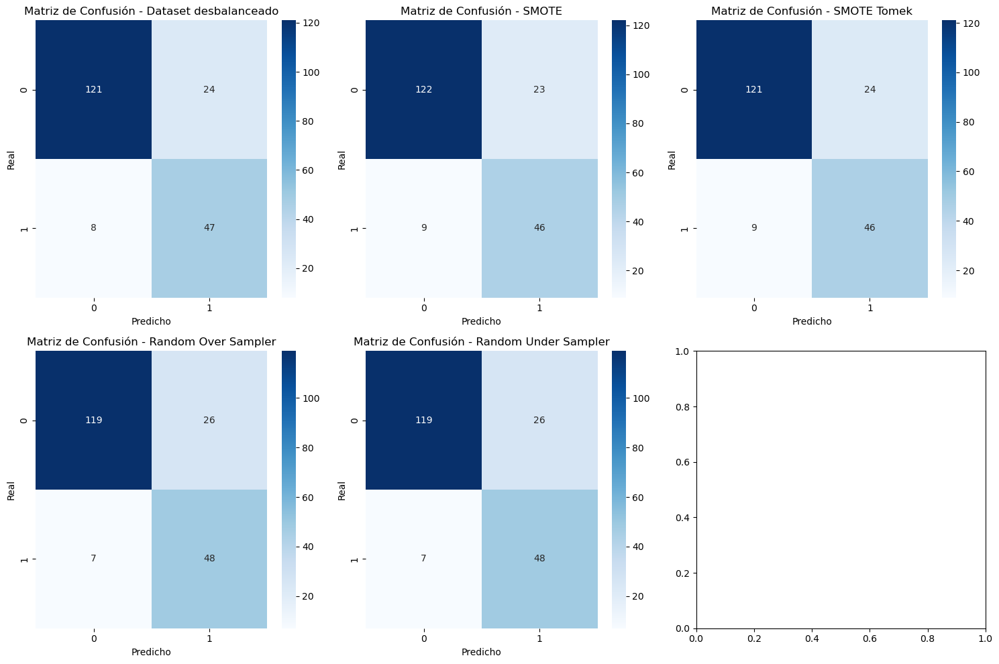

In [129]:
# Matriz de confusión de la regresion logaritmica

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_log['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_log['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()


In [130]:
# Mejor modelo de regresion
best_Log = results_log[results_log['Dataset'] == 'Random Under Sampler']
best_Log['Model'] = 'REG. LOG'
best_Log

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros,Model
4,Random Under Sampler,0.83,0.65,0.87,0.74,0.85,"{'reg_log__solver': 'saga', 'reg_log__penalty'...",REG. LOG


# Random Forest



### Utilización de variables originales

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC
0,Dataset desbalanceado,0.76,0.59,0.35,0.44,0.82
1,SMOTE,0.78,0.62,0.51,0.56,0.85
2,SMOTE Tomek,0.78,0.61,0.49,0.55,0.85
3,Random Over Sampler,0.78,0.61,0.51,0.55,0.82
4,Random Under Sampler,0.79,0.58,0.76,0.66,0.82


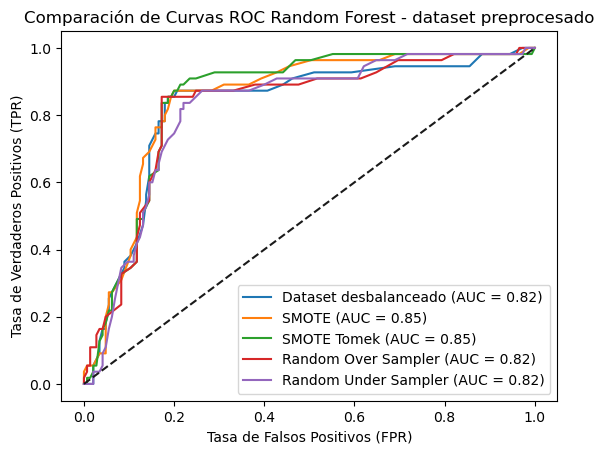

In [131]:
# Creamos el diccionario vacío para almacenar los resultados
results_rf = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': []
}

# Creamos un diccionario para almacenar las matrices
Matriz_confusion_rf= {'Dataset':[],
                   'Confusion Matrix':[]}

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    model = RandomForestClassifier(random_state=42)
    model = model.fit(X_train, y_train)

    # Evaluamos el modelo en el conjunto de prueba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Graficamos la curva ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

  
    # Almacenamos los resultados de las métricas
    results_rf['Dataset'].append(dataset_name)
    results_rf['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_rf['Precision'].append(precision_score(y_test, y_pred))
    results_rf['Recall'].append(recall_score(y_test, y_pred))
    results_rf['F1-Score'].append(f1_score(y_test, y_pred))
    results_rf['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    Matriz_confusion_rf['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_rf['Dataset'].append(dataset_name)
    
# Imprimimos los resultados de las métricas
results_rf_completo = pd.DataFrame(results_rf)
display(results_rf_completo)

# Graficamos las curvas ROC-AUC
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Random Forest - dataset preprocesado')
plt.legend(loc="lower right")
plt.show()

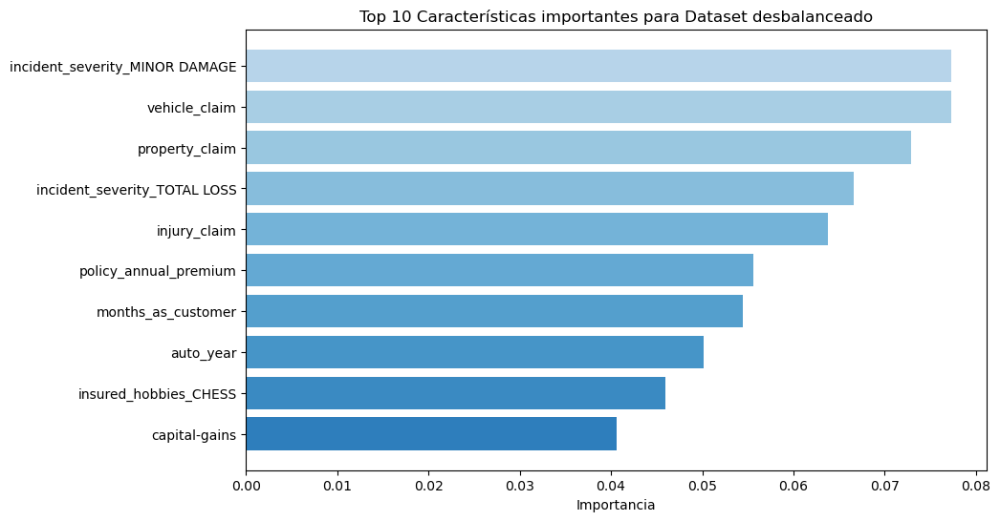

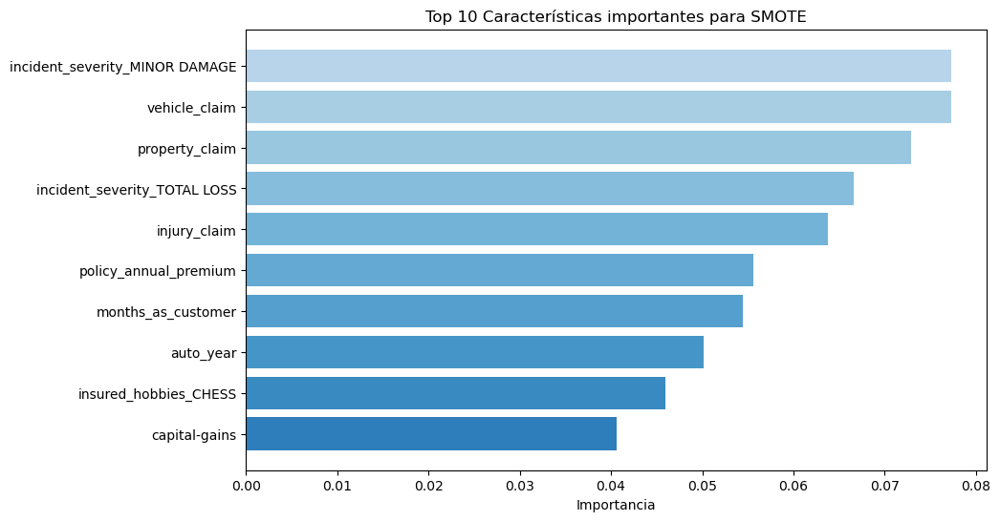

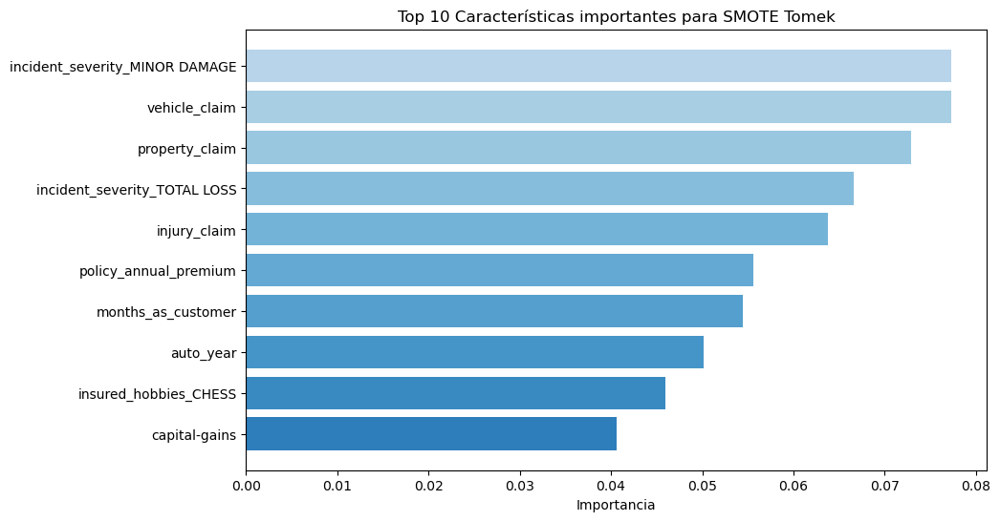

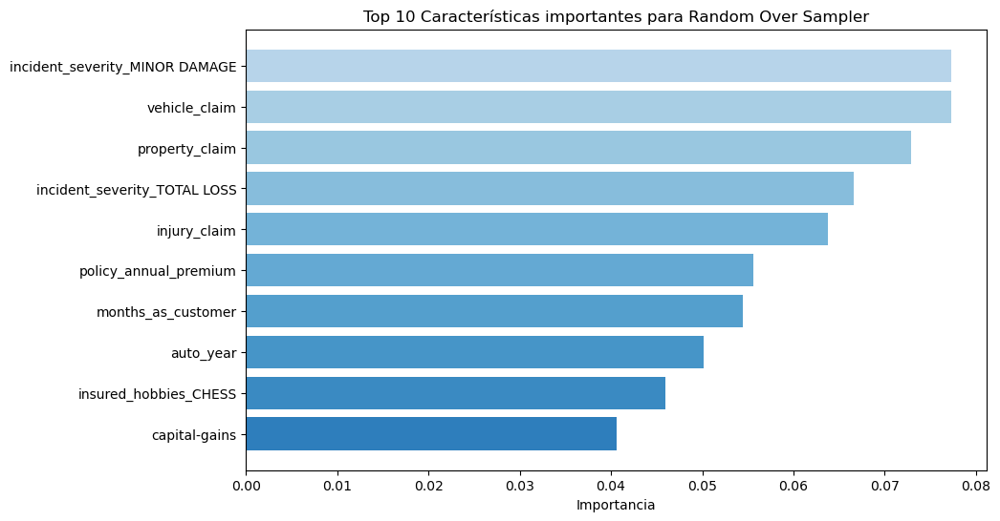

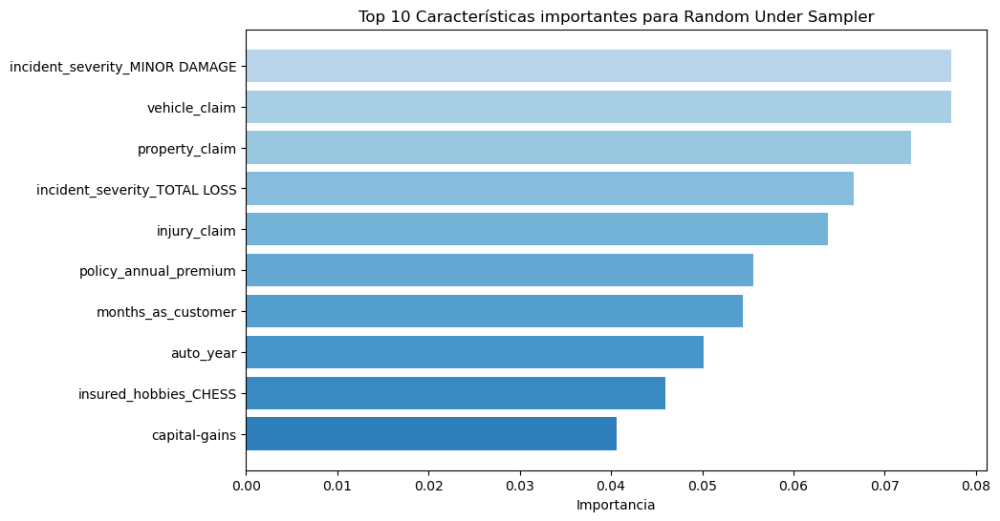

In [132]:
# Gráfica de selección de características más importantes en Random Forest

# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    importances = model.feature_importances_  # Sacamos la importancia de las variables
    
    # Obtenemos los índices de las características ordenados por importancia
    indices = np.argsort(importances)[::-1]

    # Ajustamos top_n al número de características en el modelo actual si es menor que 10 en caso de que exista
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Definimos una paleta de colores azules para la gráfica
    colors = Blues(np.linspace(0.3, 0.7, top_n))

    # Graficamos
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), X_train.columns[top_indices])  
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis() 
    plt.show()

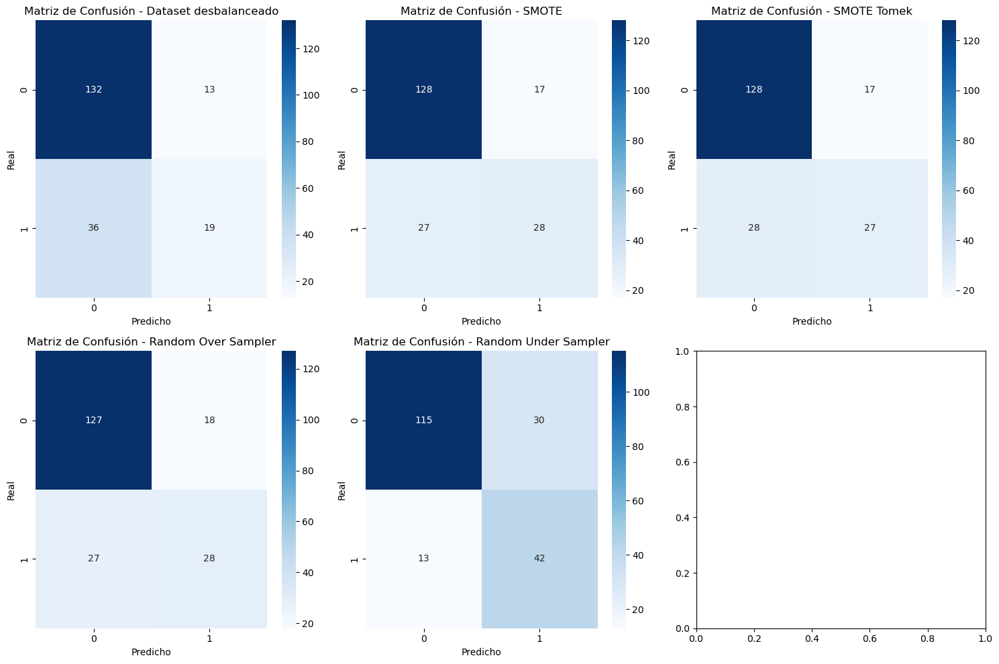

In [133]:
# Matriz de confusión de la regresion logaritmica

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_rf['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_rf['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()


## Seleccion de caracteristicas Optimas.

Método RFECV

## Validación y evaluacion de modelo en conjunto de prueba- Random Forest

In [134]:
# Random Forest


# Creamos el diccionario vacio de las metricas para almacenar los resultados
results_rf_cv = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': [],
    'Mejores hiperparametros': []
}

# Para las matrices
Matriz_confusion_rf = {'Dataset':[],
                   'Confusion Matrix':[]}

# Definimos la busqueda de  hiperparámetros para Random Forest
param_distributions =  {
    'rf__n_estimators': [100, 200], 
    'rf__max_depth': [None, 10, 20],  
    'rf__max_features': ['auto', 'sqrt']            
}


# Creamos Random Forest
RF = RandomForestClassifier(random_state=42)

# Creamos el selector RFECV
selector = RFECV(estimator=RF, step=1, cv=StratifiedKFold(5), scoring='accuracy')

# Creamos un Pipeline con RFECV y RF
pipeline = Pipeline([
    ('feature_selection', selector),
    ('rf', RF)
])

# Creamos listas vacias para almacenar los selectores RFECV y los mejores modelos
selected_features = []
best_models = []

# Creamos RandomsearchCV con el pipeline
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_distributions, n_iter=10, cv=StratifiedKFold(5), scoring='accuracy', n_jobs=-1, random_state=42)

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    # Entrenamos el modelo con GridSearchCV
    random_search.fit(X_train, y_train) #entrenamos

    # Guardamos los mejores hiperparámetros y los modelos con los mejores hiperparametros
    best_params = random_search.best_params_
    best_model = random_search.best_estimator_
    best_models.append(best_model) # Guardamos los modelos
    
    # Imprimimos los mejores hiperparámetros y las características seleccionadas
    selector = best_model.named_steps['feature_selection']
    print(f"Mejores hiperparámetros para {dataset_name}: {best_params}") 
    print(" ")
    print(f"Num de características seleccionadas para {dataset_name}: {selector.n_features_}")
    print(" ")
    selected_features_list = X_train.columns[selector.support_].tolist()
    print("Características seleccionadas: ", selected_features_list)
    print("\n" + "=" * 50) 
    # Almacenamos las caracteristicas optimas
    selected_features.append(selected_features_list)

    # Aplicamos a el conjunto de prueba de cada conjunto de datos
    y_pred = best_model.predict(X_test) # predecimos 
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]
    
    # Guardamos los resultados de las metricas en el diccionario
    results_rf_cv['Dataset'].append(dataset_name)
    results_rf_cv['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_rf_cv['Precision'].append(precision_score(y_test, y_pred))
    results_rf_cv['Recall'].append(recall_score(y_test, y_pred))
    results_rf_cv['F1-Score'].append(f1_score(y_test, y_pred))
    results_rf_cv['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    results_rf_cv['Mejores hiperparametros'].append(best_params)
    Matriz_confusion_rf['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_rf['Dataset'].append(dataset_name)

# Imprimimos las metricas
results_rf = pd.DataFrame(results_rf_cv)
display(results_rf)

Mejores hiperparámetros para Dataset desbalanceado: {'rf__n_estimators': 100, 'rf__max_features': 'sqrt', 'rf__max_depth': 20}
 
Num de características seleccionadas para Dataset desbalanceado: 17
 
Características seleccionadas:  ['insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'incident_severity_MINOR DAMAGE', 'incident_severity_TOTAL LOSS', 'months_as_customer', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']

Mejores hiperparámetros para SMOTE: {'rf__n_estimators': 200, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}
 
Num de características seleccionadas para SMOTE: 43
 
Características seleccionadas:  ['insured_hobbies_BOARD-GAMES', 'insured_hobbies_CAMPING', 'insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'insured_hobbies_DANCING', 'insured_hobbies_EXERCISE', 'insured_hobbies_KAYAKING', 'insur

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros
0,Dataset desbalanceado,0.79,0.62,0.60,0.61,0.85,"{'rf__n_estimators': 100, 'rf__max_features': ..."
1,SMOTE,0.78,0.60,0.58,0.59,0.84,"{'rf__n_estimators': 200, 'rf__max_features': ..."
2,SMOTE Tomek,0.81,0.65,0.65,0.65,0.83,"{'rf__n_estimators': 200, 'rf__max_features': ..."
3,Random Over Sampler,0.77,0.58,0.53,0.55,0.82,"{'rf__n_estimators': 100, 'rf__max_features': ..."
4,Random Under Sampler,0.81,0.63,0.80,0.70,0.82,"{'rf__n_estimators': 200, 'rf__max_features': ..."


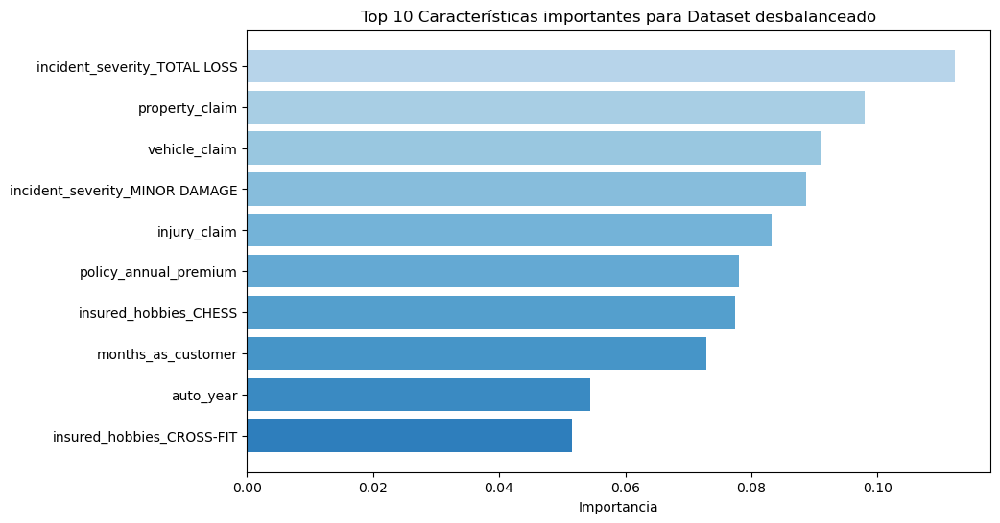

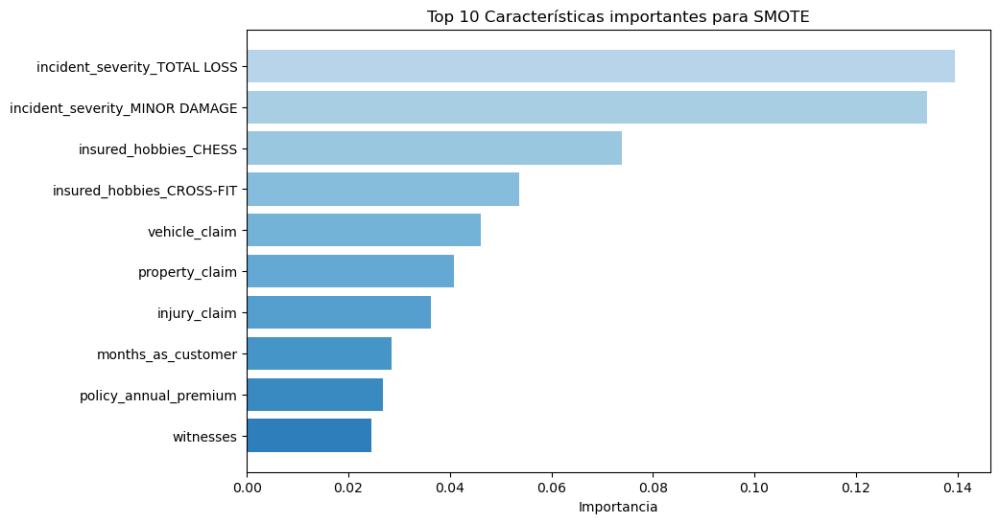

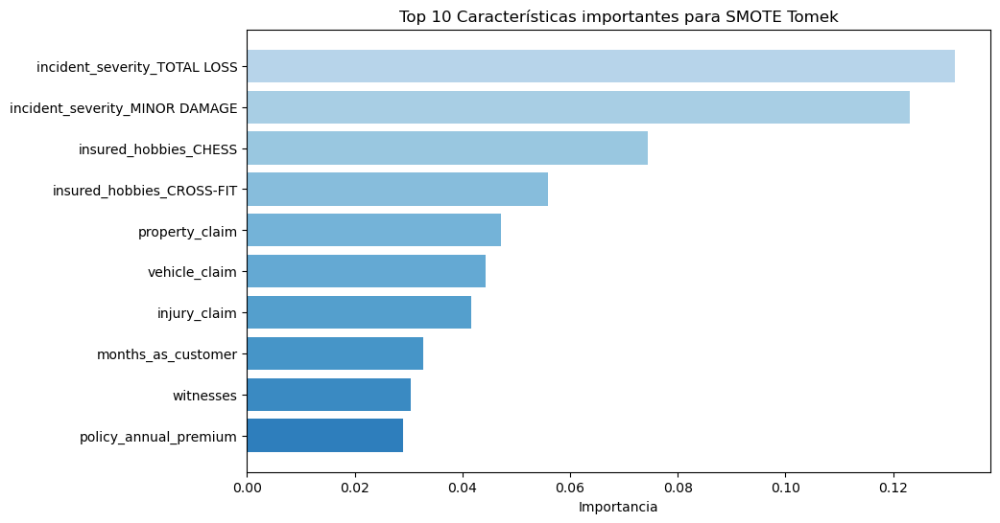

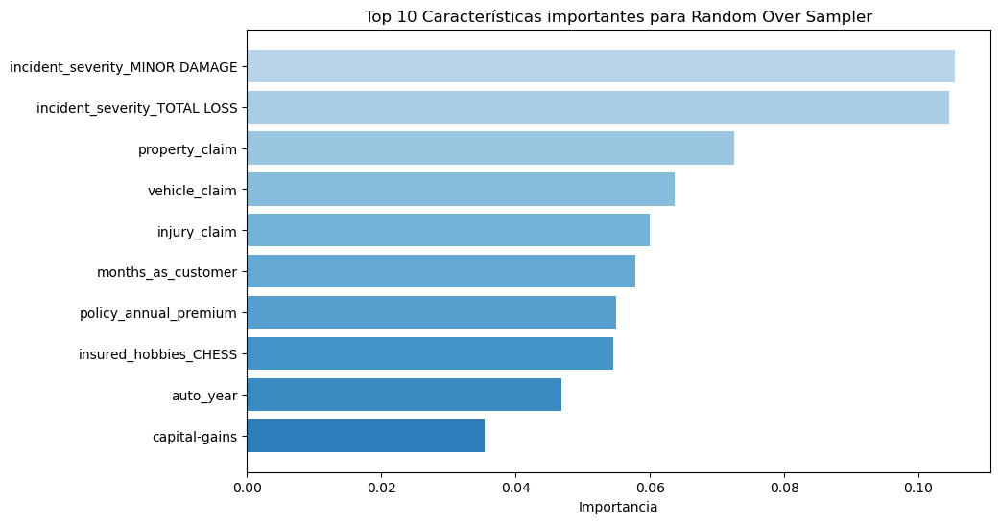

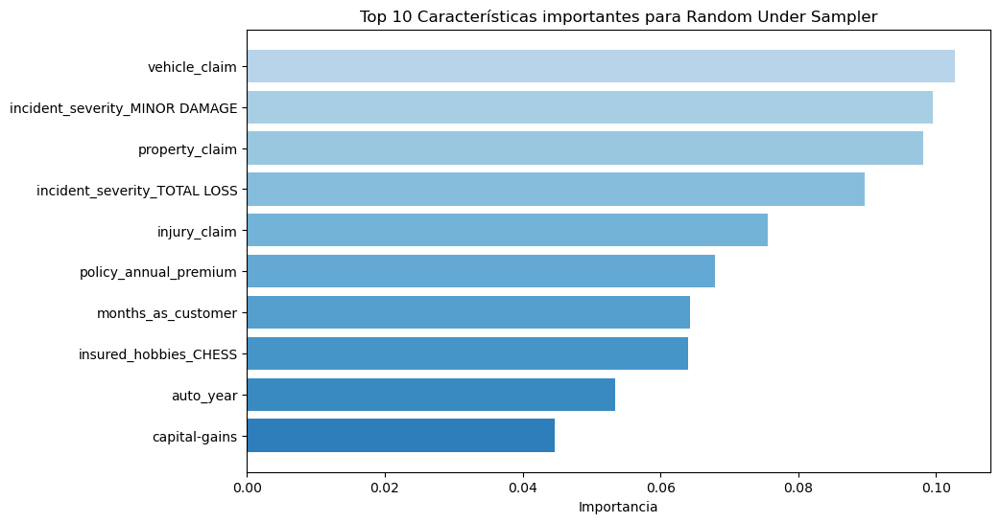

In [135]:
# Gráfica de selección de características más importantes en Random Forest

# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test,dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i] 
    
    # Obtenemos las importancias de las características del modelo Random Forest
    rf_model = best_pipeline.named_steps['rf']
    importances = rf_model.feature_importances_
    
    # Obtenemos las características seleccionadas por RFECV
    selector = best_pipeline.named_steps['feature_selection']
    selected_columns = X_train.columns[selector.support_]

    # Ordenamos las importancias de mayor a menor
    indices = np.argsort(importances)[::-1]
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Graficamos las importancias
    colors = Blues(np.linspace(0.3, 0.7, top_n))
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), selected_columns[top_indices])
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis()
    plt.show()

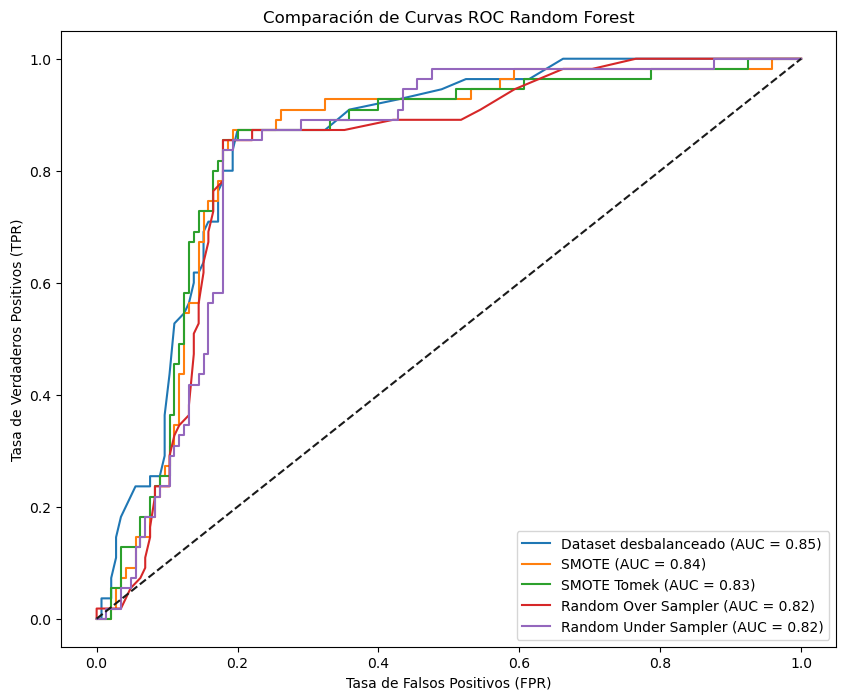

In [136]:
# Grafica de Curvas de Roc Random Forest


plt.figure(figsize=(10, 8))
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i]  # El mejor modelo para el i-ésimo conjunto de datos
    
    # Transformamos X_test utilizando el selector RFECV dentro del pipeline
    X_test_selected = best_pipeline.named_steps['feature_selection'].transform(X_test)
    
    # Ahora obtenemos las predicciones de probabilidad del modelo para X_test_selected
    y_pred_proba = best_pipeline.named_steps['rf'].predict_proba(X_test_selected)[:, 1]
    
    # Calculamos la curva ROC y el área bajo la curva (AUC)
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    # Graficamos la curva ROC para el conjunto de datos actual
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal para comparar
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Random Forest')
plt.legend(loc="lower right")
plt.show()


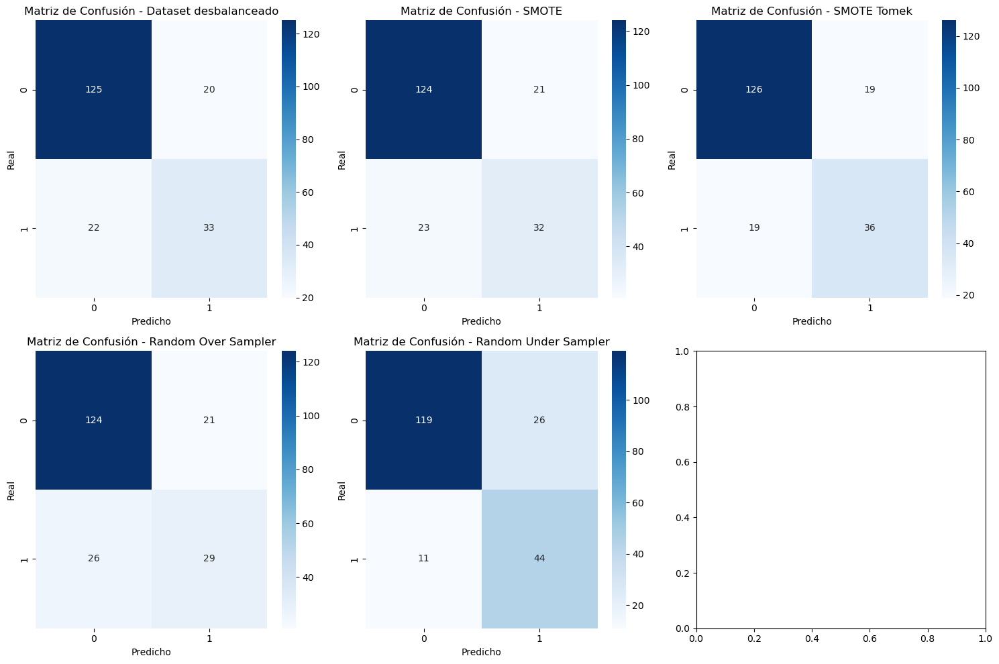

In [137]:
# Grafica de matrices de confusión de Random Forest

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_rf['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_rf['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

In [138]:
# Mejor modelo de Random Forest
best_RF = results_rf[results_rf['Dataset'] == 'Random Under Sampler']
best_RF['Model'] = 'RANDOM FOREST'
best_RF

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros,Model
4,Random Under Sampler,0.81,0.63,0.80,0.70,0.82,"{'rf__n_estimators': 200, 'rf__max_features': ...",RANDOM FOREST


# Decision Tree

Vamos a continuar con el modelo de Decision Tree.

### Utilización de todas las variables

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC
0,Dataset desbalanceado,0.76,0.59,0.35,0.44,0.82
1,SMOTE,0.78,0.62,0.51,0.56,0.85
2,SMOTE Tomek,0.78,0.61,0.49,0.55,0.85
3,Random Over Sampler,0.78,0.61,0.51,0.55,0.82
4,Random Under Sampler,0.79,0.58,0.76,0.66,0.82


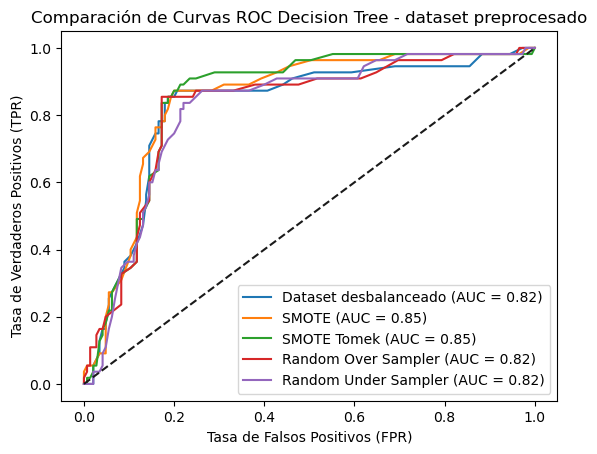

In [139]:
# Creamos el diccionario vacío para almacenar los resultados
results_dt = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': []
}

# Creacion de matrices de confusión

Matriz_confusion_dt= {'Dataset':[],
                   'Confusion Matrix':[]}

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    # Realizamos una búsqueda de hiperparámetros con GridSearchCV
    model = RandomForestClassifier(random_state=42)
    model = model.fit(X_train, y_train)

    # Evaluamos el modelo en el conjunto de prueba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Graficamos la curva ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

  
    # Almacenamos los resultados de las métricas
    results_dt['Dataset'].append(dataset_name)
    results_dt['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_dt['Precision'].append(precision_score(y_test, y_pred))
    results_dt['Recall'].append(recall_score(y_test, y_pred))
    results_dt['F1-Score'].append(f1_score(y_test, y_pred))
    results_dt['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    Matriz_confusion_dt['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_dt['Dataset'].append(dataset_name)
    
# Imprimimos los resultados de las métricas
results_dt_completo = pd.DataFrame(results_dt)
display(results_dt_completo)

# Graficamos las curvas ROC-AUC
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Decision Tree - dataset preprocesado')
plt.legend(loc="lower right")
plt.show()

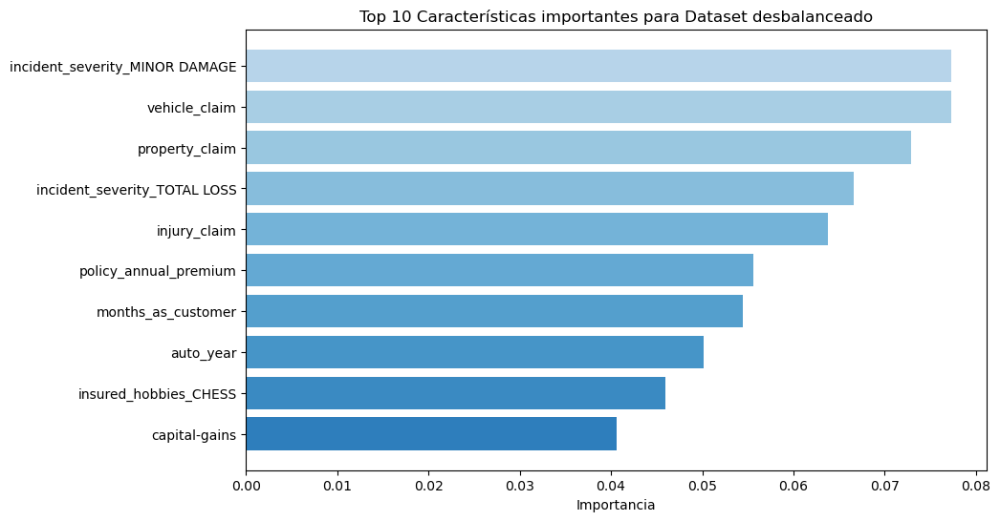

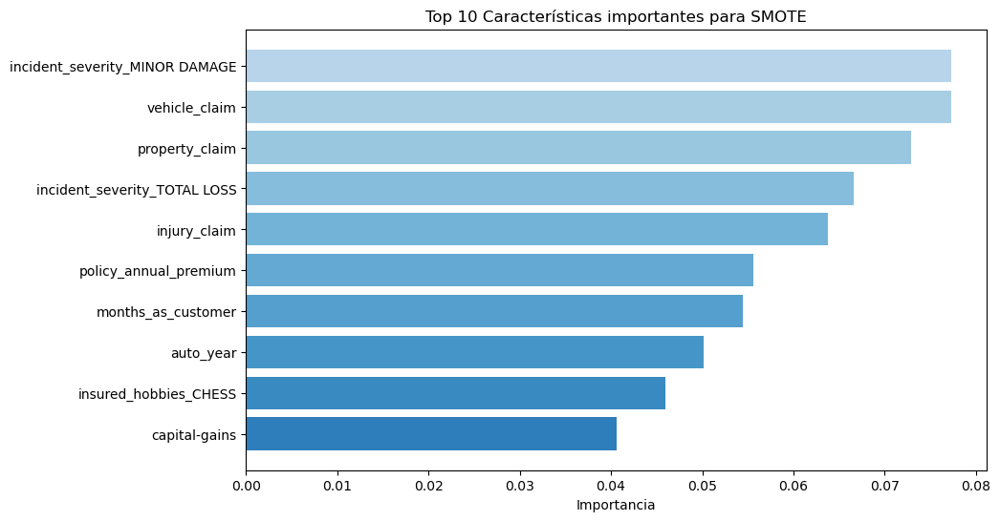

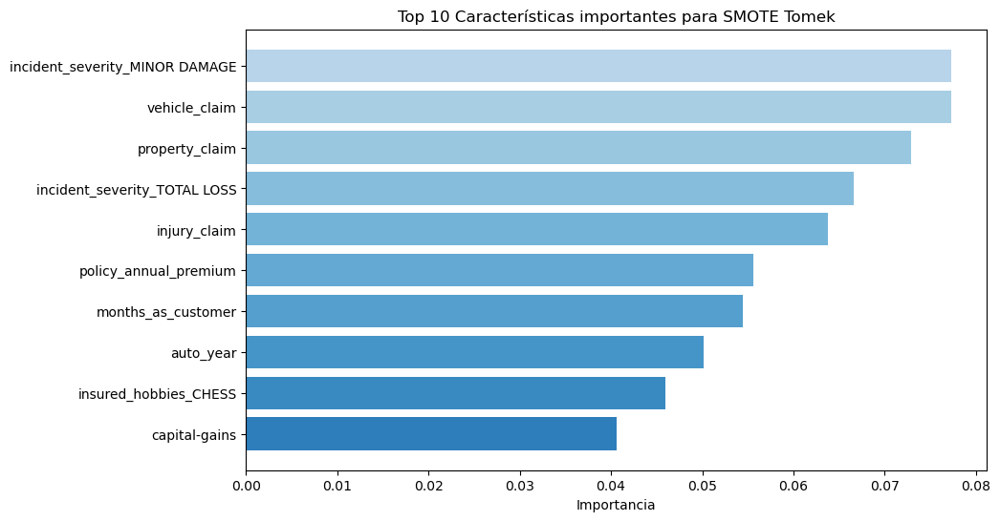

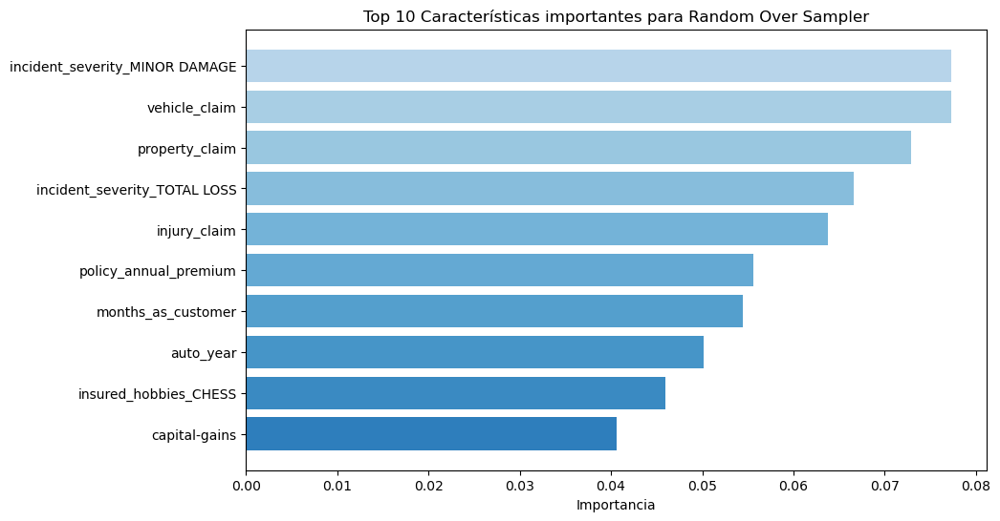

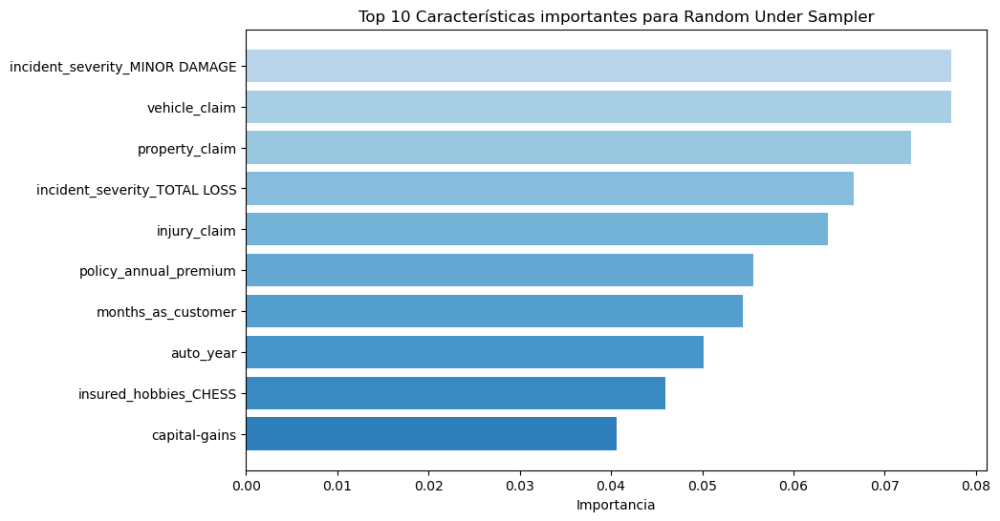

In [140]:
# Gráfica de selección de características más importantes en Decision Trees
# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    importances = model.feature_importances_  # Sacamos la importancia de las variables
    
    # Obtenemos los índices de las características ordenados por importancia
    indices = np.argsort(importances)[::-1]

    # Ajustamos top_n al número de características en el modelo actual si es menor que 10 en caso de que exista
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Definimos una paleta de colores azules para la gráfica
    colors = Blues(np.linspace(0.3, 0.7, top_n))

    # Graficamos
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), X_train.columns[top_indices])  
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis() 
    plt.show()

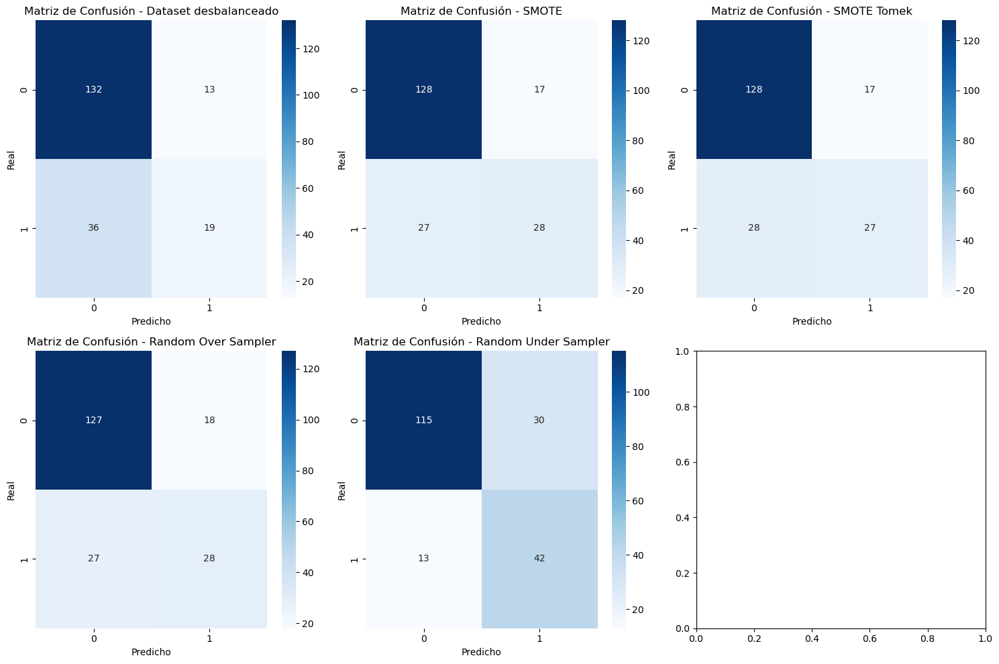

In [141]:
# Grafica de matrices de confusión de Decision Tree

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_dt['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_dt['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

### Validación y rendimiento del modelo en test con RFECV.

In [142]:
# Decision Tree

# Creamos el diccionario vacio de las metricas para almacenar los resultados
results_dt_cv = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': [],
    'Mejores hiperparametros': []
}

Matriz_confusion_dt= {'Dataset':[],
                   'Confusion Matrix':[]}


# Creamos Descision Tree
DT = DecisionTreeClassifier(random_state=42)

# Creamos el selector RFECV
selector = RFECV(estimator=DT, step=1, cv=StratifiedKFold(5), scoring='accuracy')

# Creamos un Pipeline con RFECV y DT
pipeline = Pipeline([
    ('feature_selection', selector),
    ('dt', DT)
])

# Definimos el espacio de hiperparámetros para Decision Tree
param_distributions = {
    'dt__max_depth': [None, 10, 20, 30],
    'dt__min_samples_split': [2, 5, 10],
    'dt__min_samples_leaf': [1, 2, 4],
    'dt__criterion': ['gini', 'entropy'], 
    'dt__splitter': ['best', 'random'] 
}

 # Creamos listas vacias para almacenar los selectores RFECV y los mejores modelos
selected_features = []
best_models = []

# Creamos RandomsearchCV con el pipeline
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_distributions, n_iter=10, cv=StratifiedKFold(5), scoring='accuracy', n_jobs=-1, random_state=42)

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    # Entrenamos el modelo con GridSearchCV
    random_search.fit(X_train, y_train) #entrenamos

    # Guardamos los mejores hiperparámetros y los modelos con los mejores hiperparametros
    best_params = random_search.best_params_
    best_model = random_search.best_estimator_
    best_models.append(best_model) # Guardamos los modelos
    
    # Imprimimos los mejores hiperparámetros y las características seleccionadas
    selector = best_model.named_steps['feature_selection']
    print(f"Mejores hiperparámetros para {dataset_name}: {best_params}") 
    print(" ")
    print(f"Num de características seleccionadas para {dataset_name}: {selector.n_features_}")
    print(" ")
    selected_features_list = X_train.columns[selector.support_].tolist()
    print("Características seleccionadas: ", selected_features_list)
    print("\n" + "=" * 50) 
    # Almacenamos las caracteristicas optimas
    selected_features.append(selected_features_list)

    # Aplicamos a el conjunto de prueba de cada conjunto de datos
    y_pred = best_model.predict(X_test) # predecimos 
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]
    
    # guardamos los resultados de las metricas
    results_dt_cv['Dataset'].append(dataset_name)
    results_dt_cv['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_dt_cv['Precision'].append(precision_score(y_test, y_pred))
    results_dt_cv['Recall'].append(recall_score(y_test, y_pred))
    results_dt_cv['F1-Score'].append(f1_score(y_test, y_pred))
    results_dt_cv['ROC AUC'].append(roc_auc)
    results_dt_cv['Mejores hiperparametros'].append(best_params)
    Matriz_confusion_dt['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_dt['Dataset'].append(dataset_name)

# Imprimimos los resultados de las metricas de cada dataset
results_dtree = pd.DataFrame(results_dt_cv)
display(results_dtree)
print("\n" + "=" * 50)

Mejores hiperparámetros para Dataset desbalanceado: {'dt__splitter': 'random', 'dt__min_samples_split': 10, 'dt__min_samples_leaf': 2, 'dt__max_depth': 30, 'dt__criterion': 'gini'}
 
Num de características seleccionadas para Dataset desbalanceado: 17
 
Características seleccionadas:  ['insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'collision_type_REAR COLLISION', 'incident_severity_MINOR DAMAGE', 'incident_severity_TOTAL LOSS', 'incident_state_SC', 'months_as_customer', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'capital-loss', 'number_of_vehicles_involved', 'witnesses', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']

Mejores hiperparámetros para SMOTE: {'dt__splitter': 'random', 'dt__min_samples_split': 2, 'dt__min_samples_leaf': 1, 'dt__max_depth': 10, 'dt__criterion': 'gini'}
 
Num de características seleccionadas para SMOTE: 11
 
Características seleccionadas:  ['insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'incident_severity_MIN

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros
0,Dataset desbalanceado,0.79,0.68,0.45,0.54,0.82,"{'dt__splitter': 'random', 'dt__min_samples_sp..."
1,SMOTE,0.81,0.62,0.80,0.70,0.82,"{'dt__splitter': 'random', 'dt__min_samples_sp..."
2,SMOTE Tomek,0.83,0.66,0.84,0.74,0.82,"{'dt__splitter': 'random', 'dt__min_samples_sp..."
3,Random Over Sampler,0.76,0.56,0.56,0.56,0.82,"{'dt__splitter': 'best', 'dt__min_samples_spli..."
4,Random Under Sampler,0.84,0.69,0.80,0.74,0.82,"{'dt__splitter': 'random', 'dt__min_samples_sp..."


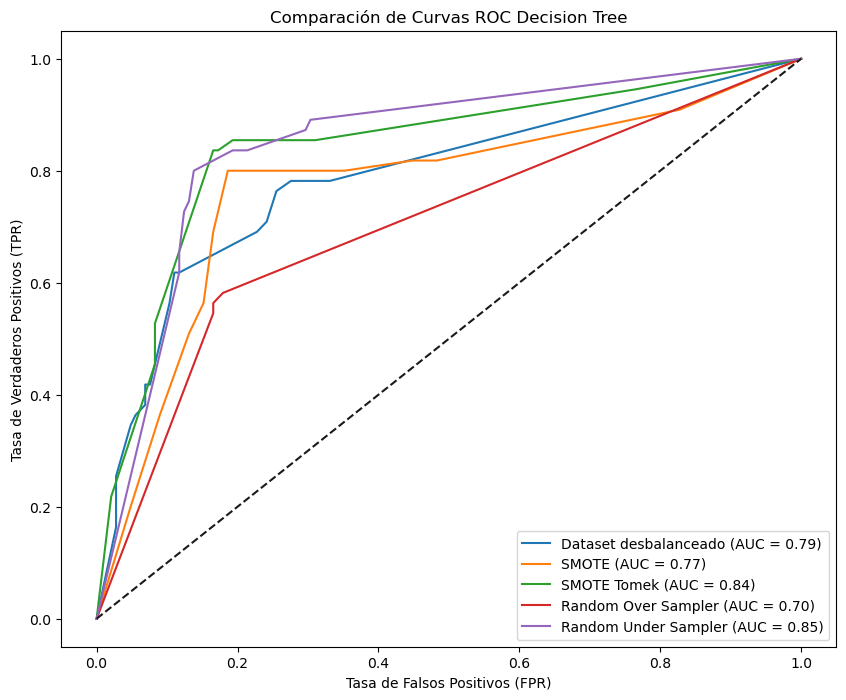

In [143]:
# CURVAS ROC- AUC PARA DT


plt.figure(figsize=(10, 8))
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i]  # El mejor modelo para el i-ésimo conjunto de datos
    
    # Transformamos X_test utilizando el selector RFECV dentro del pipeline
    X_test_selected = best_pipeline.named_steps['feature_selection'].transform(X_test)
    
    # Ahora obtenemos las predicciones de probabilidad del modelo para X_test_selected
    y_pred_proba = best_pipeline.named_steps['dt'].predict_proba(X_test_selected)[:, 1]
    
    # Calculamos la curva ROC y el área bajo la curva (AUC)
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    # Graficamos la curva ROC para el conjunto de datos actual
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal para comparar
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Decision Tree')
plt.legend(loc="lower right")
plt.show()


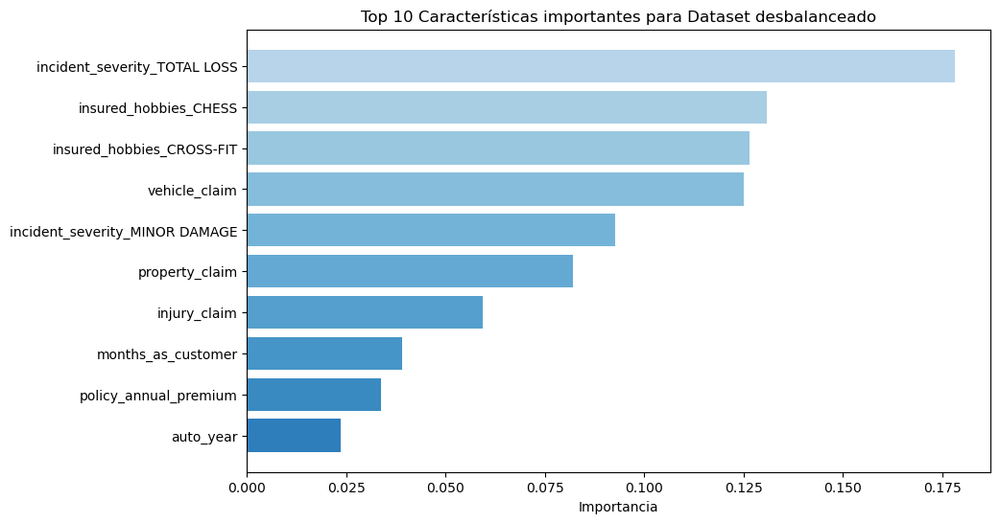

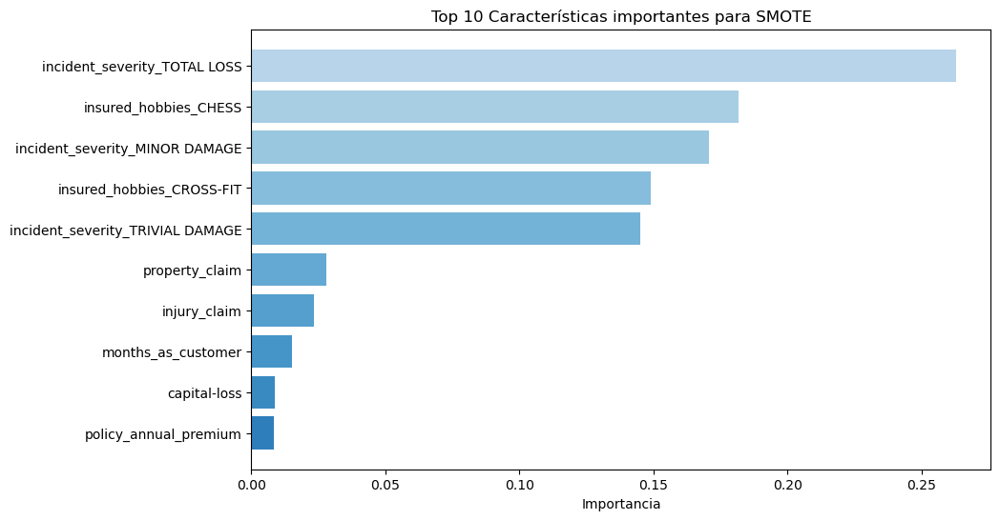

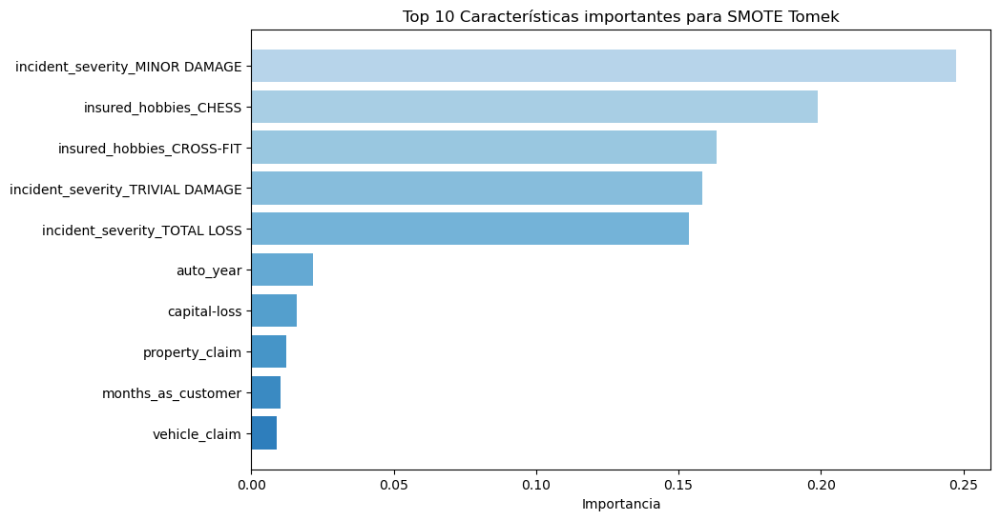

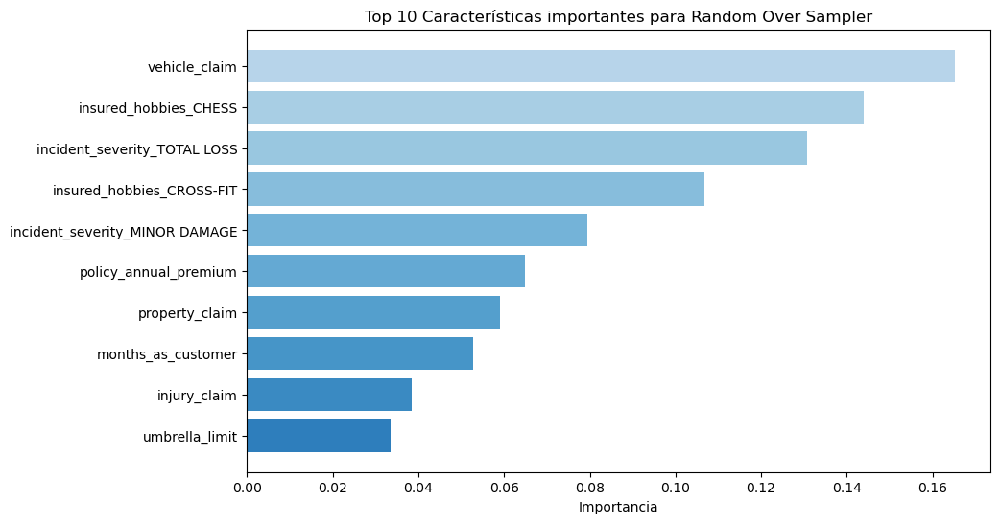

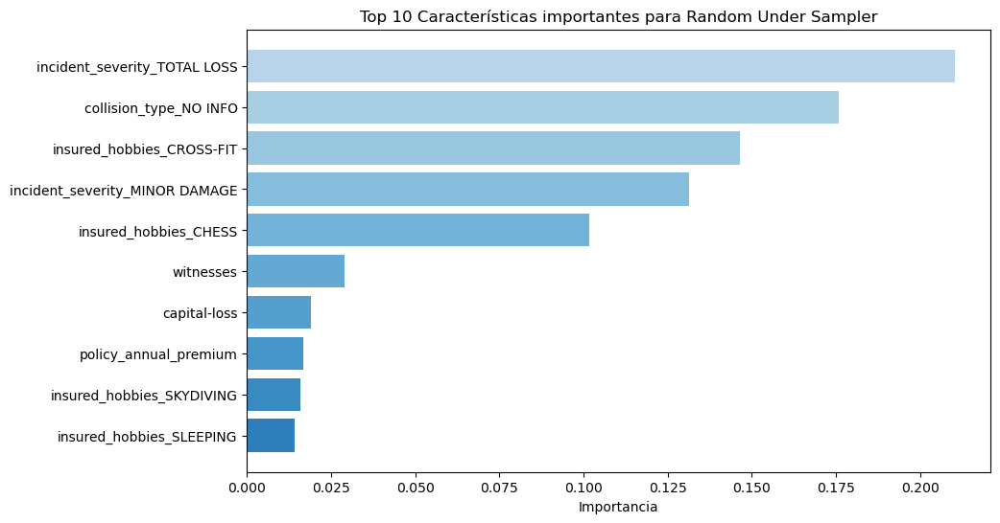

In [144]:
# Graficamos las 10 caracteristicas optimas y su importancia en el dataset

# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i] 
    
    # Obtenemos las importancias de las características del modelo Random Forest
    dt_model = best_pipeline.named_steps['dt']
    importances = dt_model.feature_importances_
    
    # Obtenemos las características seleccionadas por RFECV
    selector = best_pipeline.named_steps['feature_selection']
    selected_columns = X_train.columns[selector.support_]

    # Ordenamos las importancias de mayor a menor
    indices = np.argsort(importances)[::-1]
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Graficamos las importancias
    colors = Blues(np.linspace(0.3, 0.7, top_n))
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), selected_columns[top_indices])
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis()
    plt.show()

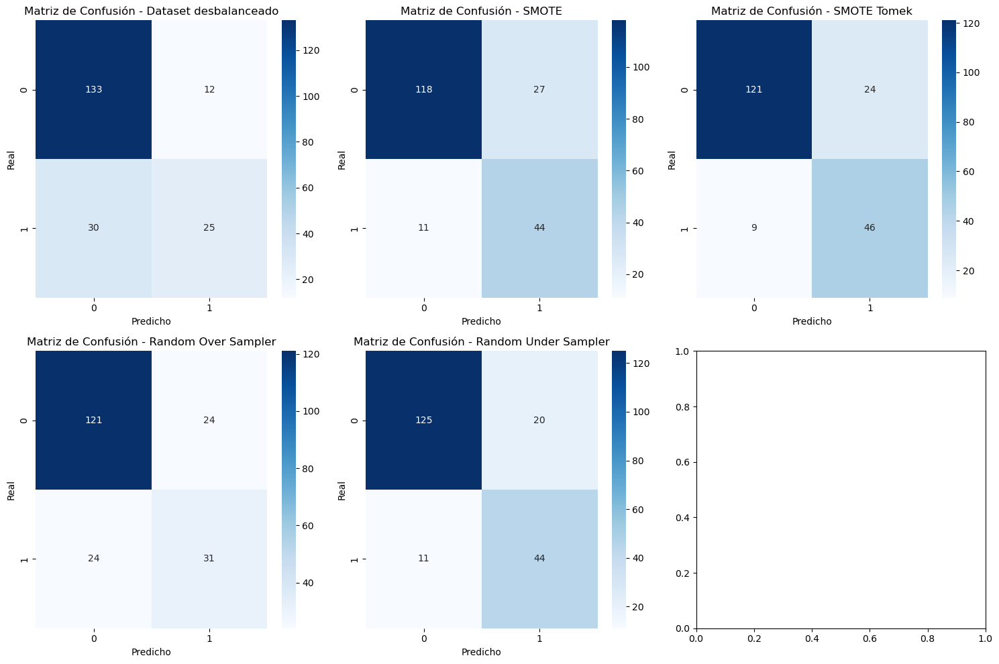

In [145]:
# Grafica de matrices de confusión de Decision Tree

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_dt['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_dt['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

In [146]:
# Mejor modelo de Decision Trees
best_DT = results_dtree[results_dtree['Dataset'] == 'SMOTE Tomek']
best_DT['Model'] = 'DECISION TREE'
best_DT

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros,Model
2,SMOTE Tomek,0.83,0.66,0.84,0.74,0.82,"{'dt__splitter': 'random', 'dt__min_samples_sp...",DECISION TREE


# Gradient Boosting


### Utilización del total de variables

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC
0,Dataset desbalanceado,0.80,0.65,0.56,0.60,0.81
1,SMOTE,0.81,0.64,0.69,0.67,0.83
2,SMOTE Tomek,0.83,0.68,0.71,0.70,0.83
3,Random Over Sampler,0.81,0.63,0.80,0.70,0.82
4,Random Under Sampler,0.82,0.64,0.85,0.73,0.80


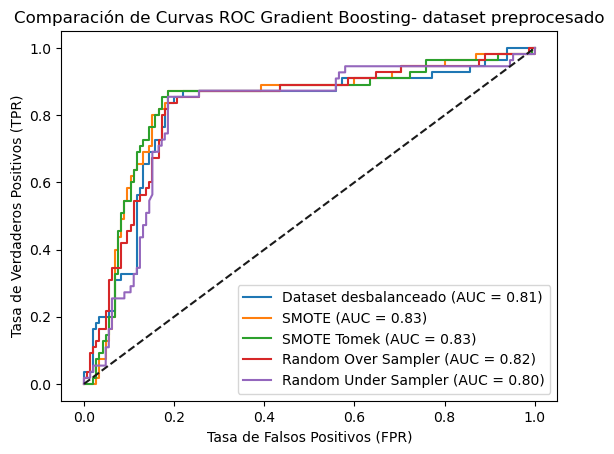

In [147]:
# Creamos el diccionario vacío para almacenar los resultados
results_gb = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': []
}

#Creacion de matrices de confusión

Matriz_confusion_gb= {'Dataset':[],
                   'Confusion Matrix':[]}

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    # Realizamos el entrenamiento del modelo
    model = GradientBoostingClassifier(random_state=42)
    model = model.fit(X_train, y_train)

    # Evaluamos el modelo en el conjunto de prueba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Graficamos la curva ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')
    
    # Almacenamos los resultados de las métricas
    results_gb['Dataset'].append(dataset_name)
    results_gb['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_gb['Precision'].append(precision_score(y_test, y_pred))
    results_gb['Recall'].append(recall_score(y_test, y_pred))
    results_gb['F1-Score'].append(f1_score(y_test, y_pred))
    results_gb['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    Matriz_confusion_gb['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_gb['Dataset'].append(dataset_name)
    
# Imprimimos los resultados de las métricas
results_gb_completo = pd.DataFrame(results_gb)
display(results_gb_completo)

# Graficamos las curvas ROC-AUC
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Gradient Boosting- dataset preprocesado')
plt.legend(loc="lower right")
plt.show()

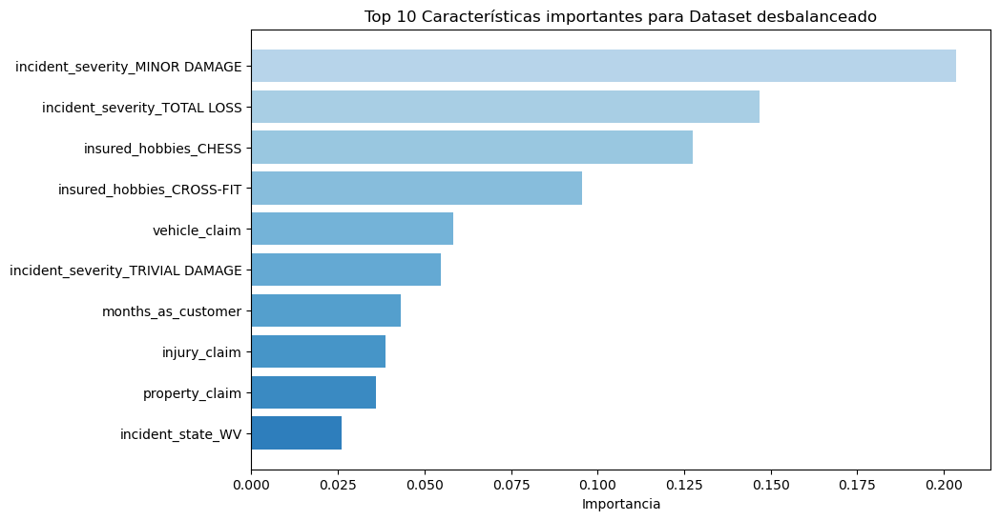

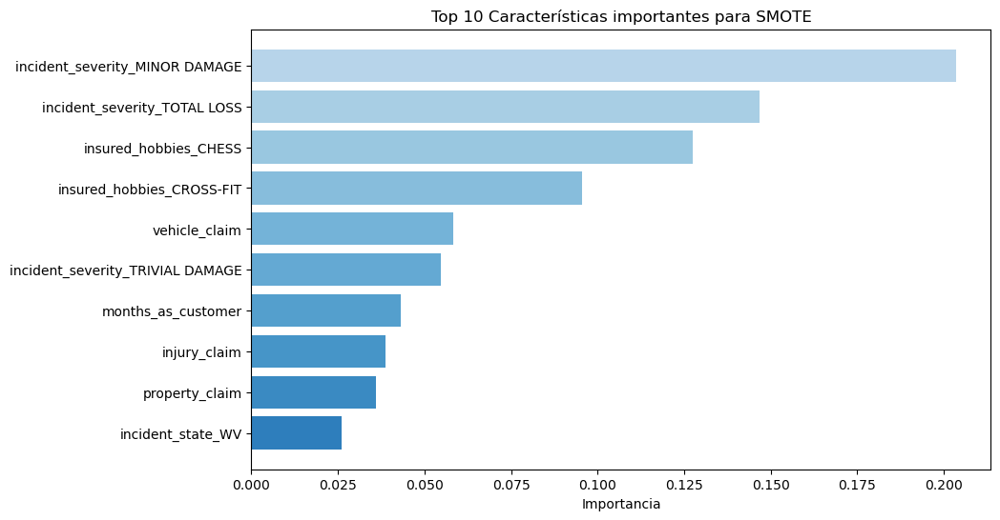

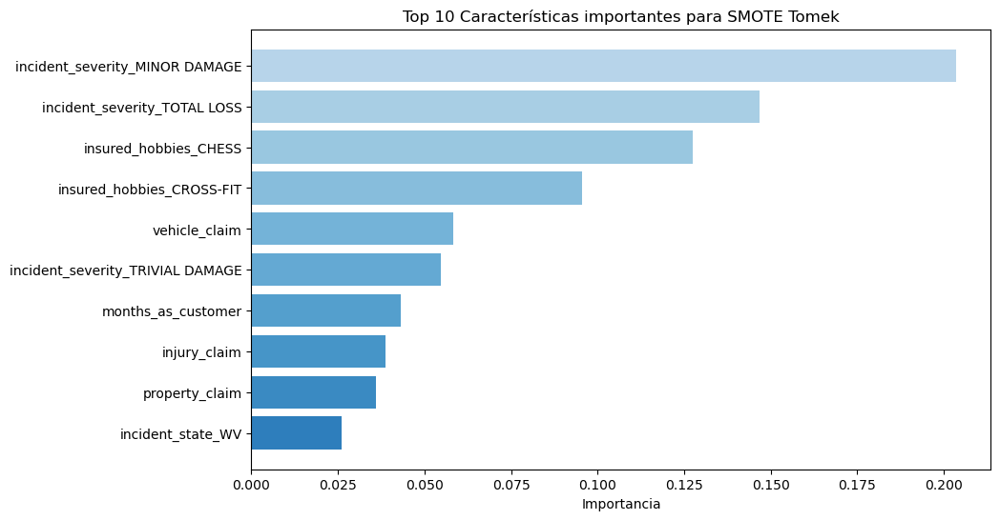

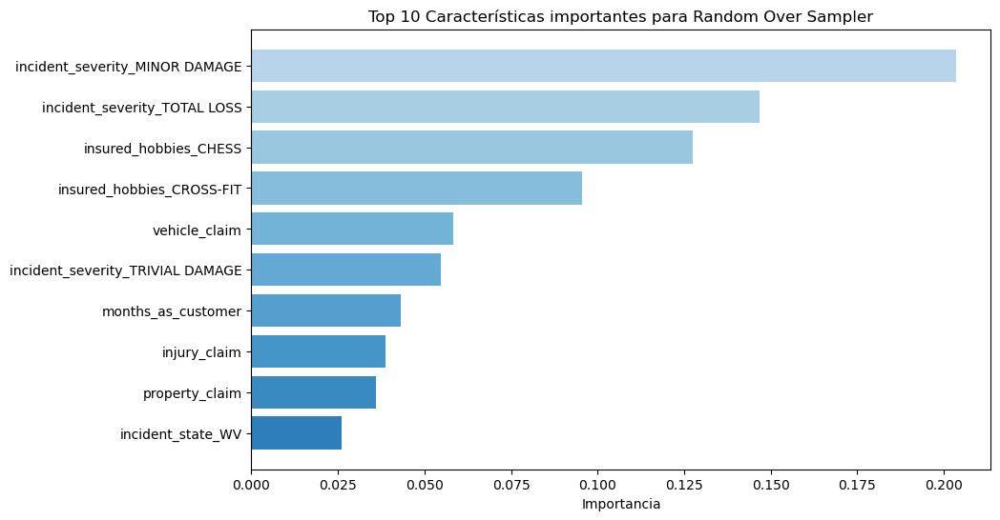

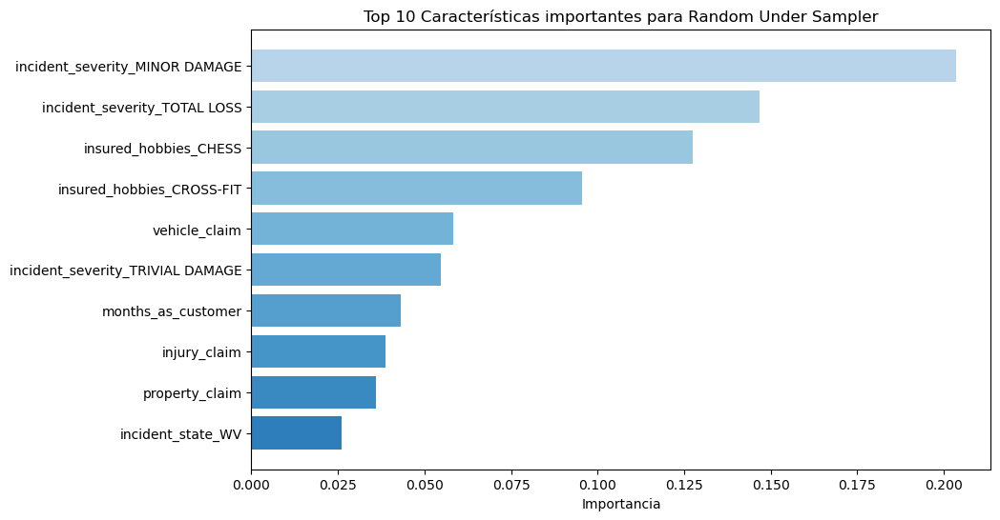

In [148]:
# Gráfica de selección de características más importantes en Gradient Boosting
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    importances = model.feature_importances_  # Sacamos la importancia de las variables
    
    # Obtenemos los índices de las características ordenados por importancia
    indices = np.argsort(importances)[::-1]

    # Ajustamos top_n al número de características en el modelo actual si es menor que 10 en caso de que exista
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Definimos una paleta de colores azules para la gráfica
    colors = Blues(np.linspace(0.3, 0.7, top_n))

    # Graficamos
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), X_train.columns[top_indices])  
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis() 
    plt.show()

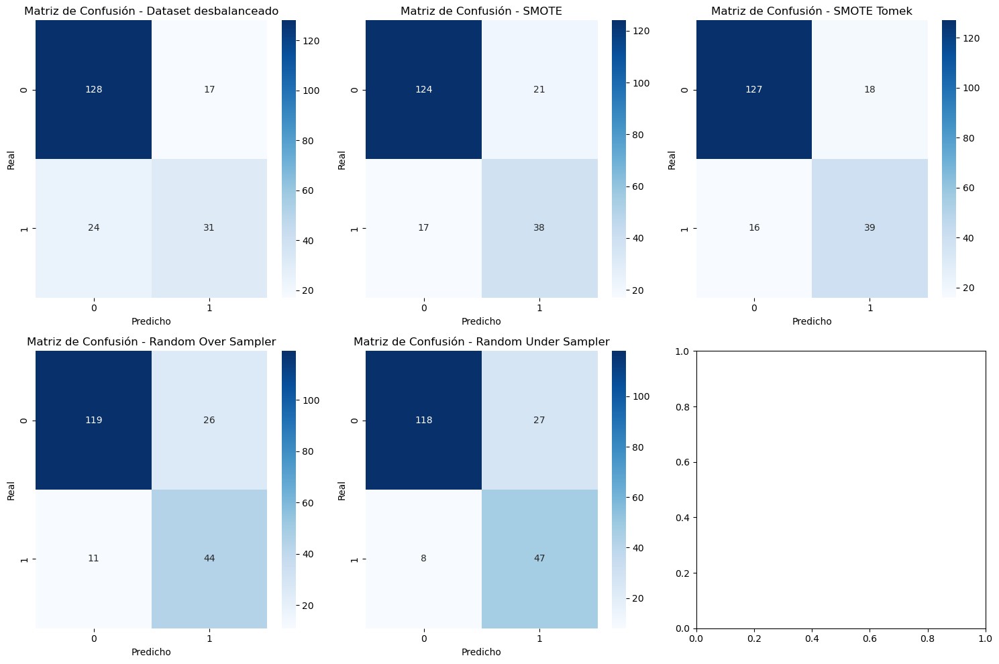

In [149]:
# Grafica de matrices de confusión de Gradient Boosting

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_gb['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_gb['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

## Validación y rendimiento del modelo- Gradient Boosting - RFECV

In [150]:
# Gradient Boosting

# Creamos el diccionario vacio de las metricas para almacenar los resultados
results_gb_cv = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': [],
    'Mejores hiperparametros': []
}

Matriz_confusion_gb= {'Dataset':[],
                   'Confusion Matrix':[]}


# Creamos Descision Tree
GB = GradientBoostingClassifier(random_state=42)

# Creamos el selector RFECV
selector = RFECV(estimator=GB, step=1, cv=StratifiedKFold(5), scoring='accuracy')

# Creamos un Pipeline con RFECV y RF
pipeline = Pipeline([
    ('feature_selection', selector),
    ('gb', GB)
])

# Definimos los estimadores para la busqueda de hiperparámetros para Gradient Boosting
param_distributions = {
    'gb__n_estimators': [100, 200, 300], 
    'gb__learning_rate': [0.01, 0.1, 0.2], 
    'gb__max_depth': [3, 5, 7],           
    'gb__min_samples_split': [2, 4],      
    'gb__min_samples_leaf': [1, 2],      
    'gb__max_features': ['sqrt', 'log2'], 
    'gb__subsample': [0.8, 0.9, 1.0]       
}

 # Creamos listas vacias para almacenar los selectores RFECV y los mejores modelos
selected_features = []
best_models = []

# Creamos RandomsearchCV con el pipeline
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_distributions, n_iter=10, cv=StratifiedKFold(5), scoring='accuracy', n_jobs=-1, random_state=42)

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test,dataset_name in datasets:
    # Entrenamos el modelo con GridSearchCV
    random_search.fit(X_train, y_train) #entrenamos

    # Guardamos los mejores hiperparámetros y los modelos con los mejores hiperparametros
    best_params = random_search.best_params_
    best_model = random_search.best_estimator_
    best_models.append(best_model) # Guardamos los modelos
    
    # Imprimimos los mejores hiperparámetros y las características seleccionadas
    selector = best_model.named_steps['feature_selection']
    print(f"Mejores hiperparámetros para {dataset_name}: {best_params}") 
    print(" ")
    print(f"Num de características seleccionadas para {dataset_name}: {selector.n_features_}")
    print(" ")
    selected_features_list = X_train.columns[selector.support_].tolist()
    print("Características seleccionadas: ", selected_features_list)
    print("\n" + "=" * 50) 
    # Almacenamos las caracteristicas optimas
    selected_features.append(selected_features_list)

    # Aplicamos a el conjunto de prueba de cada conjunto de datos
    y_pred = best_model.predict(X_test) # predecimos 
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]    

    # Guardamos los resultados
    results_gb_cv['Dataset'].append(dataset_name)
    results_gb_cv['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_gb_cv['Precision'].append(precision_score(y_test, y_pred))
    results_gb_cv['Recall'].append(recall_score(y_test, y_pred))
    results_gb_cv['F1-Score'].append(f1_score(y_test, y_pred))
    results_gb_cv['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    results_gb_cv['Mejores hiperparametros'].append(best_params)
    Matriz_confusion_gb['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_gb['Dataset'].append(dataset_name)

# Imprimimos las metricas
results_GB = pd.DataFrame(results_gb_cv)
display(results_GB)


Mejores hiperparámetros para Dataset desbalanceado: {'gb__subsample': 0.8, 'gb__n_estimators': 300, 'gb__min_samples_split': 4, 'gb__min_samples_leaf': 1, 'gb__max_features': 'sqrt', 'gb__max_depth': 3, 'gb__learning_rate': 0.1}
 
Num de características seleccionadas para Dataset desbalanceado: 27
 
Características seleccionadas:  ['insured_hobbies_CAMPING', 'insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'insured_hobbies_GOLF', 'insured_hobbies_SKYDIVING', 'insured_hobbies_YACHTING', 'incident_type_SINGLE VEHICLE COLLISION', 'collision_type_SIDE COLLISION', 'incident_severity_MINOR DAMAGE', 'incident_severity_TOTAL LOSS', 'incident_severity_TRIVIAL DAMAGE', 'authorities_contacted_FIRE', 'authorities_contacted_OTHER', 'incident_state_NY', 'incident_state_SC', 'incident_state_WV', 'property_damage_NO INFO', 'months_as_customer', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'witnesses', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']



,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros
0,Dataset desbalanceado,0.78,0.63,0.47,0.54,0.83,"{'gb__subsample': 0.8, 'gb__n_estimators': 300..."
1,SMOTE,0.83,0.64,0.85,0.73,0.85,"{'gb__subsample': 0.8, 'gb__n_estimators': 100..."
2,SMOTE Tomek,0.83,0.64,0.85,0.73,0.84,"{'gb__subsample': 0.8, 'gb__n_estimators': 100..."
3,Random Over Sampler,0.79,0.62,0.56,0.59,0.83,"{'gb__subsample': 1.0, 'gb__n_estimators': 200..."
4,Random Under Sampler,0.80,0.61,0.76,0.68,0.82,"{'gb__subsample': 0.8, 'gb__n_estimators': 100..."


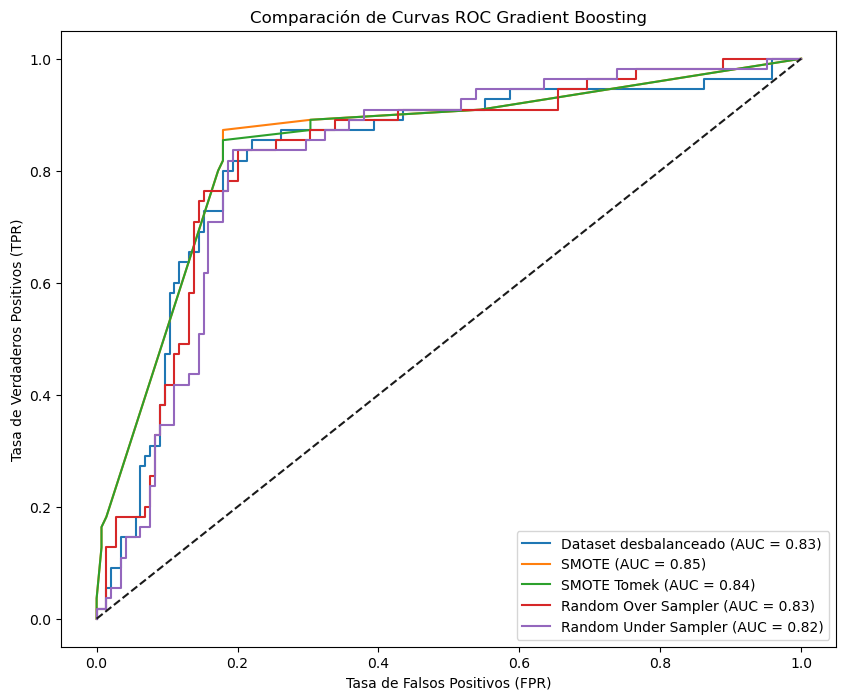

In [151]:
# CURVAS ROC- AUC PARA GB

plt.figure(figsize=(10, 8))
for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i]  # El mejor modelo para el i-ésimo conjunto de datos
    
    # Transformamos X_test utilizando el selector RFECV dentro del pipeline
    X_test_selected = best_pipeline.named_steps['feature_selection'].transform(X_test)
    
    # Ahora obtenemos las predicciones de probabilidad del modelo para X_test_selected
    y_pred_proba = best_pipeline.named_steps['gb'].predict_proba(X_test_selected)[:, 1]
    
    # Calculamos la curva ROC y el área bajo la curva (AUC)
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    # Graficamos la curva ROC para el conjunto de datos actual
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal para comparar
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Gradient Boosting')
plt.legend(loc="lower right")
plt.show()


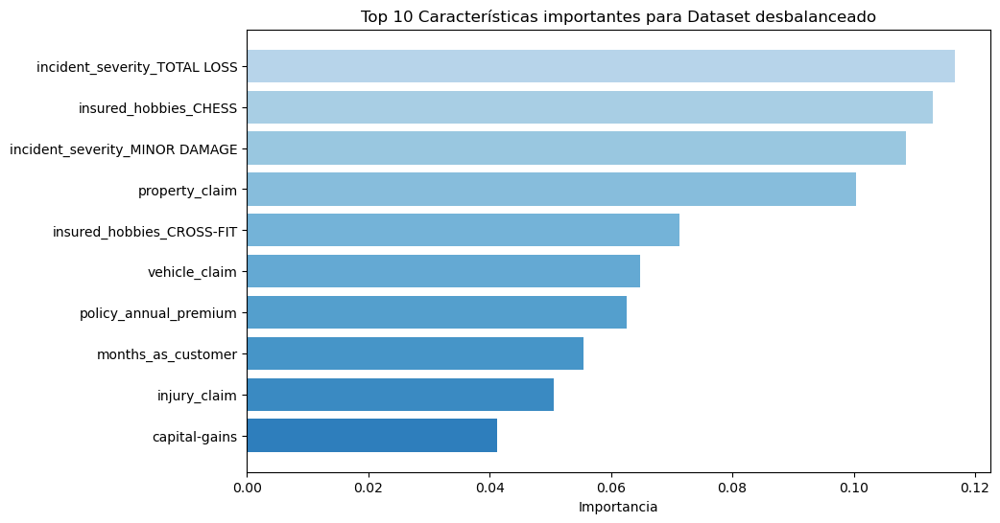

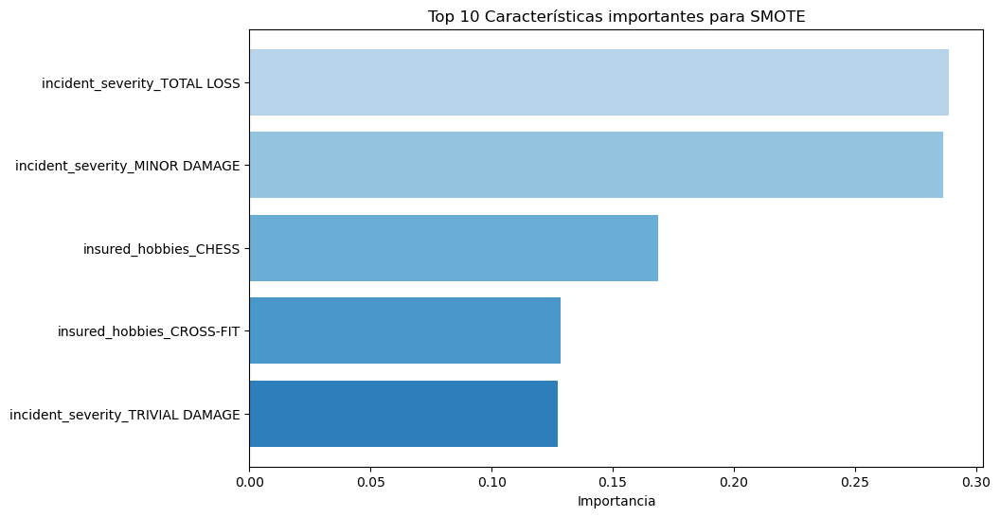

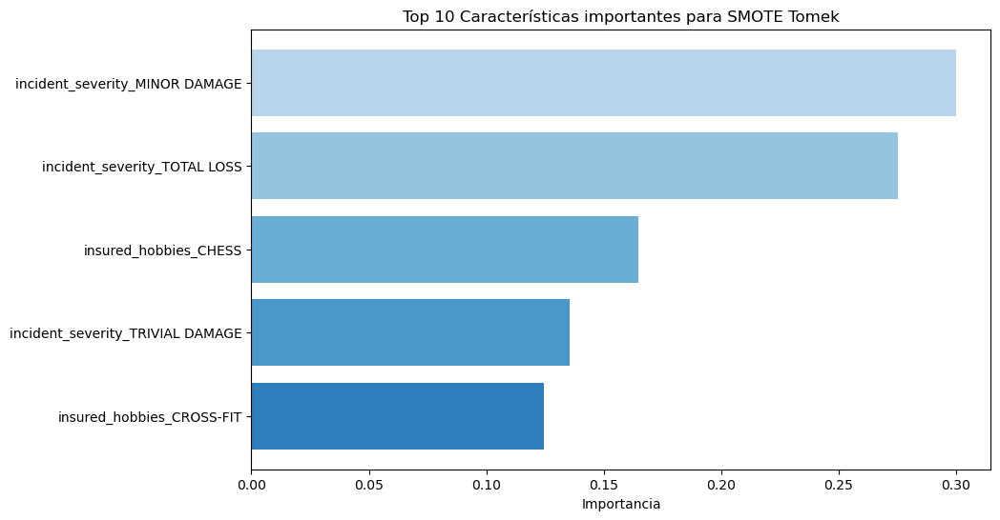

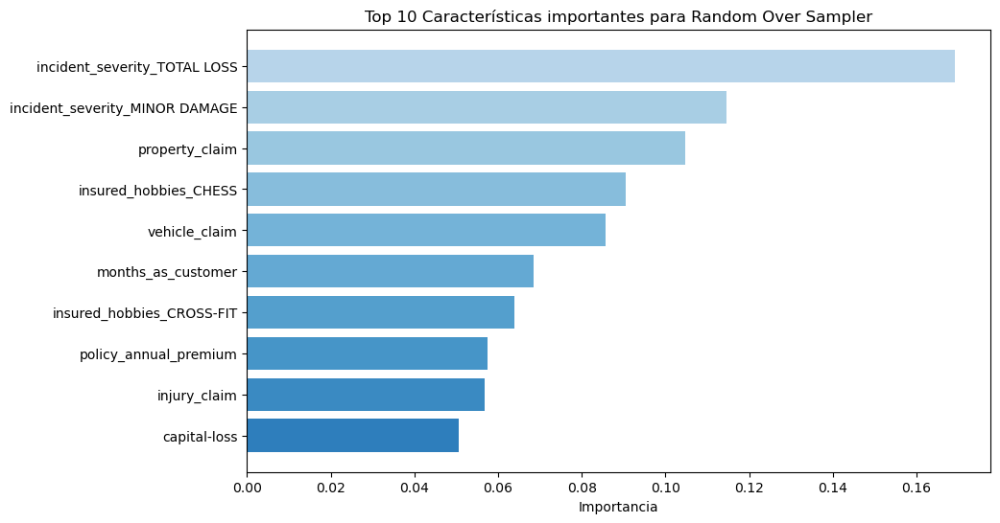

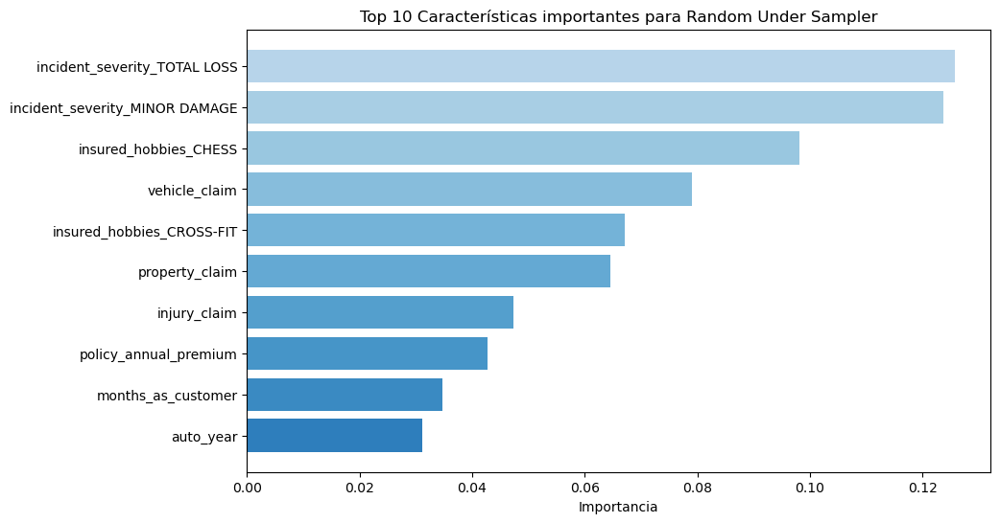

In [152]:
# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test,dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i] 
    
    # Obtenemos las importancias de las características del modelo Gradient Boosting
    gb_model = best_pipeline.named_steps['gb']
    importances = gb_model.feature_importances_
    
    # Obtenemos las características seleccionadas por RFECV
    selector = best_pipeline.named_steps['feature_selection']
    selected_columns = X_train.columns[selector.support_]

    # Ordenamos las importancias de mayor a menor
    indices = np.argsort(importances)[::-1]
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Graficamos las importancias
    colors = Blues(np.linspace(0.3, 0.7, top_n))
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), selected_columns[top_indices])
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis()
    plt.show()

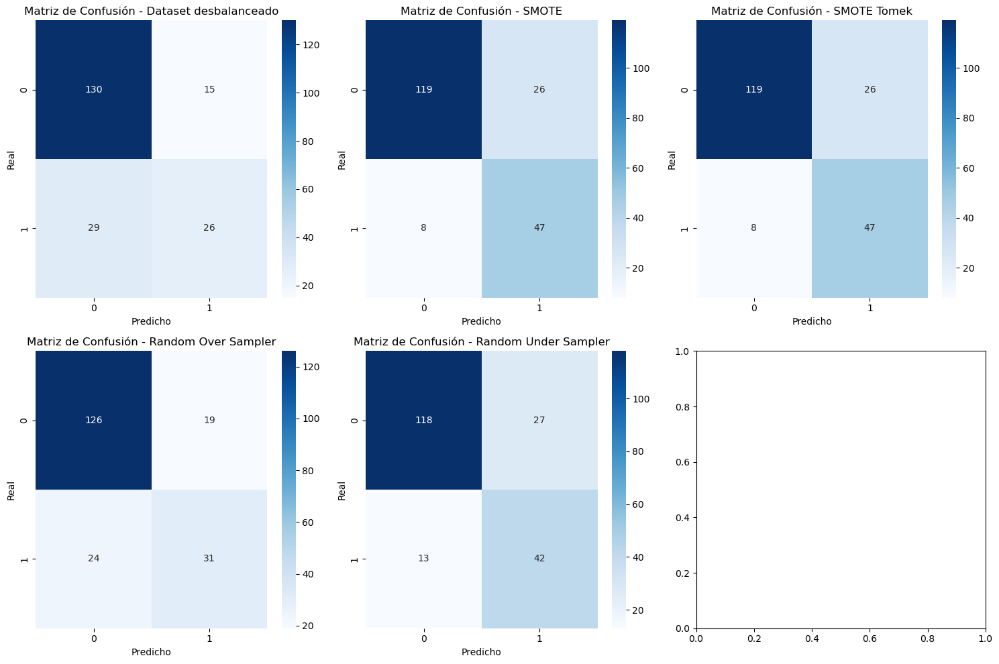

In [153]:
# Grafica de matrices de Confusion

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_gb['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_gb['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

In [166]:
# Mejor modelo de Gradient Boosting
best_GB = results_GB[results_GB['Dataset'] == 'SMOTE']
best_GB['Model'] = 'GRADIENT BOOSTING'
best_GB

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros,Modelo,Model
1,SMOTE,0.83,0.64,0.85,0.73,0.85,"{'gb__subsample': 0.8, 'gb__n_estimators': 100...",Gradient Boost,GRADIENT BOOSTING


# Ada Boost Classifier

Realizaremos el Ada Boost Classifier con decisin tree.

### Utilizacion de todas las variables

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC
0,Dataset desbalanceado,0.76,0.56,0.51,0.53,0.68
1,SMOTE,0.76,0.57,0.49,0.53,0.68
2,SMOTE Tomek,0.76,0.57,0.55,0.56,0.69
3,Random Over Sampler,0.80,0.64,0.62,0.63,0.74
4,Random Under Sampler,0.79,0.58,0.76,0.66,0.78


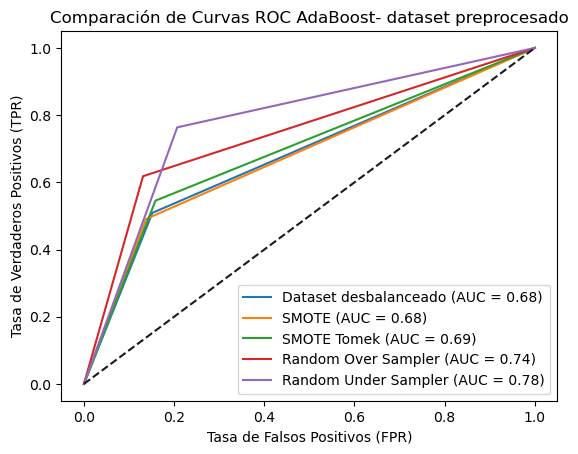

In [155]:
# Creamos el diccionario vacío para almacenar los resultados
results_ada = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],      
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': []
}

Matriz_confusion_ada= {'Dataset':[],
                   'Confusion Matrix':[]}

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    # Realizamos el entrenamiento del modelo con DecisionTreeClassifier como base
    base_estimator = DecisionTreeClassifier(random_state=42)

    # Configuramos el AdaBoostClassifier con el clasificador base
    model = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)
    model = model.fit(X_train, y_train)

    # Evaluamos el modelo en el conjunto de prueba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Graficamos la curva ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

  
    # Almacenamos los resultados de las métricas
    results_ada['Dataset'].append(dataset_name)
    results_ada['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_ada['Precision'].append(precision_score(y_test, y_pred))
    results_ada['Recall'].append(recall_score(y_test, y_pred))
    results_ada['F1-Score'].append(f1_score(y_test, y_pred))
    results_ada['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    Matriz_confusion_ada['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_ada['Dataset'].append(dataset_name)
    
# Imprimimos los resultados de las métricas
results_ada_completo = pd.DataFrame(results_ada)
display(results_ada_completo)

# Graficamos las curvas ROC-AUC
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC AdaBoost- dataset preprocesado')
plt.legend(loc="lower right")
plt.show()

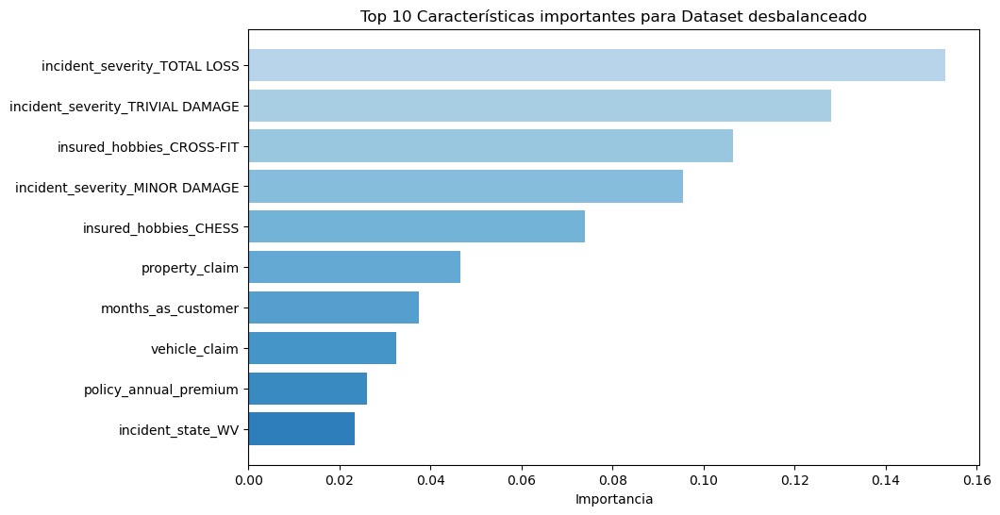

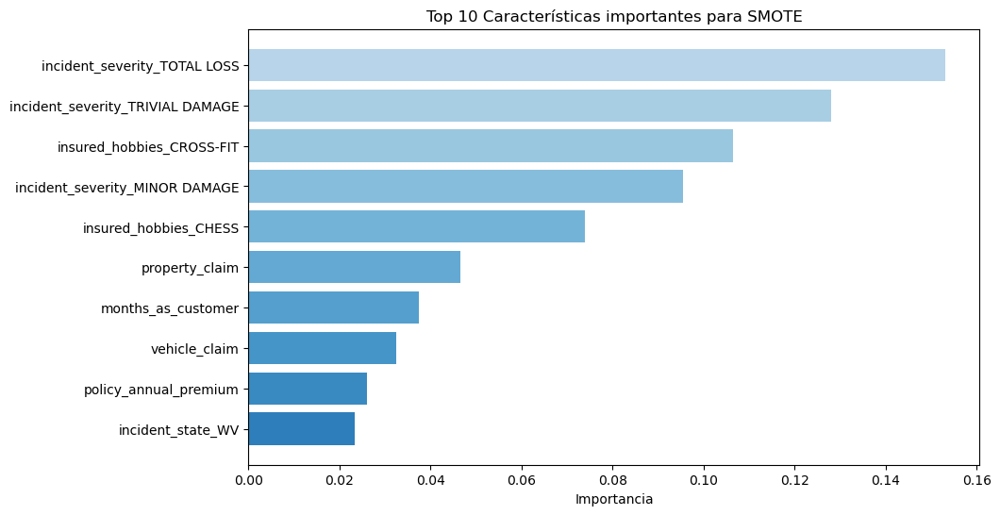

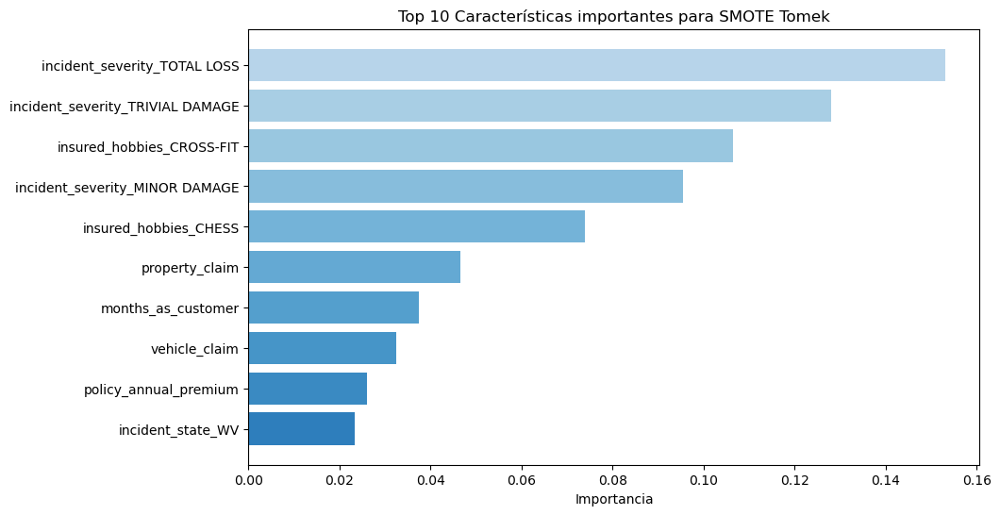

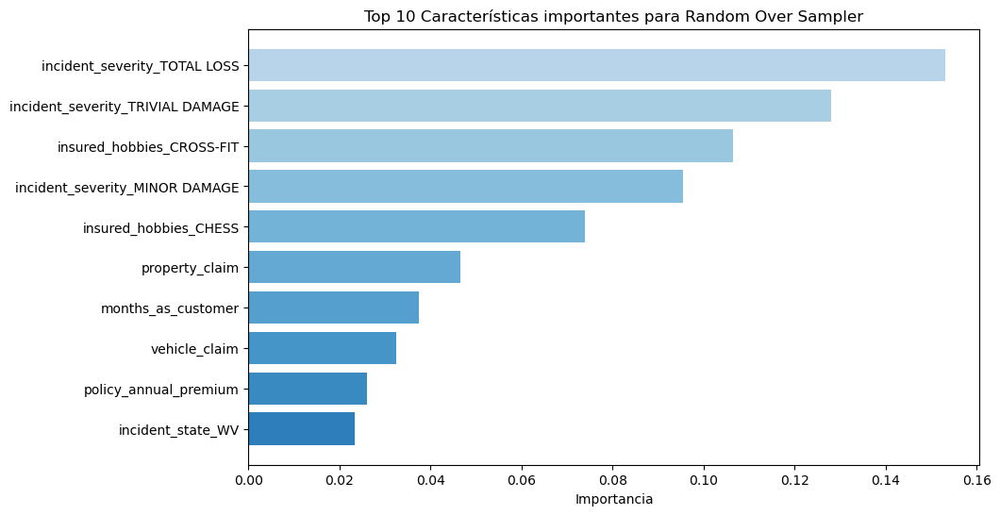

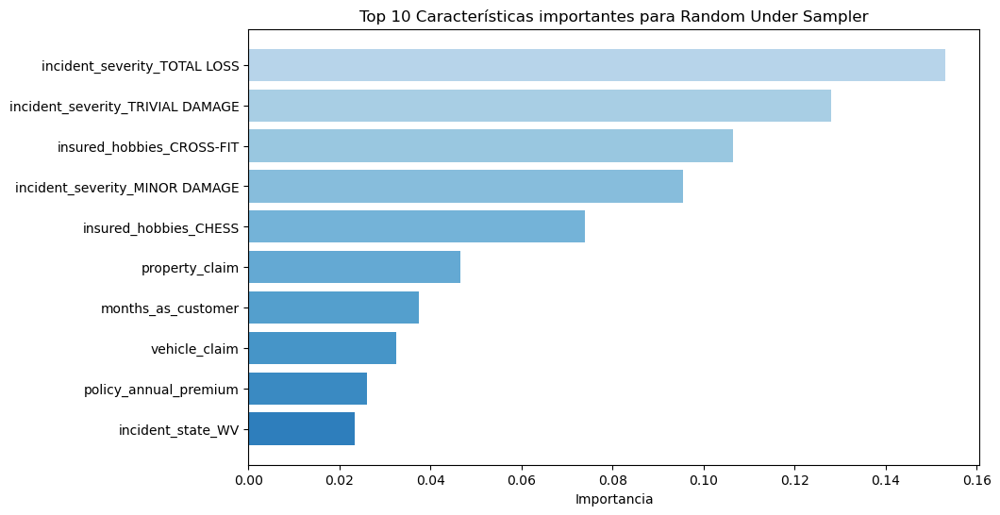

In [156]:
# Gráfica de selección de características más importantes en Ada Boost

# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test,dataset_name) in enumerate(datasets):
    importances = model.feature_importances_  # Sacamos la importancia de las variables
    
    # Obtenemos los índices de las características ordenados por importancia
    indices = np.argsort(importances)[::-1]

    # Ajustamos top_n al número de características en el modelo actual si es menor que 10 en caso de que exista
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Definimos una paleta de colores azules para la gráfica
    colors = Blues(np.linspace(0.3, 0.7, top_n))

    # Graficamos
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), X_train.columns[top_indices])  
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis() 
    plt.show()

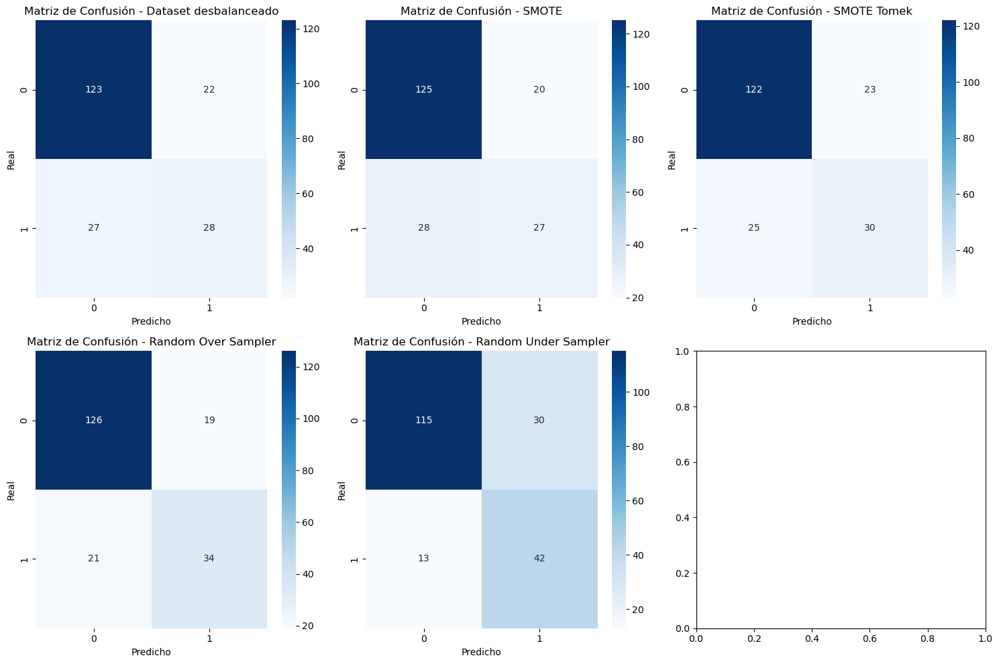

In [157]:
# Grafica de matrices de confusión de Ada Boost

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_ada['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_ada['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

## Validación y evaluación del modelo de Ada Boosting con caracteristicas relevantes

Es importante recordar que la seleccion de variables se hizo con DecisionTreeClassifier 

In [158]:
# Ada Boost

# Creamos el diccionario vacio para almacenar los resultados de las metricas de rendimiento
results_adaboost_cv = {
    'Dataset': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'ROC AUC': [],
    'Mejores hiperparametros': []
}

Matriz_confusion_ada= {'Dataset':[],
                   'Confusion Matrix':[]}

# Definimos un clasificador base para AdaBoost
base_estimator = DecisionTreeClassifier(random_state=42)

# Configuramos el AdaBoostClassifier con el clasificador base
ADA = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

# Creamos el selector RFECV
selector = RFECV(estimator=ADA, step=1, cv=StratifiedKFold(5), scoring='accuracy')

# Creamos un Pipeline con RFECV y RF
pipeline = Pipeline([
    ('feature_selection', selector),
    ('ada', ADA)
])

# Definimos el conjunto de busqueda de los hiperparámetros para AdaBoost con un DecisionTreeClassifier como base_estimator
param_distributions = {
    "ada__base_estimator__max_depth": [1, 2, 3],
    "ada__base_estimator__criterion" : ["gini", "entropy"],
    "ada__n_estimators": [50, 100],
    "ada__learning_rate": [0.1, 1.0],
    "ada__algorithm": ["SAMME", "SAMME.R"]
}

 # Creamos listas vacias para almacenar los selectores RFECV y los mejores modelos
selected_features = []
best_models = []

# Creamos RandomsearchCV con el pipeline
random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_distributions, n_iter=10, cv=StratifiedKFold(5), scoring='accuracy', n_jobs=-1, random_state=42)

# Iteramos sobre cada conjunto de datos
for X_train, y_train, X_test, y_test, dataset_name in datasets:
    # Entrenamos el modelo con GridSearchCV
    random_search.fit(X_train, y_train) #entrenamos

    # Guardamos los mejores hiperparámetros y los modelos con los mejores hiperparametros
    best_params = random_search.best_params_
    best_model = random_search.best_estimator_
    best_models.append(best_model) # Guardamos los modelos
    
    # Imprimimos los mejores hiperparámetros y las características seleccionadas
    selector = best_model.named_steps['feature_selection']
    print(f"Mejores hiperparámetros para {dataset_name}: {best_params}") 
    print(" ")
    print(f"Num de características seleccionadas para {dataset_name}: {selector.n_features_}")
    print(" ")
    selected_features_list = X_train.columns[selector.support_].tolist()
    print("Características seleccionadas: ", selected_features_list)
    print("\n" + "=" * 50) 
    # Almacenamos las caracteristicas optimas
    selected_features.append(selected_features_list)

    # Aplicamos a el conjunto de prueba de cada conjunto de datos
    y_pred = best_model.predict(X_test) # predecimos 
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]    

    # Guardamos las metricas de rendimiento
    results_adaboost_cv['Dataset'].append(dataset_name)
    results_adaboost_cv['Accuracy'].append(accuracy_score(y_test, y_pred))
    results_adaboost_cv['Precision'].append(precision_score(y_test, y_pred))
    results_adaboost_cv['Recall'].append(recall_score(y_test, y_pred))
    results_adaboost_cv['F1-Score'].append(f1_score(y_test, y_pred))
    results_adaboost_cv['ROC AUC'].append(roc_auc_score(y_test, y_pred_proba))
    results_adaboost_cv['Mejores hiperparametros'].append(best_params)
    Matriz_confusion_ada['Confusion Matrix'].append(confusion_matrix(y_test, y_pred)) #añadimos los datos para las matrices
    Matriz_confusion_ada['Dataset'].append(dataset_name)

# Visualizamos
results_ada = pd.DataFrame(results_adaboost_cv)
display(results_ada)


Mejores hiperparámetros para Dataset desbalanceado: {'ada__n_estimators': 100, 'ada__learning_rate': 1.0, 'ada__base_estimator__max_depth': 2, 'ada__base_estimator__criterion': 'entropy', 'ada__algorithm': 'SAMME'}
 
Num de características seleccionadas para Dataset desbalanceado: 20
 
Características seleccionadas:  ['insured_hobbies_CHESS', 'insured_hobbies_CROSS-FIT', 'insured_hobbies_SKYDIVING', 'collision_type_NO INFO', 'collision_type_REAR COLLISION', 'incident_severity_MINOR DAMAGE', 'incident_severity_TOTAL LOSS', 'incident_state_PA', 'incident_state_SC', 'months_as_customer', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'number_of_vehicles_involved', 'witnesses', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']

Mejores hiperparámetros para SMOTE: {'ada__n_estimators': 50, 'ada__learning_rate': 0.1, 'ada__base_estimator__max_depth': 2, 'ada__base_estimator__criterion': 'gini', 'ada__algorithm': 'SAMME'}
 
Num de características sel

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros
0,Dataset desbalanceado,0.78,0.62,0.45,0.53,0.83,"{'ada__n_estimators': 100, 'ada__learning_rate..."
1,SMOTE,0.82,0.64,0.82,0.72,0.84,"{'ada__n_estimators': 50, 'ada__learning_rate'..."
2,SMOTE Tomek,0.83,0.65,0.84,0.73,0.83,"{'ada__n_estimators': 50, 'ada__learning_rate'..."
3,Random Over Sampler,0.75,0.56,0.45,0.50,0.68,"{'ada__n_estimators': 100, 'ada__learning_rate..."
4,Random Under Sampler,0.83,0.65,0.87,0.74,0.87,"{'ada__n_estimators': 50, 'ada__learning_rate'..."


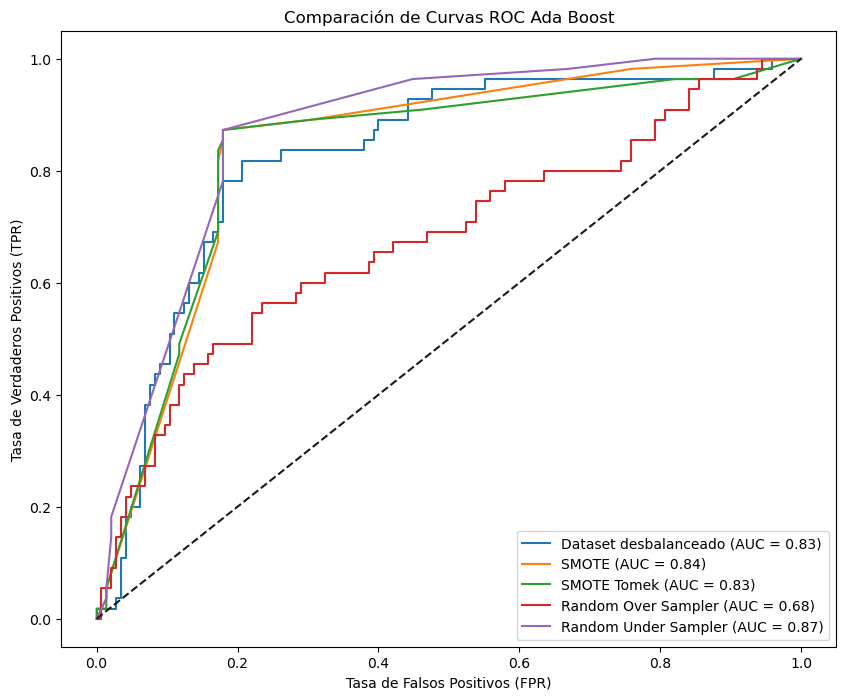

In [159]:
plt.figure(figsize=(10, 8))


for i, (X_train, y_train, X_test, y_test, dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i]  # El mejor modelo para el i-ésimo conjunto de datos
    
    # Transformamos X_test utilizando el selector RFECV dentro del pipeline
    X_test_selected = best_pipeline.named_steps['feature_selection'].transform(X_test)
    
    # Ahora obtenemos las predicciones de probabilidad del modelo para X_test_selected
    y_pred_proba = best_pipeline.named_steps['ada'].predict_proba(X_test_selected)[:, 1]
    
    # Calculamos la curva ROC y el área bajo la curva (AUC)
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    # Graficamos la curva ROC para el conjunto de datos actual
    plt.plot(fpr, tpr, label=f'{dataset_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal para comparar
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparación de Curvas ROC Ada Boost')
plt.legend(loc="lower right")
plt.show()


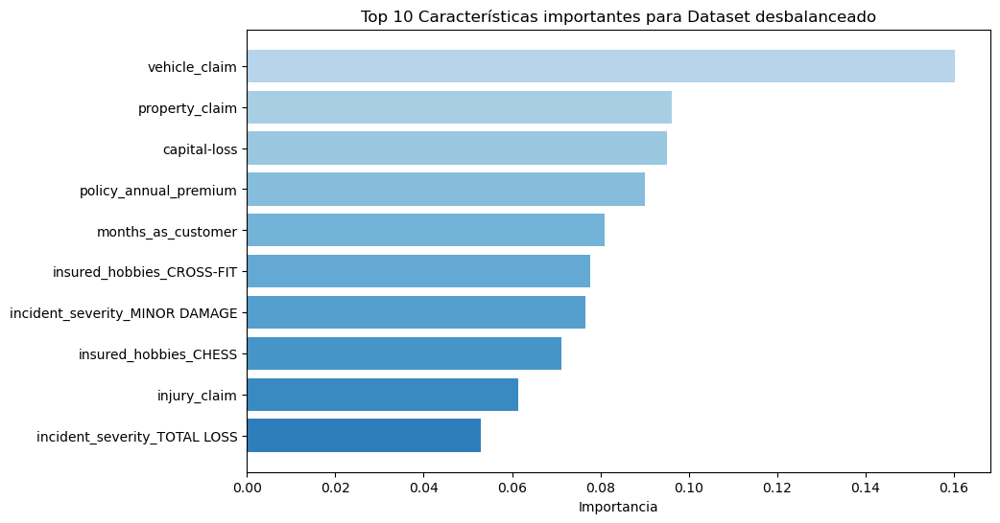

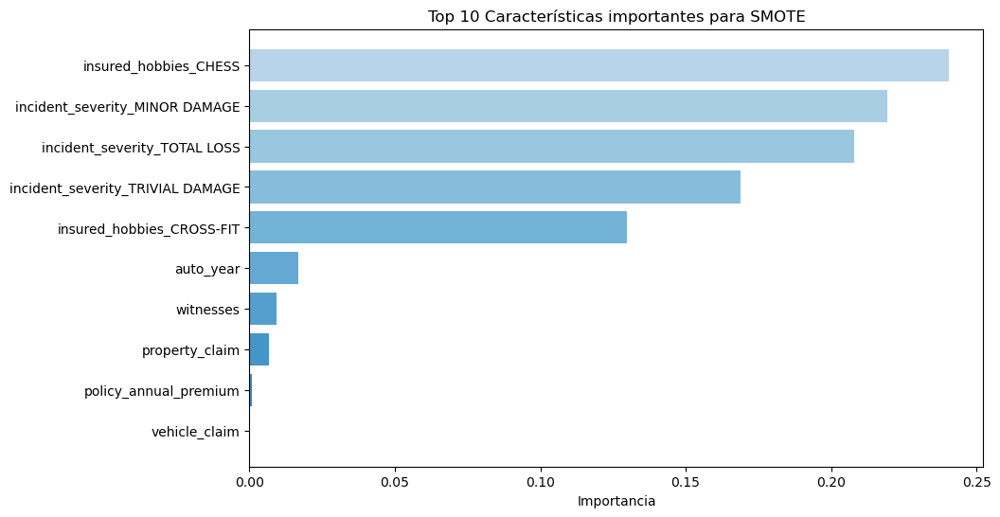

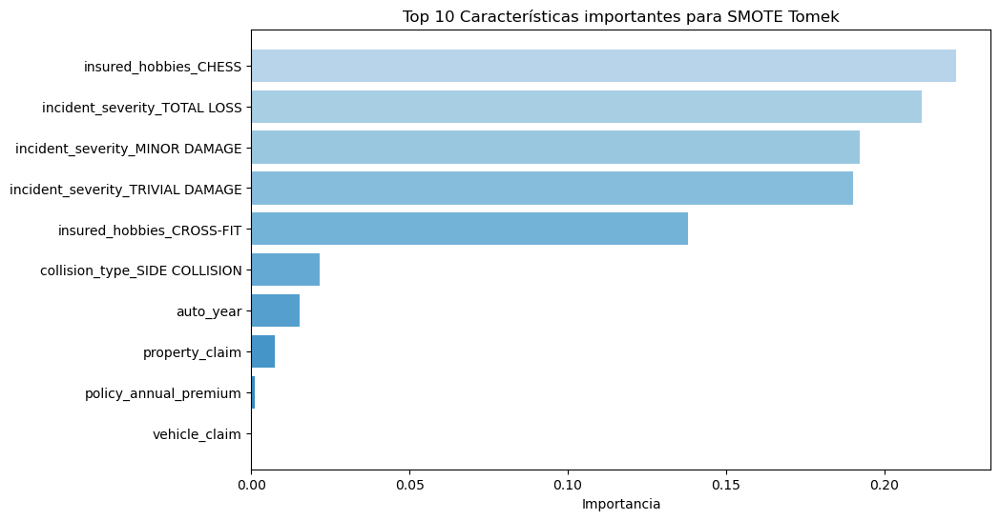

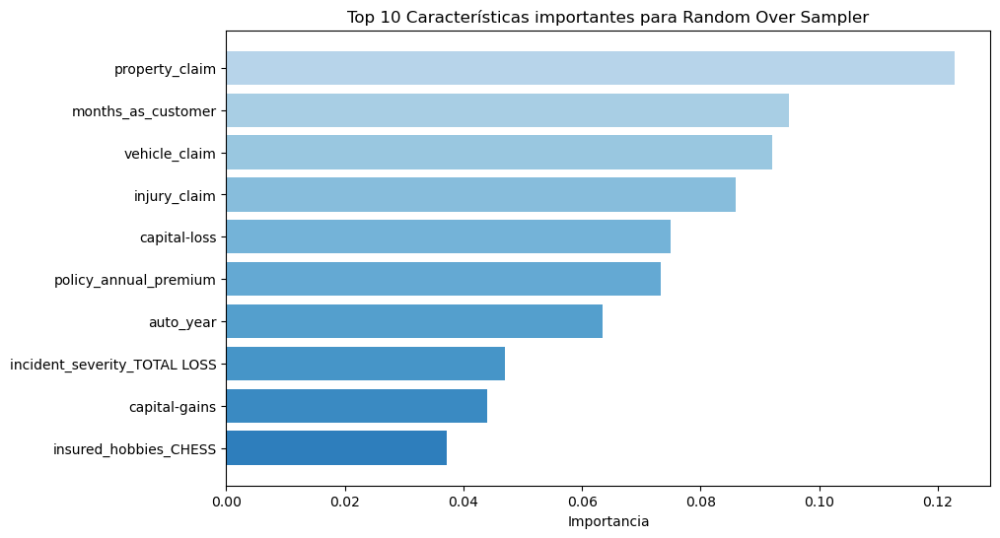

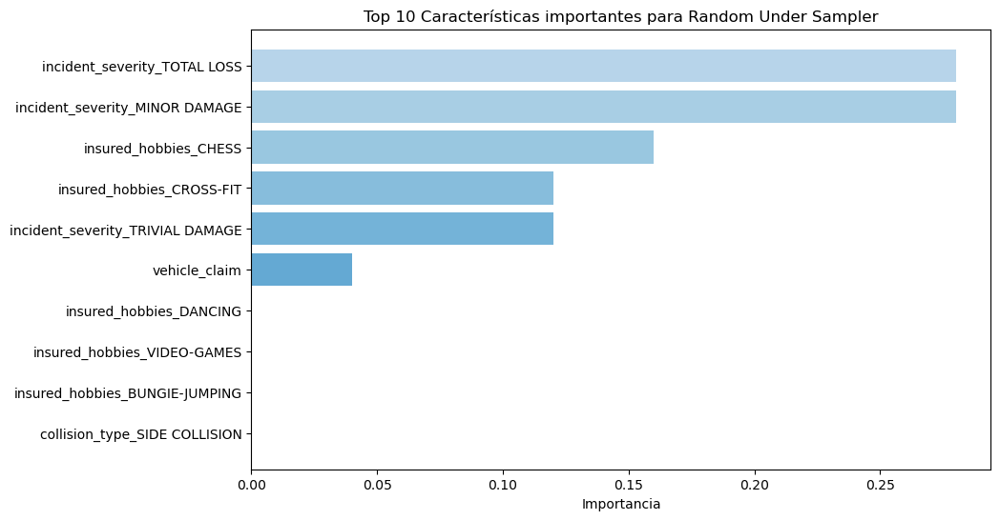

In [160]:
# Graficamos todas las características y su importancia en el dataset
# Iteramos sobre cada conjunto de datos
for i, (X_train, y_train, X_test, y_test,dataset_name) in enumerate(datasets):
    best_pipeline = best_models[i] 
    
    # Obtenemos las importancias de las características del modelo Ada
    ada_model = best_pipeline.named_steps['ada']
    importances = ada_model.feature_importances_
    
    # Obtenemos las características seleccionadas por RFECV
    selector = best_pipeline.named_steps['feature_selection']
    selected_columns = X_train.columns[selector.support_]

    # Ordenamos las importancias de mayor a menor
    indices = np.argsort(importances)[::-1]
    top_n = min(len(importances), 10)
    top_indices = indices[:top_n]
    top_importances = importances[top_indices]

    # Graficamos las importancias
    colors = Blues(np.linspace(0.3, 0.7, top_n))
    plt.figure(figsize=(10, 6))
    plt.title(f"Top 10 Características importantes para {dataset_name}")
    plt.barh(range(top_n), top_importances, color=colors, align="center")
    plt.yticks(range(top_n), selected_columns[top_indices])
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis()
    plt.show()

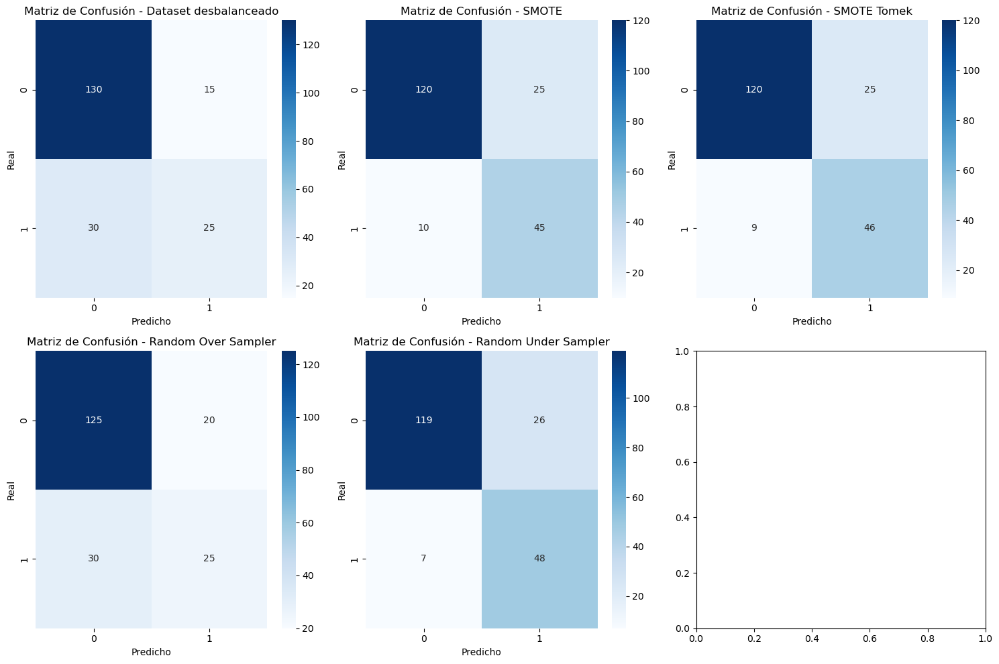

In [161]:
# Grafica de matrices de confusión

# Configuramos la figura para varias matrices de confusión
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, matrix in enumerate(Matriz_confusion_ada['Confusion Matrix']):
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Blues', ax=axes[i])
    # Usamos 'matrix' para graficar la matriz de confusión correspondiente
    dataset_name = Matriz_confusion_ada['Dataset'][i]
    axes[i].set_title(f'Matriz de Confusión - {dataset_name}')
    axes[i].set_xlabel('Predicho')
    axes[i].set_ylabel('Real')

plt.tight_layout()
plt.show()

Veamos el mejor dataset para el algoritmo de ADA BOOST

In [162]:
best_ADA = results_ada[results_ada['Dataset'] == 'Random Under Sampler']
best_ADA['Model'] = 'ADA BOOST'
best_ADA

,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros,Model
4,Random Under Sampler,0.83,0.65,0.87,0.74,0.87,"{'ada__n_estimators': 50, 'ada__learning_rate'...",ADA BOOST


# Resultados

In [167]:
# Creamos la tabla para los modelos con seleccion de caracteristicas
dataframes_seleccion = [results_log, results_rf, results_dtree, results_GB, results_ada]
nombres_tablas = ['Regression logistica CV', 'Random Forest', 'Decision tree', 'Gradient Boost',  'Ada Boosting']

for nombre_tabla, dataframe in zip(nombres_tablas, dataframes_seleccion):
    dataframe['Modelo'] = nombre_tabla


tabla_unificada = pd.concat(dataframes_seleccion, ignore_index=True)
columnas = ['Modelo'] + [col for col in tabla_unificada.columns if col != 'Nombre_Tabla']
tabla_unificada = tabla_unificada[columnas]
display(tabla_unificada)

,Modelo,Dataset,Accuracy,Precision,Recall,F1-Score,ROC AUC,Mejores hiperparametros,Modelo
0,Regression logistica CV,Dataset desbalanceado,0.84,0.66,0.85,0.75,0.84,"{'reg_log__solver': 'saga', 'reg_log__penalty'...",Regression logistica CV
1,Regression logistica CV,SMOTE,0.84,0.67,0.84,0.74,0.85,"{'reg_log__solver': 'saga', 'reg_log__penalty'...",Regression logistica CV
2,Regression logistica CV,SMOTE Tomek,0.83,0.66,0.84,0.74,0.84,"{'reg_log__solver': 'saga', 'reg_log__penalty'...",Regression logistica CV
3,Regression logistica CV,Random Over Sampler,0.83,0.65,0.87,0.74,0.85,"{'reg_log__solver': 'saga', 'reg_log__penalty'...",Regression logistica CV
4,Regression logistica CV,Random Under Sampler,0.83,0.65,0.87,0.74,0.85,"{'reg_log__solver': 'saga', 'reg_log__penalty'...",Regression logistica CV
5,Random Forest,Dataset desbalanceado,0.79,0.62,0.60,0.61,0.85,"{'rf__n_estimators': 100, 'rf__max_features': ...",Random Forest
6,Random Forest,SMOTE,0.78,0.60,0.58,0.59,0.84,"{'rf__n_estimators': 200, 'rf__max_features': ...",Random Forest
7,Random Forest,SMOTE Tomek,0.81,0.65,0.65,0.65,0.83,"{'rf__n_estimators': 200, 'rf__max_features': ...",Random Forest
8,Random Forest,Random Over Sampler,0.77,0.58,0.53,0.55,0.82,"{'rf__n_estimators': 100, 'rf__max_features': ...",Random Forest
9,Random Forest,Random Under Sampler,0.81,0.63,0.80,0.70,0.82,"{'rf__n_estimators': 200, 'rf__max_features': ...",Random Forest
